In [ ]:
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
import math as mt
import random 
import copy as cp

In [ ]:
from google.colab import drive
drive.mount('/content/drive' , force_remount = True)

Mounted at /content/drive


In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Project/train.tsv" , sep= '\t')
mod_data = pd.DataFrame({"Id":[] , "EssaySet" :[] , "Score1" : [] , "Score2" : [] , "EssayText" : []})
for i in range(1,3):
  k = data.loc[data["EssaySet"] == i]
  mod_data = pd.concat([mod_data,k])
mod_data.describe()
scores1 = np.array(mod_data['Score1'].tolist())
scores2 = np.array(mod_data['Score2'].tolist())
Eset = np.array(mod_data['EssaySet'].tolist()).reshape(-1,1)
scores = (scores1 + scores2)/2
scores = scores.reshape(-1,1)
labels = np.concatenate((scores, Eset) , axis =1)
labels.shape

(2950, 2)

In [ ]:
#Load vectors Here
#=======Load Vectors==================#

inputs_all = np.load('/content/drive/MyDrive/Project/all_vecFile_12 _final.npy')
print(inputs_all.shape)
# predicting the scores

from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader
X_train,X_test,Y_train,Y_test = train_test_split(inputs_all, labels , test_size=0.2, random_state=33)

X_train = torch.Tensor(X_train)
X_test = torch.Tensor(X_test)
Y_train = torch.Tensor(Y_train)
Y_test = torch.Tensor(Y_test)

train = TensorDataset(X_train , Y_train)
test = TensorDataset(X_test , Y_test)

train_loader = DataLoader(train, batch_size=20, shuffle=False)
test_loader = DataLoader(test, batch_size=20, shuffle=False)

(2950, 42, 300)


In [ ]:
!pip install git+https://github.com/janfreyberg/pytorch-revgrad.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/janfreyberg/pytorch-revgrad.git to /tmp/pip-req-build-debio0jh
  Running command git clone --filter=blob:none --quiet https://github.com/janfreyberg/pytorch-revgrad.git /tmp/pip-req-build-debio0jh
  Resolved https://github.com/janfreyberg/pytorch-revgrad.git to commit 449fa763a76d108ad4da526b5e5ea90398be3080
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pytorch_revgrad: filename=pytorch_revgrad-0.2.0-py3-none-any.whl size=4550 sha256=02b476905e0173d2e9549f301c8cb82d3e5e7ae4b3aec2c89cc0cbb17c4e2613
  Stored in directory: /tmp/pip-ephem-wheel-cache-i25jtahc/wheels/cd/dd/05/695cdfbae6d3bf4a8fa65a1fe95d9d0b532c7d792a328490c3
Successfully built pytorch_revgrad


In [ ]:
import math
import torch
import torch.nn as nn
import torch.utils
import torch.utils.data
from torch.autograd import Variable
import matplotlib.pyplot as plt 
from pytorch_revgrad import RevGrad

# loading local VRNN hidden vectors
hidden_locals = np.load("/content/drive/MyDrive/Project/hiddens_final.npy")

# changing device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
EPS = torch.finfo(torch.float).eps # numerical logs
hidden_locals = torch.from_numpy(hidden_locals)


class VRNN(nn.Module):
    def __init__(self, x_dim, h_dim, z_dim, n_layers, output_dims, domains ,  bias=False):
        super(VRNN, self).__init__()

        self.x_dim = x_dim
        self.h_dim = h_dim
        self.z_dim = z_dim
        self.n_layers = n_layers
        self.domains = domains
        self.output_dims = output_dims

        #feature-extracting transformations
        self.phi_x = nn.Sequential(
            nn.Linear(x_dim, h_dim),
            nn.ReLU(),
            nn.Linear(h_dim, h_dim),
            nn.ReLU())
        self.phi_z = nn.Sequential(
            nn.Linear(z_dim, h_dim),
            nn.ReLU())

        #encoder
        self.enc = nn.Sequential(
            nn.Linear(h_dim + h_dim, h_dim),
            nn.ReLU(),
            nn.Linear(h_dim, h_dim),
            nn.ReLU())
        self.enc_mean = nn.Linear(h_dim, z_dim)
        self.enc_std = nn.Sequential(
            nn.Linear(h_dim, z_dim),
            nn.Softplus())

        #prior
        self.prior = nn.Sequential(
            nn.Linear(h_dim, h_dim),
            nn.ReLU())
        self.prior_mean = nn.Linear(h_dim, z_dim)
        self.prior_std = nn.Sequential(
            nn.Linear(h_dim, z_dim),
            nn.Softplus())

        #decoder
        self.dec = nn.Sequential(
            nn.Linear(h_dim + h_dim, h_dim),
            nn.ReLU(),
            nn.Linear(h_dim, h_dim),
            nn.ReLU())
        self.dec_std = nn.Sequential(
            nn.Linear(h_dim, x_dim),
            nn.Softplus())
        #self.dec_mean = nn.Linear(h_dim, x_dim)
        self.dec_mean = nn.Sequential(
            nn.Linear(h_dim, x_dim),
            nn.Sigmoid())

        #recurrence
        self.rnn = nn.LSTM(h_dim + h_dim, h_dim, n_layers, bias)

        # Classifier 
        self.classifier = nn.Sequential(
            nn.Linear(h_dim, output_dims),
            nn.Softmax(dim=1))

        # Domain Disciminator
        self.discriminator = nn.Sequential(
            nn.Linear(h_dim , domains),
            nn.Softmax(dim=1),
            RevGrad())

    def forward(self, x ):

        all_enc_mean, all_enc_std = [], []
        all_dec_mean, all_dec_std = [], []
        kld_loss = 0
        nll_loss = 0
        out = []

        h = torch.zeros(self.n_layers, x.size(1), self.h_dim, device=device)
        for t in range(x.size(0)):
            phi_x_t = self.phi_x(x[t])

            #encoder
            enc_t = self.enc(torch.cat([phi_x_t, h[-1]], 1))
            enc_mean_t = self.enc_mean(enc_t)
            enc_std_t = self.enc_std(enc_t) 
            #prior
            prior_t = self.prior(h[-1])
            prior_mean_t = self.prior_mean(prior_t)
            prior_std_t = self.prior_std(prior_t)

            #sampling and reparameterization
            z_t = self._reparameterized_sample(enc_mean_t, enc_std_t)
            phi_z_t = self.phi_z(z_t)

            #decoder
            dec_t = self.dec(torch.cat([phi_z_t, h[-1]], 1))
            dec_mean_t = self.dec_mean(dec_t)
            dec_std_t = self.dec_std(dec_t)

            #recurrence
            out , h = self.rnn(torch.cat([phi_x_t, phi_z_t], 1).unsqueeze(0), h)

            #computing losses
            kld_loss += self._kld_gauss(enc_mean_t, enc_std_t, prior_mean_t, prior_std_t)
            #nll_loss += self._nll_gauss(dec_mean_t, dec_std_t, x[t])
            nll_loss += self._nll_bernoulli(dec_mean_t, x[t])

        # Computing Diff Loss
        #taking the last hidden layer and computing l2 norm with the local VRNN hiddens
        fin_hidden = h[:,-1,:]
        diff_loss = float(torch.sum(fin_hidden * hidden_locals))


        # The last hidden computed layer , will be utilized for domain discriminator and domain classifier
        class_vector = self.classifier(out)[0]
        domain_vector = self.discriminator(out)[0]

        return kld_loss, nll_loss, h , class_vector.data , domain_vector.data , diff_loss ,\
            (all_enc_mean, all_enc_std), \
            (all_dec_mean, all_dec_std)


    def sample(self, seq_len):

        sample = torch.zeros(seq_len, self.x_dim, device=device)

        h = torch.zeros(self.n_layers, 1, self.h_dim, device=device)
        for t in range(seq_len):

            #prior
            prior_t = self.prior(h[-1])
            prior_mean_t = self.prior_mean(prior_t)
            prior_std_t = self.prior_std(prior_t)

            #sampling and reparameterization
            z_t = self._reparameterized_sample(prior_mean_t, prior_std_t)
            phi_z_t = self.phi_z(z_t)

            #decoder
            dec_t = self.dec(torch.cat([phi_z_t, h[-1]], 1))
            dec_mean_t = self.dec_mean(dec_t)
            #dec_std_t = self.dec_std(dec_t)

            phi_x_t = self.phi_x(dec_mean_t)

            #recurrence
            _, h = self.rnn(torch.cat([phi_x_t, phi_z_t], 1).unsqueeze(0), h)

            sample[t] = dec_mean_t.data

        return sample


    def reset_parameters(self, stdv=1e-1):
        for weight in self.parameters():
            weight.data.normal_(0, stdv)


    def _init_weights(self, stdv):
        pass


    def _reparameterized_sample(self, mean, std):
        """using std to sample"""
        eps = torch.empty(size=std.size(), device=device, dtype=torch.float).normal_()
        return eps.mul(std).add_(mean)


    def _kld_gauss(self, mean_1, std_1, mean_2, std_2):
        """Using std to compute KLD"""

        kld_element =  (2 * torch.log(std_2 + EPS) - 2 * torch.log(std_1 + EPS) + 
            (std_1.pow(2) + (mean_1 - mean_2).pow(2)) /
            std_2.pow(2) - 1)
        return	0.5 * torch.sum(kld_element)


    def _nll_bernoulli(self, theta, x):
        return - torch.sum(x*torch.log(theta + EPS) + (1-x)*torch.log(1-theta-EPS))


    def _nll_gauss(self, mean, std, x):
        return torch.sum(torch.log(std + EPS) + torch.log(2*torch.pi)/2 + (x - mean).pow(2)/(2*std.pow(2)))

In [ ]:
domains = 2
classes = len(np.unique(scores))
batch_size = 20

def cls_dom_loss(labels , class_vector , domain_vector):
  loss = 0
  for i in range(batch_size):
    class_label = labels[i][0]
    domain_label = labels[i][1]
    CEloss1 = - (mt.log(class_vector[i][int(class_label*2)]))/classes
    CEloss2 = - (mt.log(domain_vector[i][int(domain_label-1)]))/domains
  loss = loss + CEloss1 + CEloss2
  return loss

Train Epoch: 1 [0/2360 (0%)]	 KLD Loss: 4.778011 	 NLL Loss: 8737.309570


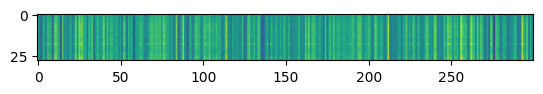

Train Epoch: 1 [200/2360 (8%)]	 KLD Loss: 0.543394 	 NLL Loss: 8674.320312


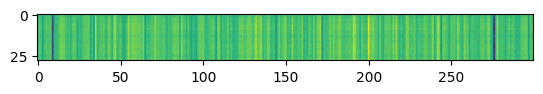

Train Epoch: 1 [400/2360 (17%)]	 KLD Loss: 0.351291 	 NLL Loss: 8648.286133


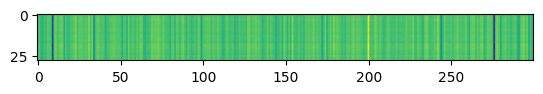

Train Epoch: 1 [600/2360 (25%)]	 KLD Loss: 0.112687 	 NLL Loss: 8599.472656


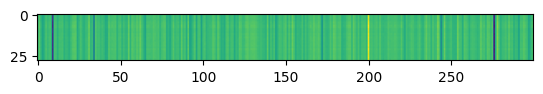

Train Epoch: 1 [800/2360 (34%)]	 KLD Loss: 0.074185 	 NLL Loss: 8643.826172


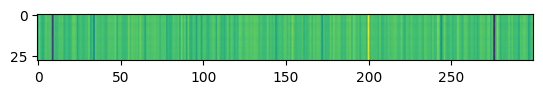

Train Epoch: 1 [1000/2360 (42%)]	 KLD Loss: 0.065740 	 NLL Loss: 8644.618164


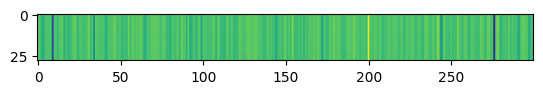

Train Epoch: 1 [1200/2360 (51%)]	 KLD Loss: 0.028946 	 NLL Loss: 8639.641602


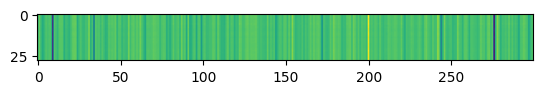

Train Epoch: 1 [1400/2360 (59%)]	 KLD Loss: 0.027347 	 NLL Loss: 8663.336914


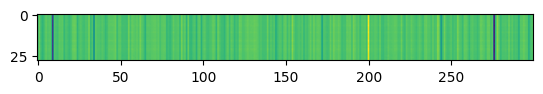

Train Epoch: 1 [1600/2360 (68%)]	 KLD Loss: 0.032700 	 NLL Loss: 8645.138672


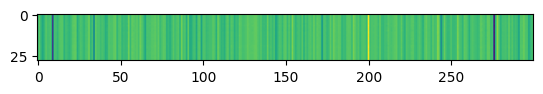

Train Epoch: 1 [1800/2360 (76%)]	 KLD Loss: 0.018192 	 NLL Loss: 8642.857422


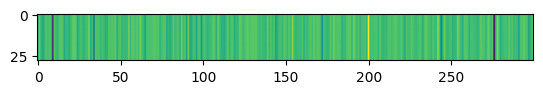

Train Epoch: 1 [2000/2360 (85%)]	 KLD Loss: 0.012077 	 NLL Loss: 8654.705078


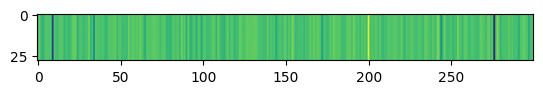

Train Epoch: 1 [2200/2360 (93%)]	 KLD Loss: 0.009516 	 NLL Loss: 8639.611328


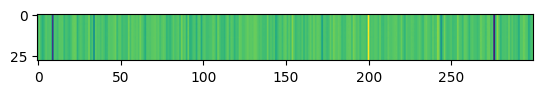

====> Epoch: 1 Average loss: 9254.0353
====> Test set loss: KLD Loss = 0.0084, NLL Loss = 8603.1677 
Train Epoch: 2 [0/2360 (0%)]	 KLD Loss: 0.008341 	 NLL Loss: 8644.551758


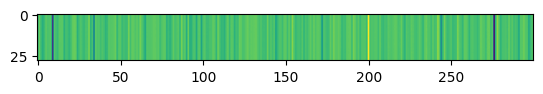

Train Epoch: 2 [200/2360 (8%)]	 KLD Loss: 0.007186 	 NLL Loss: 8651.209961


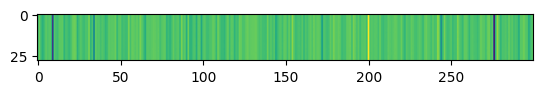

Train Epoch: 2 [400/2360 (17%)]	 KLD Loss: 0.006667 	 NLL Loss: 8644.083984


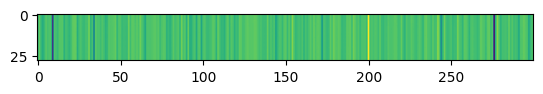

Train Epoch: 2 [600/2360 (25%)]	 KLD Loss: 0.005872 	 NLL Loss: 8596.501953


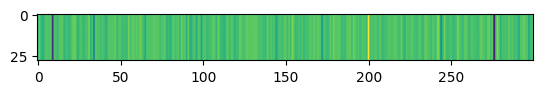

Train Epoch: 2 [800/2360 (34%)]	 KLD Loss: 0.005249 	 NLL Loss: 8643.852539


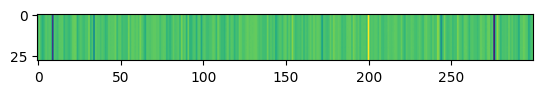

Train Epoch: 2 [1000/2360 (42%)]	 KLD Loss: 0.004865 	 NLL Loss: 8645.721680


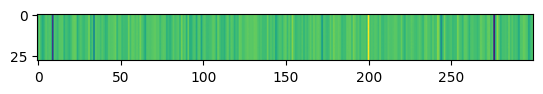

Train Epoch: 2 [1200/2360 (51%)]	 KLD Loss: 0.004820 	 NLL Loss: 8638.791992


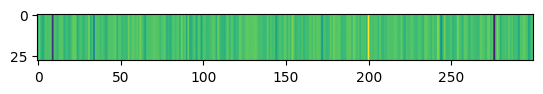

Train Epoch: 2 [1400/2360 (59%)]	 KLD Loss: 0.005043 	 NLL Loss: 8664.038086


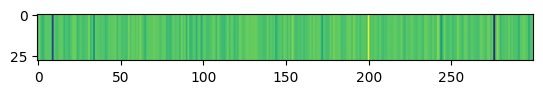

Train Epoch: 2 [1600/2360 (68%)]	 KLD Loss: 0.004248 	 NLL Loss: 8646.291992


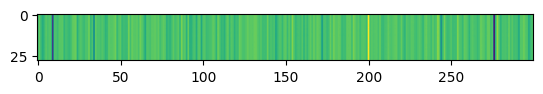

Train Epoch: 2 [1800/2360 (76%)]	 KLD Loss: 0.004002 	 NLL Loss: 8644.302734


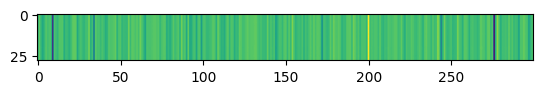

Train Epoch: 2 [2000/2360 (85%)]	 KLD Loss: 0.004042 	 NLL Loss: 8652.400391


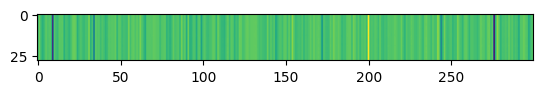

Train Epoch: 2 [2200/2360 (93%)]	 KLD Loss: 0.005960 	 NLL Loss: 8642.012695


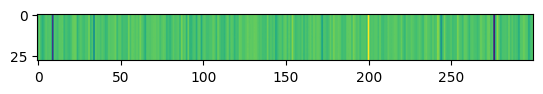

====> Epoch: 2 Average loss: 9245.4780
====> Test set loss: KLD Loss = 0.0044, NLL Loss = 8603.5261 
Train Epoch: 3 [0/2360 (0%)]	 KLD Loss: 0.003946 	 NLL Loss: 8644.094727


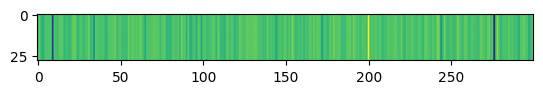

Train Epoch: 3 [200/2360 (8%)]	 KLD Loss: 0.004223 	 NLL Loss: 8649.025391


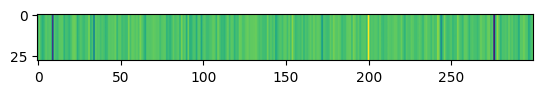

Train Epoch: 3 [400/2360 (17%)]	 KLD Loss: 0.003461 	 NLL Loss: 8645.082031


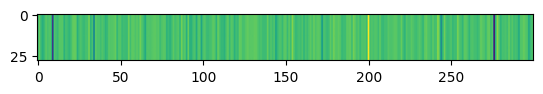

Train Epoch: 3 [600/2360 (25%)]	 KLD Loss: 0.003140 	 NLL Loss: 8596.681641


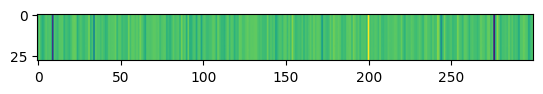

Train Epoch: 3 [800/2360 (34%)]	 KLD Loss: 0.002600 	 NLL Loss: 8643.951172


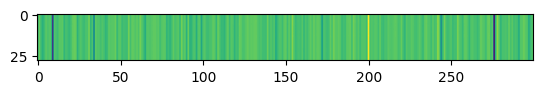

Train Epoch: 3 [1000/2360 (42%)]	 KLD Loss: 0.002385 	 NLL Loss: 8646.267578


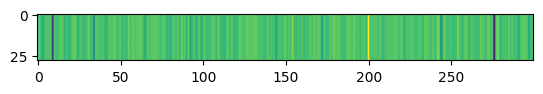

Train Epoch: 3 [1200/2360 (51%)]	 KLD Loss: 0.002548 	 NLL Loss: 8638.820312


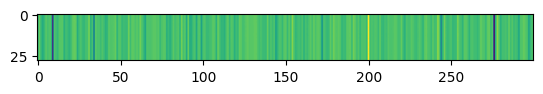

Train Epoch: 3 [1400/2360 (59%)]	 KLD Loss: 0.003299 	 NLL Loss: 8657.313477


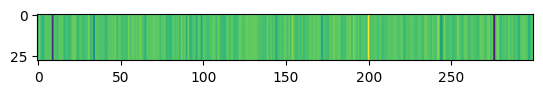

Train Epoch: 3 [1600/2360 (68%)]	 KLD Loss: 0.002484 	 NLL Loss: 8648.927734


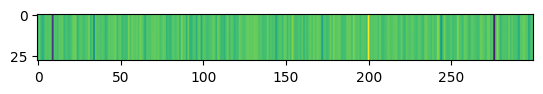

Train Epoch: 3 [1800/2360 (76%)]	 KLD Loss: 0.002370 	 NLL Loss: 8644.031250


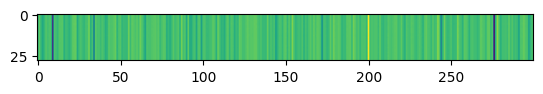

Train Epoch: 3 [2000/2360 (85%)]	 KLD Loss: 0.003543 	 NLL Loss: 8648.673828


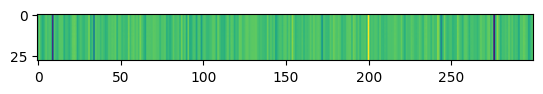

Train Epoch: 3 [2200/2360 (93%)]	 KLD Loss: 0.003834 	 NLL Loss: 8642.966797


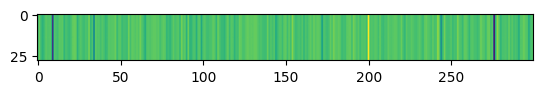

====> Epoch: 3 Average loss: 9245.2775
====> Test set loss: KLD Loss = 0.0026, NLL Loss = 8602.9855 
Train Epoch: 4 [0/2360 (0%)]	 KLD Loss: 0.002745 	 NLL Loss: 8645.038086


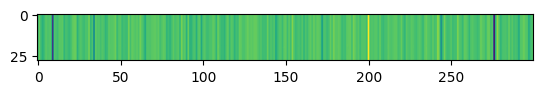

Train Epoch: 4 [200/2360 (8%)]	 KLD Loss: 0.002246 	 NLL Loss: 8647.608398


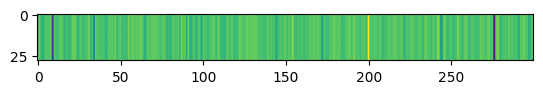

Train Epoch: 4 [400/2360 (17%)]	 KLD Loss: 0.002124 	 NLL Loss: 8645.418945


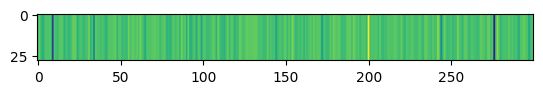

Train Epoch: 4 [600/2360 (25%)]	 KLD Loss: 0.002126 	 NLL Loss: 8596.720703


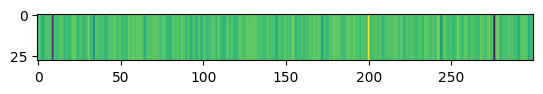

Train Epoch: 4 [800/2360 (34%)]	 KLD Loss: 0.002109 	 NLL Loss: 8643.967773


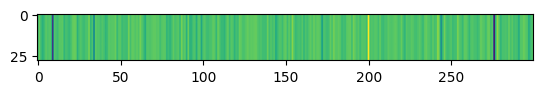

Train Epoch: 4 [1000/2360 (42%)]	 KLD Loss: 0.001484 	 NLL Loss: 8646.642578


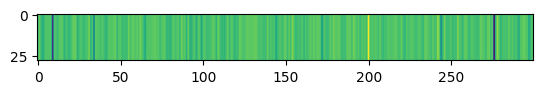

Train Epoch: 4 [1200/2360 (51%)]	 KLD Loss: 0.001497 	 NLL Loss: 8638.865234


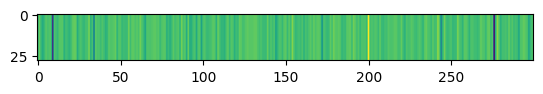

Train Epoch: 4 [1400/2360 (59%)]	 KLD Loss: 0.001484 	 NLL Loss: 8652.048828


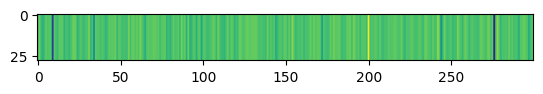

Train Epoch: 4 [1600/2360 (68%)]	 KLD Loss: 0.001607 	 NLL Loss: 8651.593750


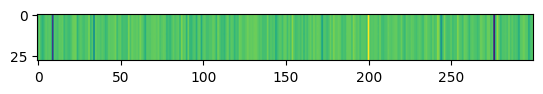

Train Epoch: 4 [1800/2360 (76%)]	 KLD Loss: 0.001513 	 NLL Loss: 8643.614258


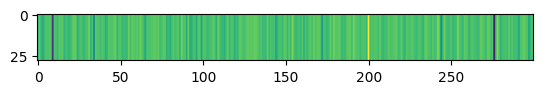

Train Epoch: 4 [2000/2360 (85%)]	 KLD Loss: 0.001432 	 NLL Loss: 8645.709961


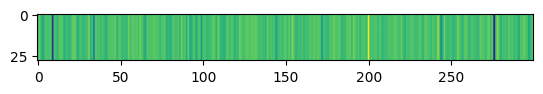

Train Epoch: 4 [2200/2360 (93%)]	 KLD Loss: 0.002634 	 NLL Loss: 8643.076172


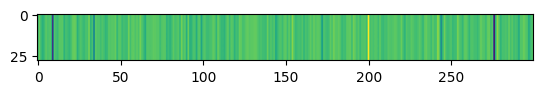

====> Epoch: 4 Average loss: 9244.9577
====> Test set loss: KLD Loss = 0.0019, NLL Loss = 8602.6610 
Train Epoch: 5 [0/2360 (0%)]	 KLD Loss: 0.002067 	 NLL Loss: 8645.985352


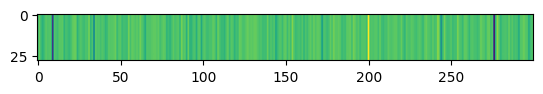

Train Epoch: 5 [200/2360 (8%)]	 KLD Loss: 0.001446 	 NLL Loss: 8647.066406


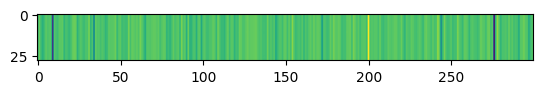

Train Epoch: 5 [400/2360 (17%)]	 KLD Loss: 0.001248 	 NLL Loss: 8645.548828


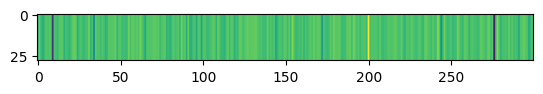

Train Epoch: 5 [600/2360 (25%)]	 KLD Loss: 0.001406 	 NLL Loss: 8596.766602


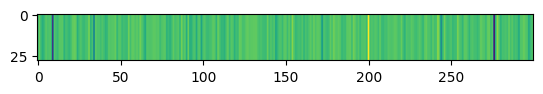

Train Epoch: 5 [800/2360 (34%)]	 KLD Loss: 0.002054 	 NLL Loss: 8643.958984


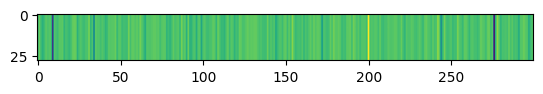

Train Epoch: 5 [1000/2360 (42%)]	 KLD Loss: 0.001148 	 NLL Loss: 8646.897461


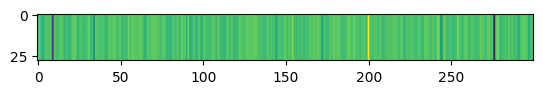

Train Epoch: 5 [1200/2360 (51%)]	 KLD Loss: 0.001069 	 NLL Loss: 8638.976562


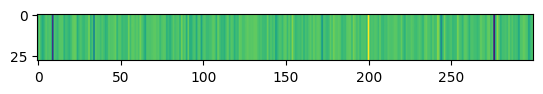

Train Epoch: 5 [1400/2360 (59%)]	 KLD Loss: 0.001152 	 NLL Loss: 8648.657227


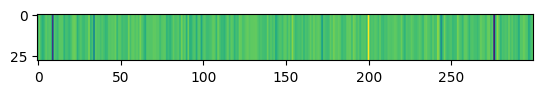

Train Epoch: 5 [1600/2360 (68%)]	 KLD Loss: 0.001294 	 NLL Loss: 8653.251953


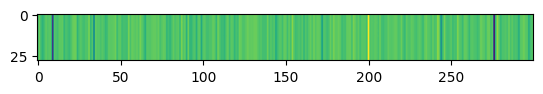

Train Epoch: 5 [1800/2360 (76%)]	 KLD Loss: 0.001007 	 NLL Loss: 8643.341797


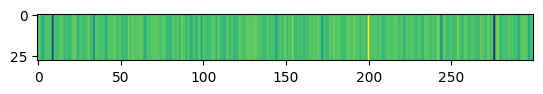

Train Epoch: 5 [2000/2360 (85%)]	 KLD Loss: 0.001052 	 NLL Loss: 8644.705078


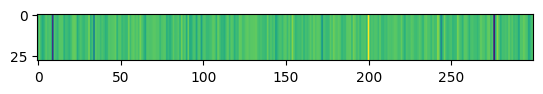

Train Epoch: 5 [2200/2360 (93%)]	 KLD Loss: 0.002448 	 NLL Loss: 8642.004883


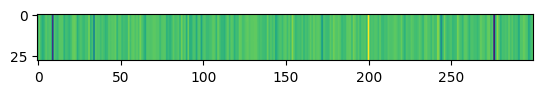

====> Epoch: 5 Average loss: 9244.6178
====> Test set loss: KLD Loss = 0.0017, NLL Loss = 8602.5612 
Train Epoch: 6 [0/2360 (0%)]	 KLD Loss: 0.001853 	 NLL Loss: 8646.521484


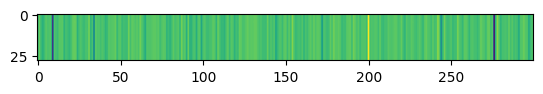

Train Epoch: 6 [200/2360 (8%)]	 KLD Loss: 0.001529 	 NLL Loss: 8647.359375


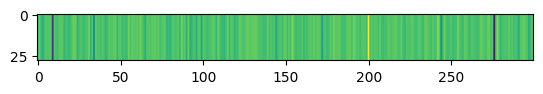

Train Epoch: 6 [400/2360 (17%)]	 KLD Loss: 0.001209 	 NLL Loss: 8645.640625


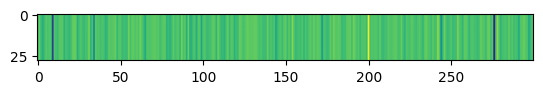

Train Epoch: 6 [600/2360 (25%)]	 KLD Loss: 0.000924 	 NLL Loss: 8596.820312


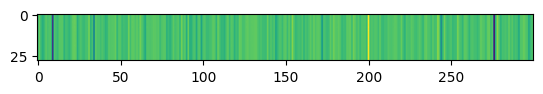

Train Epoch: 6 [800/2360 (34%)]	 KLD Loss: 0.001577 	 NLL Loss: 8643.915039


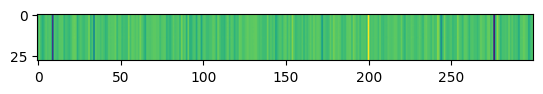

Train Epoch: 6 [1000/2360 (42%)]	 KLD Loss: 0.000978 	 NLL Loss: 8647.035156


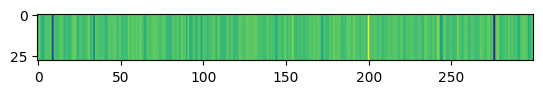

Train Epoch: 6 [1200/2360 (51%)]	 KLD Loss: 0.000983 	 NLL Loss: 8639.142578


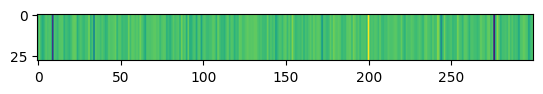

Train Epoch: 6 [1400/2360 (59%)]	 KLD Loss: 0.001181 	 NLL Loss: 8646.789062


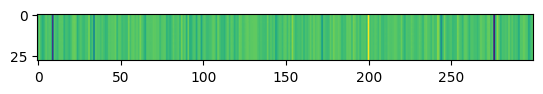

Train Epoch: 6 [1600/2360 (68%)]	 KLD Loss: 0.001175 	 NLL Loss: 8653.529297


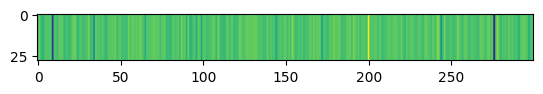

Train Epoch: 6 [1800/2360 (76%)]	 KLD Loss: 0.006204 	 NLL Loss: 8643.478516


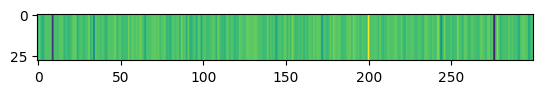

Train Epoch: 6 [2000/2360 (85%)]	 KLD Loss: 0.016169 	 NLL Loss: 8644.524414


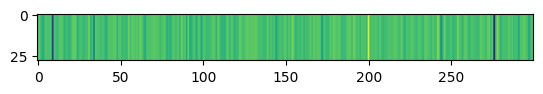

Train Epoch: 6 [2200/2360 (93%)]	 KLD Loss: 0.005758 	 NLL Loss: 8641.065430


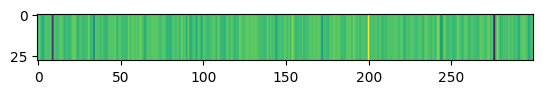

====> Epoch: 6 Average loss: 9244.3344
====> Test set loss: KLD Loss = 0.0030, NLL Loss = 8602.5901 
Train Epoch: 7 [0/2360 (0%)]	 KLD Loss: 0.002729 	 NLL Loss: 8646.441406


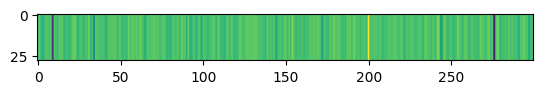

Train Epoch: 7 [200/2360 (8%)]	 KLD Loss: 0.001536 	 NLL Loss: 8647.600586


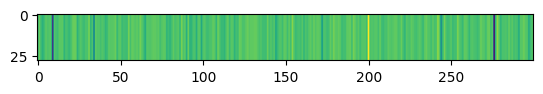

Train Epoch: 7 [400/2360 (17%)]	 KLD Loss: 0.001300 	 NLL Loss: 8645.947266


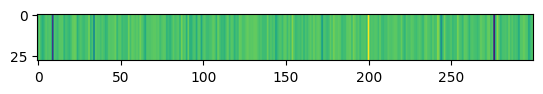

Train Epoch: 7 [600/2360 (25%)]	 KLD Loss: 0.002101 	 NLL Loss: 8596.852539


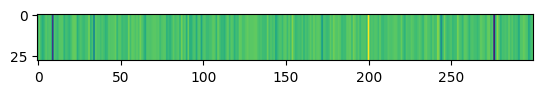

Train Epoch: 7 [800/2360 (34%)]	 KLD Loss: 0.000714 	 NLL Loss: 8643.818359


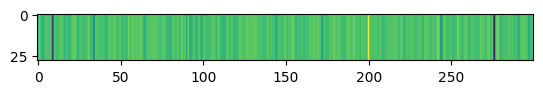

Train Epoch: 7 [1000/2360 (42%)]	 KLD Loss: 0.000716 	 NLL Loss: 8647.116211


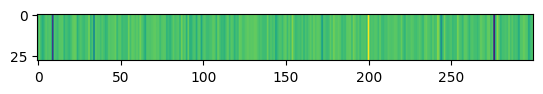

Train Epoch: 7 [1200/2360 (51%)]	 KLD Loss: 0.000822 	 NLL Loss: 8639.310547


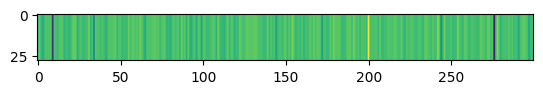

Train Epoch: 7 [1400/2360 (59%)]	 KLD Loss: 0.000908 	 NLL Loss: 8645.751953


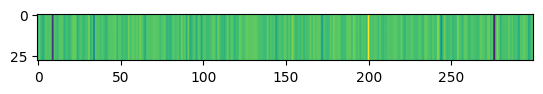

Train Epoch: 7 [1600/2360 (68%)]	 KLD Loss: 0.000607 	 NLL Loss: 8653.336914


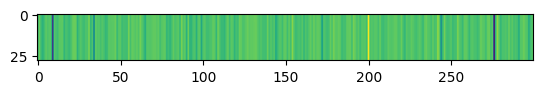

Train Epoch: 7 [1800/2360 (76%)]	 KLD Loss: 0.000653 	 NLL Loss: 8643.798828


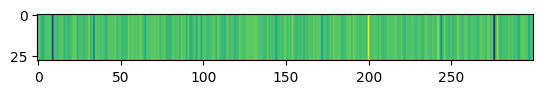

Train Epoch: 7 [2000/2360 (85%)]	 KLD Loss: 0.000706 	 NLL Loss: 8644.560547


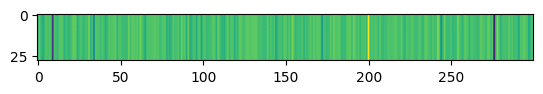

Train Epoch: 7 [2200/2360 (93%)]	 KLD Loss: 0.001700 	 NLL Loss: 8640.546875


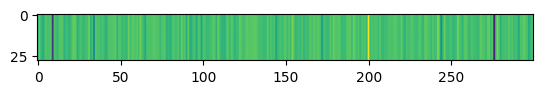

====> Epoch: 7 Average loss: 9244.1291
====> Test set loss: KLD Loss = 0.0013, NLL Loss = 8602.5865 
Train Epoch: 8 [0/2360 (0%)]	 KLD Loss: 0.001343 	 NLL Loss: 8646.123047


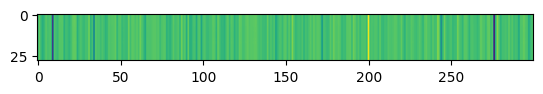

Train Epoch: 8 [200/2360 (8%)]	 KLD Loss: 0.000826 	 NLL Loss: 8647.521484


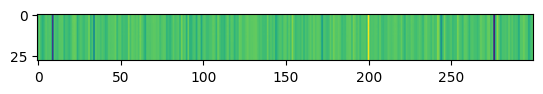

Train Epoch: 8 [400/2360 (17%)]	 KLD Loss: 0.000885 	 NLL Loss: 8646.141602


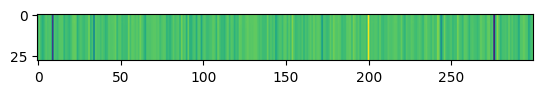

Train Epoch: 8 [600/2360 (25%)]	 KLD Loss: 0.001539 	 NLL Loss: 8596.708984


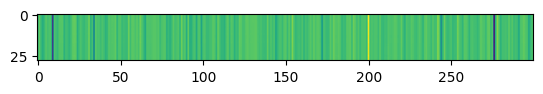

Train Epoch: 8 [800/2360 (34%)]	 KLD Loss: 0.000911 	 NLL Loss: 8643.605469


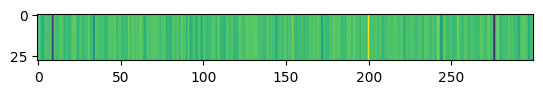

Train Epoch: 8 [1000/2360 (42%)]	 KLD Loss: 0.001201 	 NLL Loss: 8646.888672


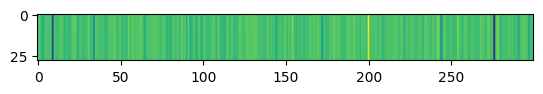

Train Epoch: 8 [1200/2360 (51%)]	 KLD Loss: 0.000905 	 NLL Loss: 8639.244141


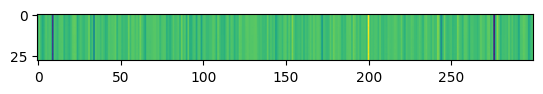

Train Epoch: 8 [1400/2360 (59%)]	 KLD Loss: 0.001951 	 NLL Loss: 8645.850586


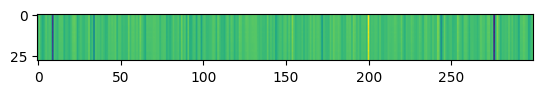

Train Epoch: 8 [1600/2360 (68%)]	 KLD Loss: 0.721912 	 NLL Loss: 8651.813477


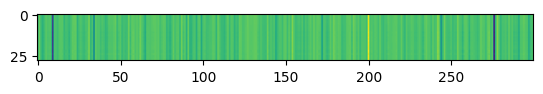

Train Epoch: 8 [1800/2360 (76%)]	 KLD Loss: 0.056409 	 NLL Loss: 8645.099609


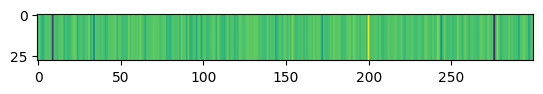

Train Epoch: 8 [2000/2360 (85%)]	 KLD Loss: 0.016084 	 NLL Loss: 8646.139648


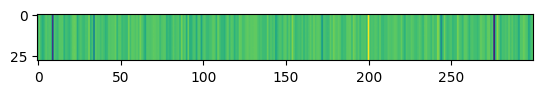

Train Epoch: 8 [2200/2360 (93%)]	 KLD Loss: 0.005012 	 NLL Loss: 8640.403320


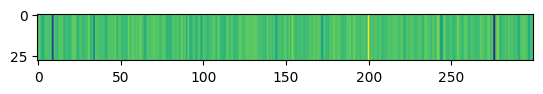

====> Epoch: 8 Average loss: 9243.9444
====> Test set loss: KLD Loss = 0.0029, NLL Loss = 8602.7298 
Train Epoch: 9 [0/2360 (0%)]	 KLD Loss: 0.002964 	 NLL Loss: 8645.490234


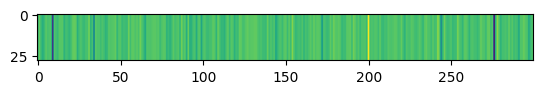

Train Epoch: 9 [200/2360 (8%)]	 KLD Loss: 0.001939 	 NLL Loss: 8647.037109


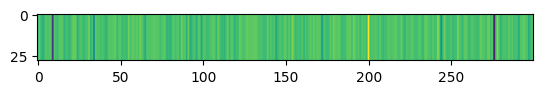

Train Epoch: 9 [400/2360 (17%)]	 KLD Loss: 0.001195 	 NLL Loss: 8646.483398


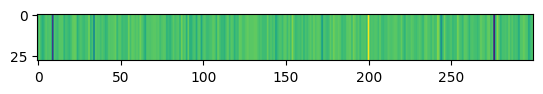

Train Epoch: 9 [600/2360 (25%)]	 KLD Loss: 0.000945 	 NLL Loss: 8596.719727


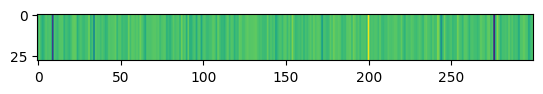

Train Epoch: 9 [800/2360 (34%)]	 KLD Loss: 0.001969 	 NLL Loss: 8643.724609


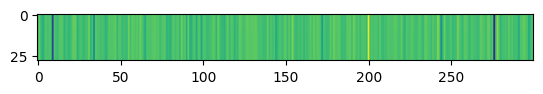

Train Epoch: 9 [1000/2360 (42%)]	 KLD Loss: 0.001081 	 NLL Loss: 8646.836914


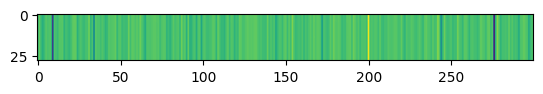

Train Epoch: 9 [1200/2360 (51%)]	 KLD Loss: 0.000886 	 NLL Loss: 8639.487305


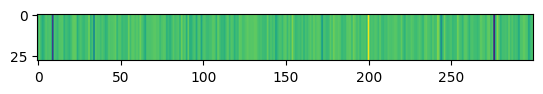

Train Epoch: 9 [1400/2360 (59%)]	 KLD Loss: 0.000995 	 NLL Loss: 8644.903320


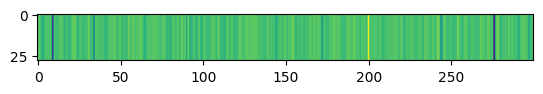

Train Epoch: 9 [1600/2360 (68%)]	 KLD Loss: 0.000616 	 NLL Loss: 8652.498047


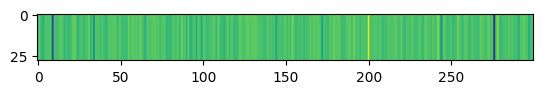

Train Epoch: 9 [1800/2360 (76%)]	 KLD Loss: 0.000545 	 NLL Loss: 8644.326172


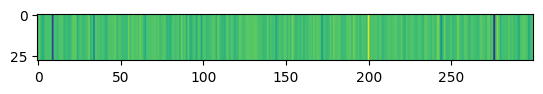

Train Epoch: 9 [2000/2360 (85%)]	 KLD Loss: 0.000767 	 NLL Loss: 8644.663086


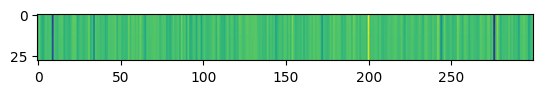

Train Epoch: 9 [2200/2360 (93%)]	 KLD Loss: 0.003344 	 NLL Loss: 8640.509766


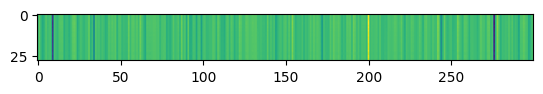

====> Epoch: 9 Average loss: 9243.8502
====> Test set loss: KLD Loss = 0.0006, NLL Loss = 8602.7409 
Train Epoch: 10 [0/2360 (0%)]	 KLD Loss: 0.000670 	 NLL Loss: 8645.161133


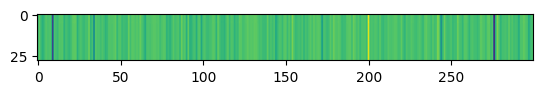

Train Epoch: 10 [200/2360 (8%)]	 KLD Loss: 0.000560 	 NLL Loss: 8646.862305


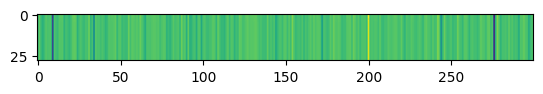

Train Epoch: 10 [400/2360 (17%)]	 KLD Loss: 0.000461 	 NLL Loss: 8646.659180


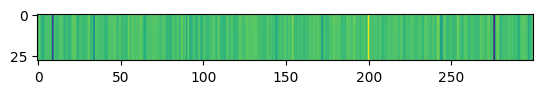

Train Epoch: 10 [600/2360 (25%)]	 KLD Loss: 0.000384 	 NLL Loss: 8596.568359


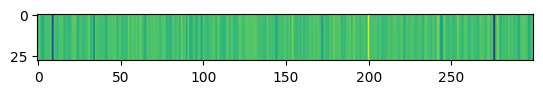

Train Epoch: 10 [800/2360 (34%)]	 KLD Loss: 0.000409 	 NLL Loss: 8643.473633


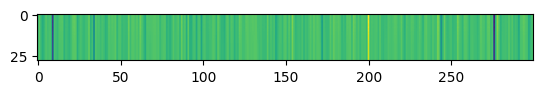

Train Epoch: 10 [1000/2360 (42%)]	 KLD Loss: 0.000577 	 NLL Loss: 8646.537109


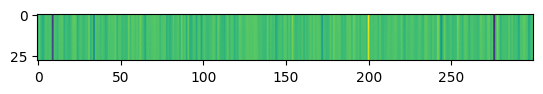

Train Epoch: 10 [1200/2360 (51%)]	 KLD Loss: 0.000413 	 NLL Loss: 8639.318359


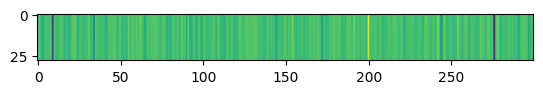

Train Epoch: 10 [1400/2360 (59%)]	 KLD Loss: 0.000523 	 NLL Loss: 8644.912109


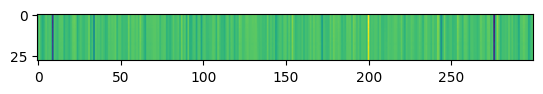

Train Epoch: 10 [1600/2360 (68%)]	 KLD Loss: 0.000836 	 NLL Loss: 8651.517578


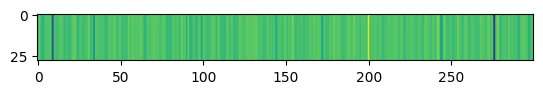

Train Epoch: 10 [1800/2360 (76%)]	 KLD Loss: 0.000541 	 NLL Loss: 8644.637695


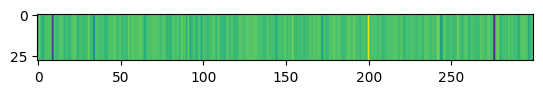

Train Epoch: 10 [2000/2360 (85%)]	 KLD Loss: 0.000494 	 NLL Loss: 8644.953125


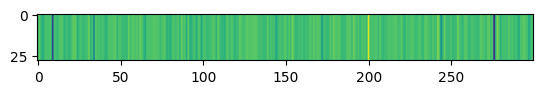

Train Epoch: 10 [2200/2360 (93%)]	 KLD Loss: 0.000210 	 NLL Loss: 8640.157227


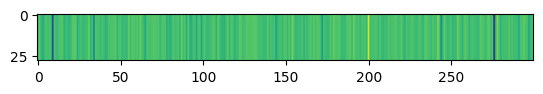

====> Epoch: 10 Average loss: 9243.6924
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.6234 
Train Epoch: 11 [0/2360 (0%)]	 KLD Loss: 0.000188 	 NLL Loss: 8645.504883


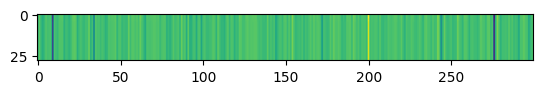

Train Epoch: 11 [200/2360 (8%)]	 KLD Loss: 0.000171 	 NLL Loss: 8646.935547


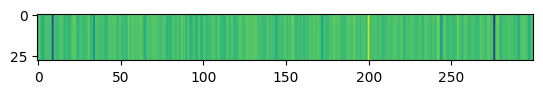

Train Epoch: 11 [400/2360 (17%)]	 KLD Loss: 0.000183 	 NLL Loss: 8646.544922


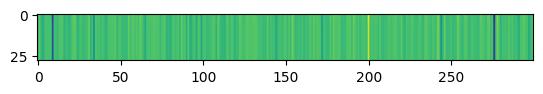

Train Epoch: 11 [600/2360 (25%)]	 KLD Loss: 0.000178 	 NLL Loss: 8596.499023


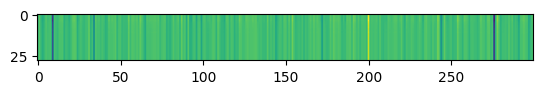

Train Epoch: 11 [800/2360 (34%)]	 KLD Loss: 0.000297 	 NLL Loss: 8643.517578


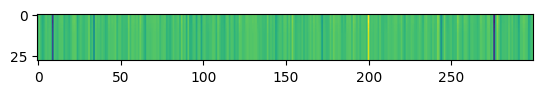

Train Epoch: 11 [1000/2360 (42%)]	 KLD Loss: 0.000249 	 NLL Loss: 8646.680664


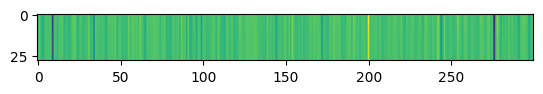

Train Epoch: 11 [1200/2360 (51%)]	 KLD Loss: 0.000259 	 NLL Loss: 8639.400391


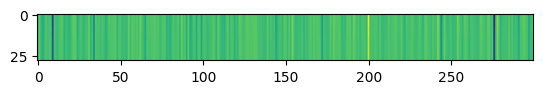

Train Epoch: 11 [1400/2360 (59%)]	 KLD Loss: 0.000273 	 NLL Loss: 8644.523438


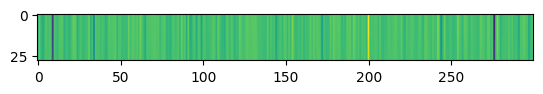

Train Epoch: 11 [1600/2360 (68%)]	 KLD Loss: 0.000632 	 NLL Loss: 8651.216797


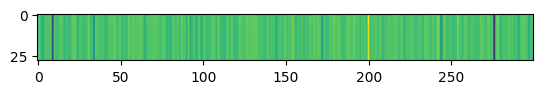

Train Epoch: 11 [1800/2360 (76%)]	 KLD Loss: 0.000190 	 NLL Loss: 8644.743164


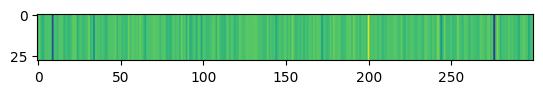

Train Epoch: 11 [2000/2360 (85%)]	 KLD Loss: 0.000234 	 NLL Loss: 8644.958984


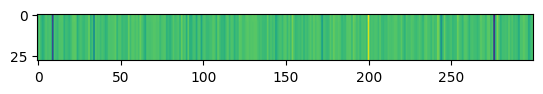

Train Epoch: 11 [2200/2360 (93%)]	 KLD Loss: 0.000199 	 NLL Loss: 8640.066406


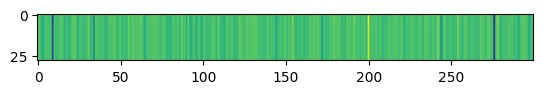

====> Epoch: 11 Average loss: 9243.5839
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.5581 
Train Epoch: 12 [0/2360 (0%)]	 KLD Loss: 0.000167 	 NLL Loss: 8645.389648


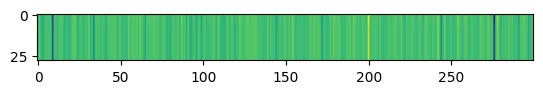

Train Epoch: 12 [200/2360 (8%)]	 KLD Loss: 0.000254 	 NLL Loss: 8646.737305


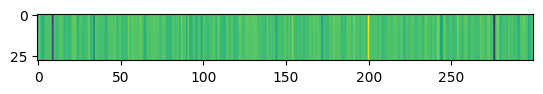

Train Epoch: 12 [400/2360 (17%)]	 KLD Loss: 0.000225 	 NLL Loss: 8646.409180


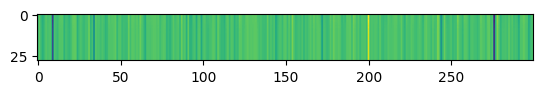

Train Epoch: 12 [600/2360 (25%)]	 KLD Loss: 0.000211 	 NLL Loss: 8596.388672


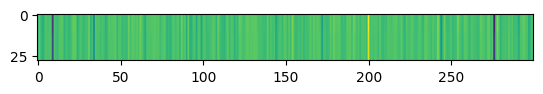

Train Epoch: 12 [800/2360 (34%)]	 KLD Loss: 0.000187 	 NLL Loss: 8643.442383


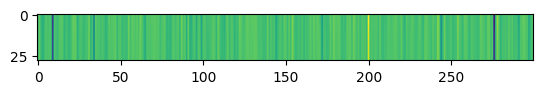

Train Epoch: 12 [1000/2360 (42%)]	 KLD Loss: 0.000142 	 NLL Loss: 8646.650391


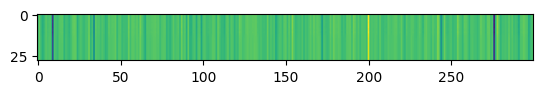

Train Epoch: 12 [1200/2360 (51%)]	 KLD Loss: 0.000197 	 NLL Loss: 8639.375977


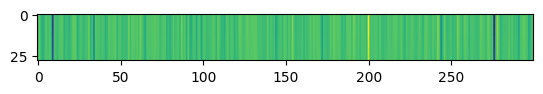

Train Epoch: 12 [1400/2360 (59%)]	 KLD Loss: 0.000240 	 NLL Loss: 8644.319336


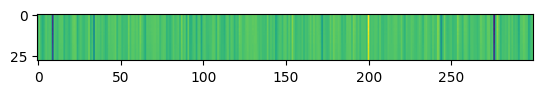

Train Epoch: 12 [1600/2360 (68%)]	 KLD Loss: 0.000484 	 NLL Loss: 8651.201172


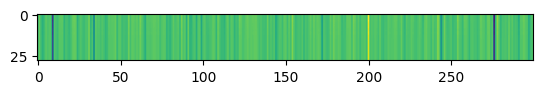

Train Epoch: 12 [1800/2360 (76%)]	 KLD Loss: 0.000169 	 NLL Loss: 8644.757812


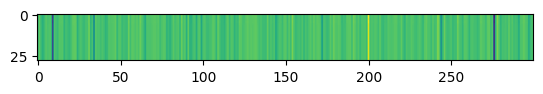

Train Epoch: 12 [2000/2360 (85%)]	 KLD Loss: 0.000205 	 NLL Loss: 8644.868164


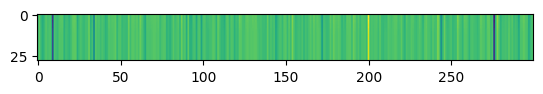

Train Epoch: 12 [2200/2360 (93%)]	 KLD Loss: 0.000151 	 NLL Loss: 8640.014648


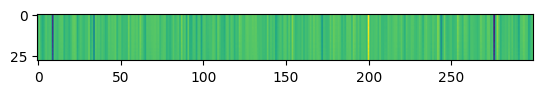

====> Epoch: 12 Average loss: 9243.5034
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.4922 
Train Epoch: 13 [0/2360 (0%)]	 KLD Loss: 0.000185 	 NLL Loss: 8645.110352


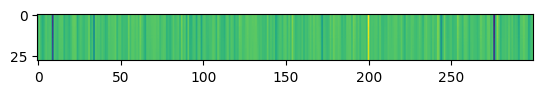

Train Epoch: 13 [200/2360 (8%)]	 KLD Loss: 0.000438 	 NLL Loss: 8646.500977


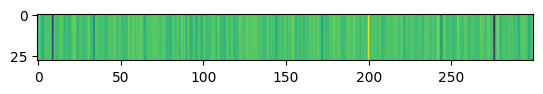

Train Epoch: 13 [400/2360 (17%)]	 KLD Loss: 0.000285 	 NLL Loss: 8646.294922


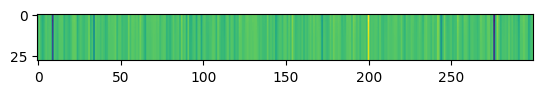

Train Epoch: 13 [600/2360 (25%)]	 KLD Loss: 0.000200 	 NLL Loss: 8596.335938


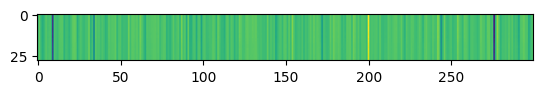

Train Epoch: 13 [800/2360 (34%)]	 KLD Loss: 0.000281 	 NLL Loss: 8643.510742


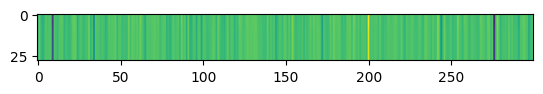

Train Epoch: 13 [1000/2360 (42%)]	 KLD Loss: 0.000182 	 NLL Loss: 8646.670898


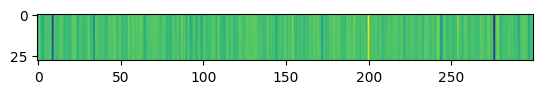

Train Epoch: 13 [1200/2360 (51%)]	 KLD Loss: 0.000196 	 NLL Loss: 8639.351562


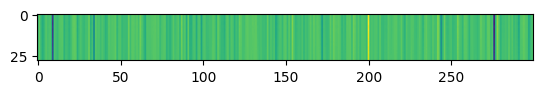

Train Epoch: 13 [1400/2360 (59%)]	 KLD Loss: 0.000382 	 NLL Loss: 8644.230469


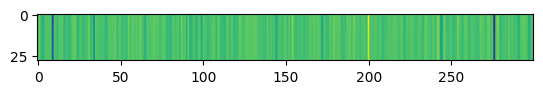

Train Epoch: 13 [1600/2360 (68%)]	 KLD Loss: 0.000214 	 NLL Loss: 8651.283203


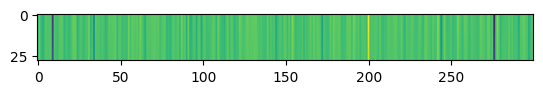

Train Epoch: 13 [1800/2360 (76%)]	 KLD Loss: 0.000181 	 NLL Loss: 8644.759766


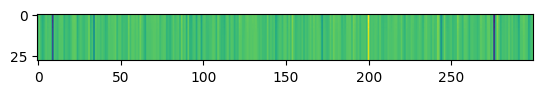

Train Epoch: 13 [2000/2360 (85%)]	 KLD Loss: 0.000364 	 NLL Loss: 8644.871094


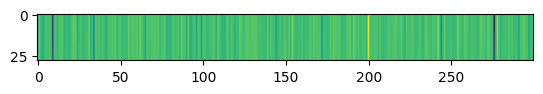

Train Epoch: 13 [2200/2360 (93%)]	 KLD Loss: 0.000196 	 NLL Loss: 8639.863281


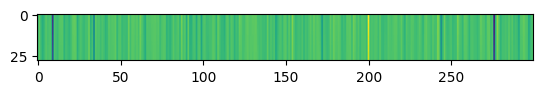

====> Epoch: 13 Average loss: 9243.4633
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.4685 
Train Epoch: 14 [0/2360 (0%)]	 KLD Loss: 0.000144 	 NLL Loss: 8645.090820


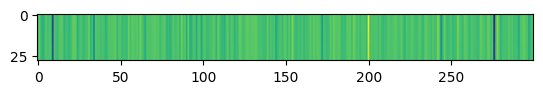

Train Epoch: 14 [200/2360 (8%)]	 KLD Loss: 0.000145 	 NLL Loss: 8646.564453


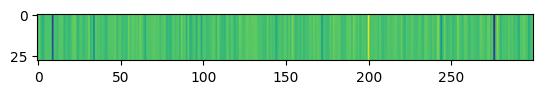

Train Epoch: 14 [400/2360 (17%)]	 KLD Loss: 0.000196 	 NLL Loss: 8646.383789


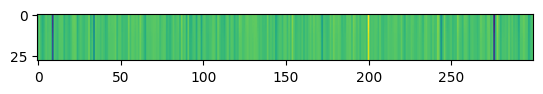

Train Epoch: 14 [600/2360 (25%)]	 KLD Loss: 0.000551 	 NLL Loss: 8596.291016


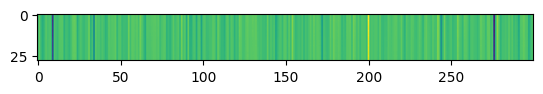

Train Epoch: 14 [800/2360 (34%)]	 KLD Loss: 0.000288 	 NLL Loss: 8643.556641


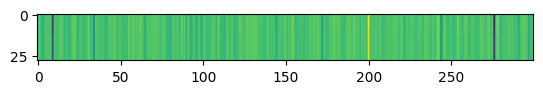

Train Epoch: 14 [1000/2360 (42%)]	 KLD Loss: 0.000176 	 NLL Loss: 8646.577148


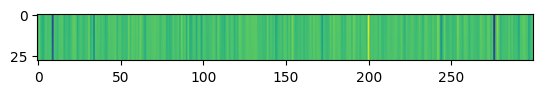

Train Epoch: 14 [1200/2360 (51%)]	 KLD Loss: 0.000235 	 NLL Loss: 8639.382812


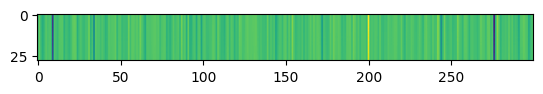

Train Epoch: 14 [1400/2360 (59%)]	 KLD Loss: 0.000162 	 NLL Loss: 8644.320312


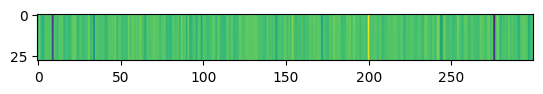

Train Epoch: 14 [1600/2360 (68%)]	 KLD Loss: 0.000157 	 NLL Loss: 8651.177734


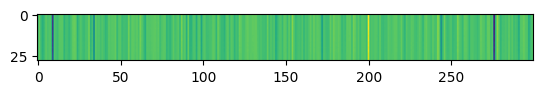

Train Epoch: 14 [1800/2360 (76%)]	 KLD Loss: 0.000452 	 NLL Loss: 8644.653320


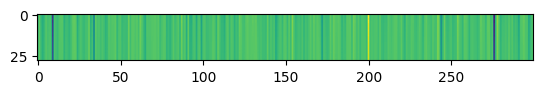

Train Epoch: 14 [2000/2360 (85%)]	 KLD Loss: 0.000876 	 NLL Loss: 8644.812500


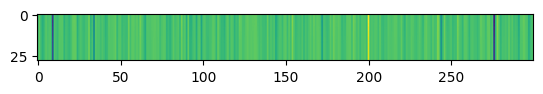

Train Epoch: 14 [2200/2360 (93%)]	 KLD Loss: 0.000217 	 NLL Loss: 8640.026367


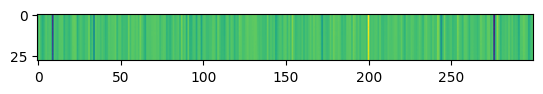

====> Epoch: 14 Average loss: 9243.4298
====> Test set loss: KLD Loss = 0.0004, NLL Loss = 8602.5023 
Train Epoch: 15 [0/2360 (0%)]	 KLD Loss: 0.000403 	 NLL Loss: 8645.168945


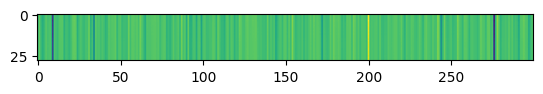

Train Epoch: 15 [200/2360 (8%)]	 KLD Loss: 0.000261 	 NLL Loss: 8646.630859


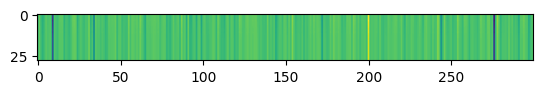

Train Epoch: 15 [400/2360 (17%)]	 KLD Loss: 0.000142 	 NLL Loss: 8646.641602


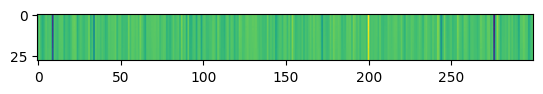

Train Epoch: 15 [600/2360 (25%)]	 KLD Loss: 0.000151 	 NLL Loss: 8596.193359


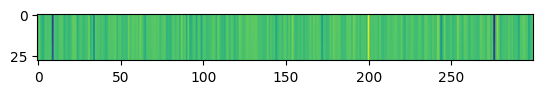

Train Epoch: 15 [800/2360 (34%)]	 KLD Loss: 0.000135 	 NLL Loss: 8643.472656


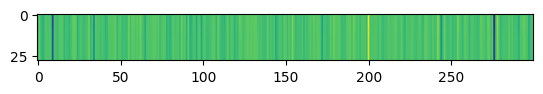

Train Epoch: 15 [1000/2360 (42%)]	 KLD Loss: 0.000185 	 NLL Loss: 8646.401367


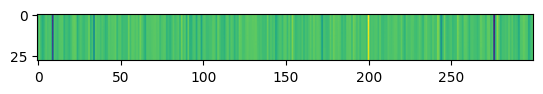

Train Epoch: 15 [1200/2360 (51%)]	 KLD Loss: 0.000221 	 NLL Loss: 8639.314453


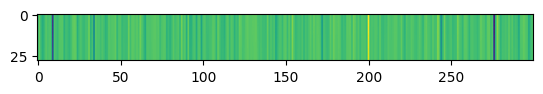

Train Epoch: 15 [1400/2360 (59%)]	 KLD Loss: 0.000159 	 NLL Loss: 8644.338867


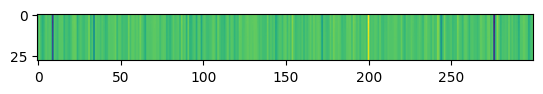

Train Epoch: 15 [1600/2360 (68%)]	 KLD Loss: 0.000170 	 NLL Loss: 8651.092773


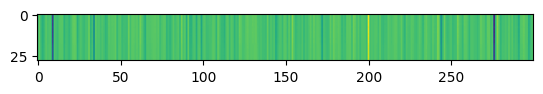

Train Epoch: 15 [1800/2360 (76%)]	 KLD Loss: 0.000370 	 NLL Loss: 8644.655273


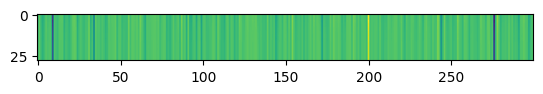

Train Epoch: 15 [2000/2360 (85%)]	 KLD Loss: 0.001071 	 NLL Loss: 8644.783203


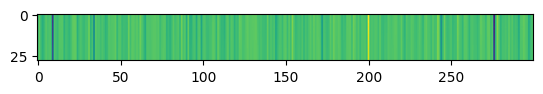

Train Epoch: 15 [2200/2360 (93%)]	 KLD Loss: 0.000422 	 NLL Loss: 8639.916016


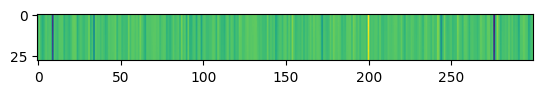

====> Epoch: 15 Average loss: 9243.4091
====> Test set loss: KLD Loss = 0.0006, NLL Loss = 8602.5278 
Train Epoch: 16 [0/2360 (0%)]	 KLD Loss: 0.000634 	 NLL Loss: 8645.165039


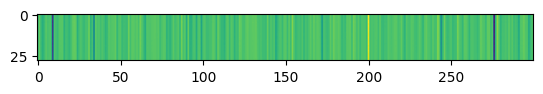

Train Epoch: 16 [200/2360 (8%)]	 KLD Loss: 0.000435 	 NLL Loss: 8646.787109


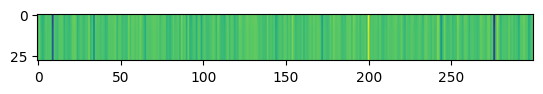

Train Epoch: 16 [400/2360 (17%)]	 KLD Loss: 0.000237 	 NLL Loss: 8646.681641


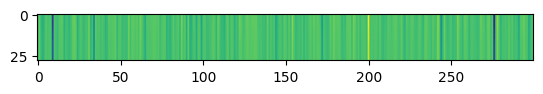

Train Epoch: 16 [600/2360 (25%)]	 KLD Loss: 0.000194 	 NLL Loss: 8596.291016


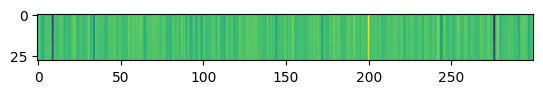

Train Epoch: 16 [800/2360 (34%)]	 KLD Loss: 0.000216 	 NLL Loss: 8643.454102


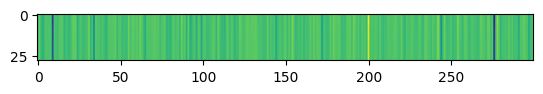

Train Epoch: 16 [1000/2360 (42%)]	 KLD Loss: 0.000144 	 NLL Loss: 8646.518555


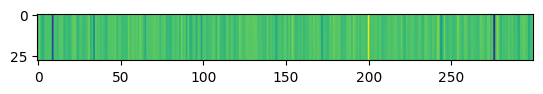

Train Epoch: 16 [1200/2360 (51%)]	 KLD Loss: 0.000407 	 NLL Loss: 8639.367188


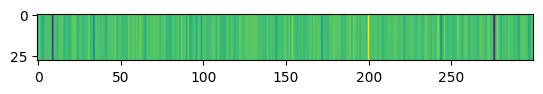

Train Epoch: 16 [1400/2360 (59%)]	 KLD Loss: 0.000141 	 NLL Loss: 8644.123047


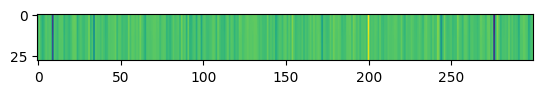

Train Epoch: 16 [1600/2360 (68%)]	 KLD Loss: 0.000346 	 NLL Loss: 8650.813477


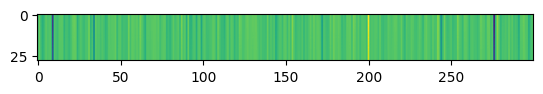

Train Epoch: 16 [1800/2360 (76%)]	 KLD Loss: 0.001515 	 NLL Loss: 8644.494141


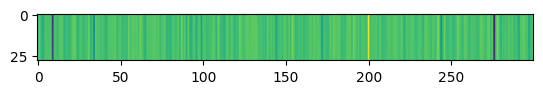

Train Epoch: 16 [2000/2360 (85%)]	 KLD Loss: 0.000693 	 NLL Loss: 8644.796875


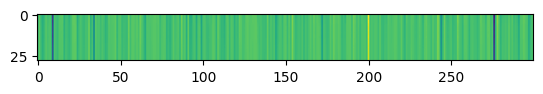

Train Epoch: 16 [2200/2360 (93%)]	 KLD Loss: 0.000793 	 NLL Loss: 8640.045898


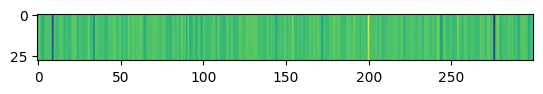

====> Epoch: 16 Average loss: 9243.3966
====> Test set loss: KLD Loss = 0.0012, NLL Loss = 8602.4588 
Train Epoch: 17 [0/2360 (0%)]	 KLD Loss: 0.001127 	 NLL Loss: 8645.429688


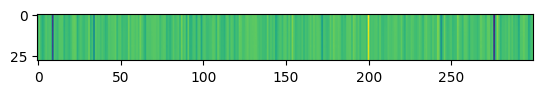

Train Epoch: 17 [200/2360 (8%)]	 KLD Loss: 0.001082 	 NLL Loss: 8646.702148


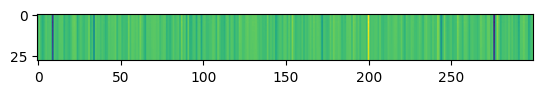

Train Epoch: 17 [400/2360 (17%)]	 KLD Loss: 0.000611 	 NLL Loss: 8646.367188


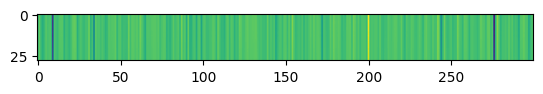

Train Epoch: 17 [600/2360 (25%)]	 KLD Loss: 0.000358 	 NLL Loss: 8596.173828


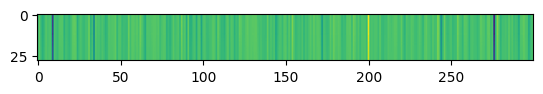

Train Epoch: 17 [800/2360 (34%)]	 KLD Loss: 0.000406 	 NLL Loss: 8643.259766


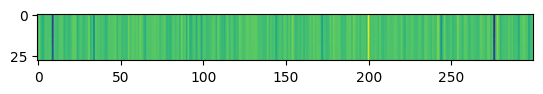

Train Epoch: 17 [1000/2360 (42%)]	 KLD Loss: 0.003854 	 NLL Loss: 8646.358398


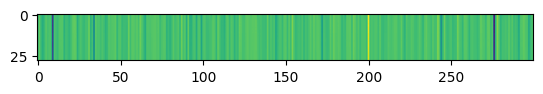

Train Epoch: 17 [1200/2360 (51%)]	 KLD Loss: 0.000747 	 NLL Loss: 8639.304688


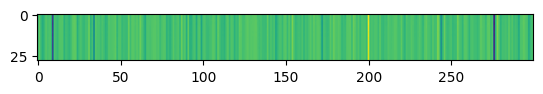

Train Epoch: 17 [1400/2360 (59%)]	 KLD Loss: 0.000383 	 NLL Loss: 8644.488281


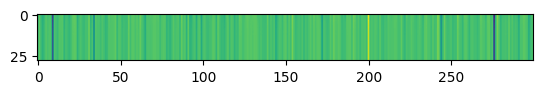

Train Epoch: 17 [1600/2360 (68%)]	 KLD Loss: 0.000350 	 NLL Loss: 8651.222656


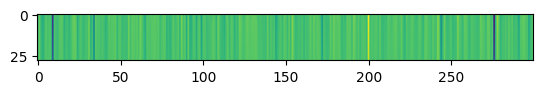

Train Epoch: 17 [1800/2360 (76%)]	 KLD Loss: 0.000403 	 NLL Loss: 8644.471680


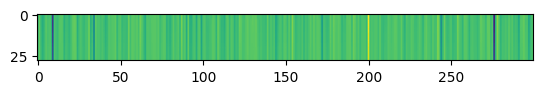

Train Epoch: 17 [2000/2360 (85%)]	 KLD Loss: 0.000648 	 NLL Loss: 8645.013672


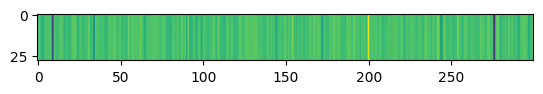

Train Epoch: 17 [2200/2360 (93%)]	 KLD Loss: 0.000289 	 NLL Loss: 8640.276367


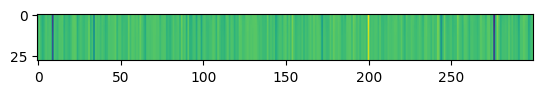

====> Epoch: 17 Average loss: 9243.3535
====> Test set loss: KLD Loss = 0.0003, NLL Loss = 8602.6724 
Train Epoch: 18 [0/2360 (0%)]	 KLD Loss: 0.000361 	 NLL Loss: 8645.037109


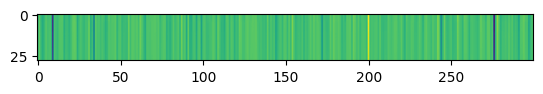

Train Epoch: 18 [200/2360 (8%)]	 KLD Loss: 0.000660 	 NLL Loss: 8646.788086


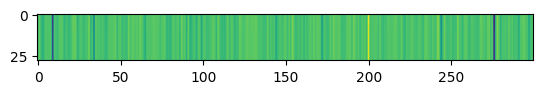

Train Epoch: 18 [400/2360 (17%)]	 KLD Loss: 0.000199 	 NLL Loss: 8646.697266


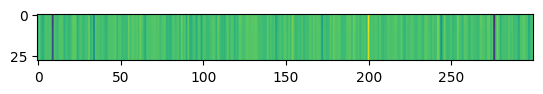

Train Epoch: 18 [600/2360 (25%)]	 KLD Loss: 0.000179 	 NLL Loss: 8596.286133


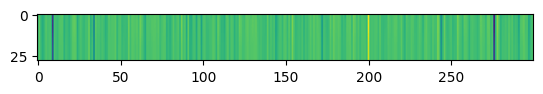

Train Epoch: 18 [800/2360 (34%)]	 KLD Loss: 0.000125 	 NLL Loss: 8643.405273


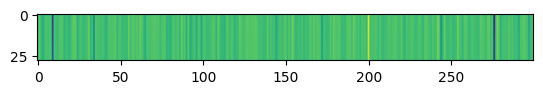

Train Epoch: 18 [1000/2360 (42%)]	 KLD Loss: 0.000144 	 NLL Loss: 8646.598633


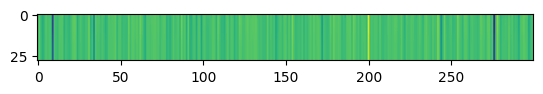

Train Epoch: 18 [1200/2360 (51%)]	 KLD Loss: 0.000192 	 NLL Loss: 8639.341797


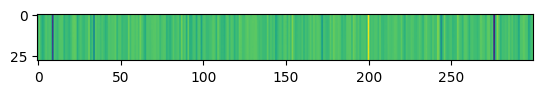

Train Epoch: 18 [1400/2360 (59%)]	 KLD Loss: 0.000125 	 NLL Loss: 8644.155273


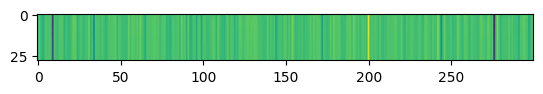

Train Epoch: 18 [1600/2360 (68%)]	 KLD Loss: 0.000130 	 NLL Loss: 8651.081055


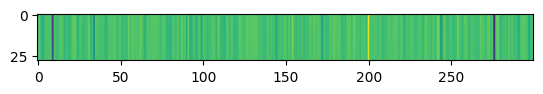

Train Epoch: 18 [1800/2360 (76%)]	 KLD Loss: 0.000203 	 NLL Loss: 8644.653320


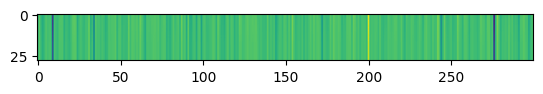

Train Epoch: 18 [2000/2360 (85%)]	 KLD Loss: 0.000995 	 NLL Loss: 8644.696289


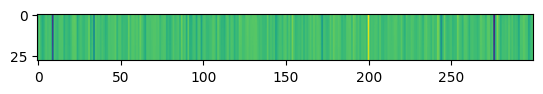

Train Epoch: 18 [2200/2360 (93%)]	 KLD Loss: 0.000262 	 NLL Loss: 8640.023438


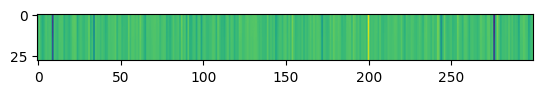

====> Epoch: 18 Average loss: 9243.4042
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.5765 
Train Epoch: 19 [0/2360 (0%)]	 KLD Loss: 0.000230 	 NLL Loss: 8645.116211


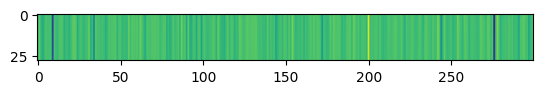

Train Epoch: 19 [200/2360 (8%)]	 KLD Loss: 0.000634 	 NLL Loss: 8646.576172


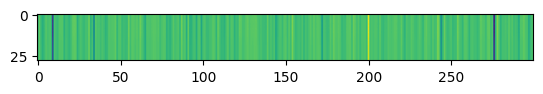

Train Epoch: 19 [400/2360 (17%)]	 KLD Loss: 0.000276 	 NLL Loss: 8646.572266


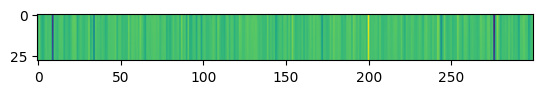

Train Epoch: 19 [600/2360 (25%)]	 KLD Loss: 0.000137 	 NLL Loss: 8596.060547


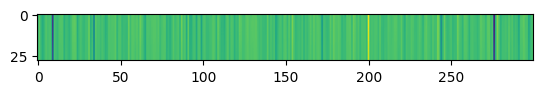

Train Epoch: 19 [800/2360 (34%)]	 KLD Loss: 0.000321 	 NLL Loss: 8643.338867


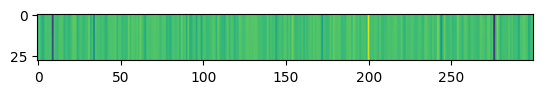

Train Epoch: 19 [1000/2360 (42%)]	 KLD Loss: 0.000264 	 NLL Loss: 8646.478516


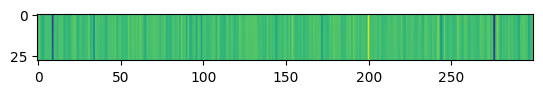

Train Epoch: 19 [1200/2360 (51%)]	 KLD Loss: 0.000428 	 NLL Loss: 8639.187500


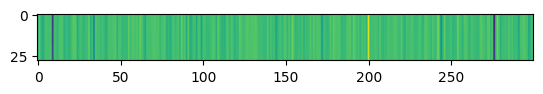

Train Epoch: 19 [1400/2360 (59%)]	 KLD Loss: 0.000140 	 NLL Loss: 8644.204102


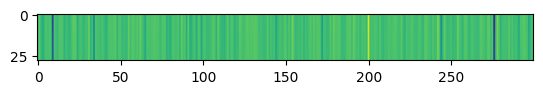

Train Epoch: 19 [1600/2360 (68%)]	 KLD Loss: 0.000165 	 NLL Loss: 8651.192383


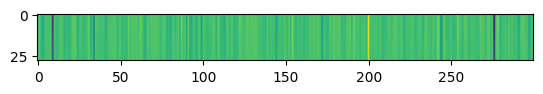

Train Epoch: 19 [1800/2360 (76%)]	 KLD Loss: 0.000229 	 NLL Loss: 8644.620117


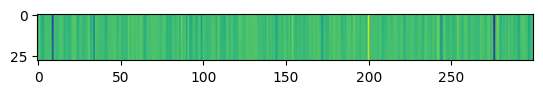

Train Epoch: 19 [2000/2360 (85%)]	 KLD Loss: 0.000713 	 NLL Loss: 8644.690430


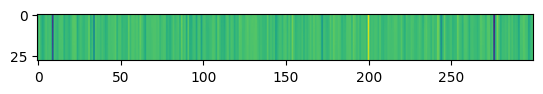

Train Epoch: 19 [2200/2360 (93%)]	 KLD Loss: 0.000747 	 NLL Loss: 8639.830078


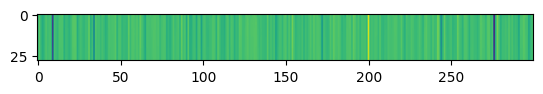

====> Epoch: 19 Average loss: 9243.3351
====> Test set loss: KLD Loss = 0.0006, NLL Loss = 8602.3392 
Train Epoch: 20 [0/2360 (0%)]	 KLD Loss: 0.000553 	 NLL Loss: 8644.965820


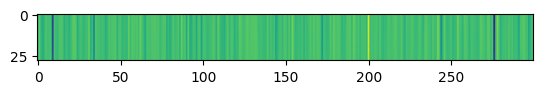

Train Epoch: 20 [200/2360 (8%)]	 KLD Loss: 0.000268 	 NLL Loss: 8646.637695


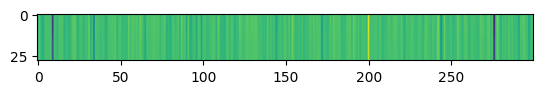

Train Epoch: 20 [400/2360 (17%)]	 KLD Loss: 0.000143 	 NLL Loss: 8646.418945


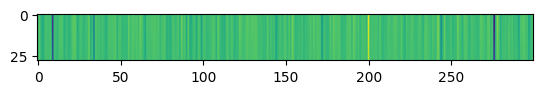

Train Epoch: 20 [600/2360 (25%)]	 KLD Loss: 0.000269 	 NLL Loss: 8596.112305


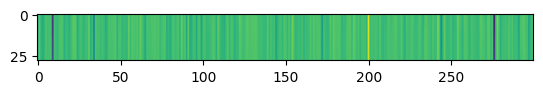

Train Epoch: 20 [800/2360 (34%)]	 KLD Loss: 0.000098 	 NLL Loss: 8643.364258


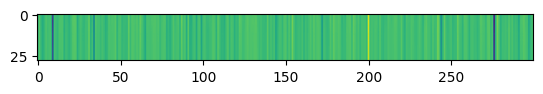

Train Epoch: 20 [1000/2360 (42%)]	 KLD Loss: 0.000307 	 NLL Loss: 8646.451172


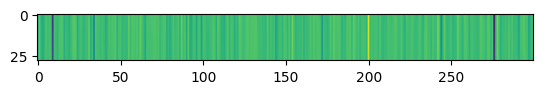

Train Epoch: 20 [1200/2360 (51%)]	 KLD Loss: 0.000728 	 NLL Loss: 8639.230469


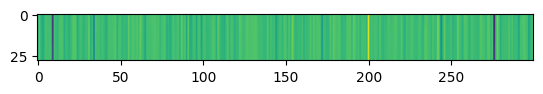

Train Epoch: 20 [1400/2360 (59%)]	 KLD Loss: 0.000229 	 NLL Loss: 8644.232422


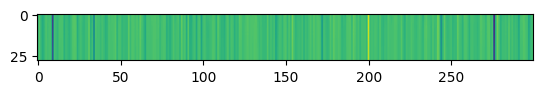

Train Epoch: 20 [1600/2360 (68%)]	 KLD Loss: 0.000291 	 NLL Loss: 8651.130859


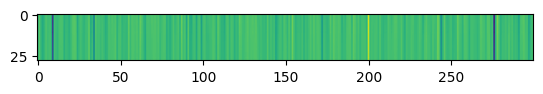

Train Epoch: 20 [1800/2360 (76%)]	 KLD Loss: 0.000232 	 NLL Loss: 8644.366211


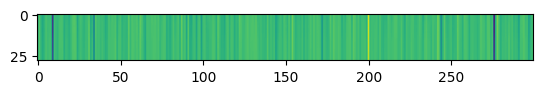

Train Epoch: 20 [2000/2360 (85%)]	 KLD Loss: 0.000761 	 NLL Loss: 8644.875000


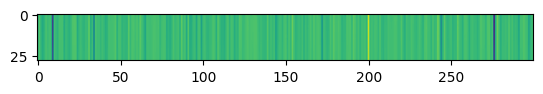

Train Epoch: 20 [2200/2360 (93%)]	 KLD Loss: 0.000384 	 NLL Loss: 8639.965820


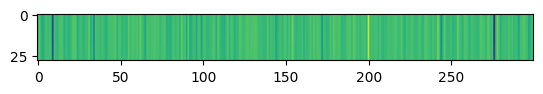

====> Epoch: 20 Average loss: 9243.2821
====> Test set loss: KLD Loss = 0.0005, NLL Loss = 8602.4089 
Train Epoch: 21 [0/2360 (0%)]	 KLD Loss: 0.000457 	 NLL Loss: 8644.901367


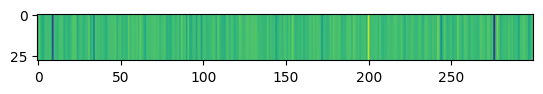

Train Epoch: 21 [200/2360 (8%)]	 KLD Loss: 0.000683 	 NLL Loss: 8646.701172


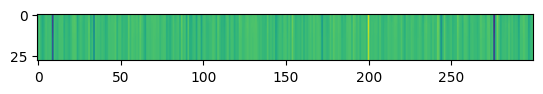

Train Epoch: 21 [400/2360 (17%)]	 KLD Loss: 0.000264 	 NLL Loss: 8646.554688


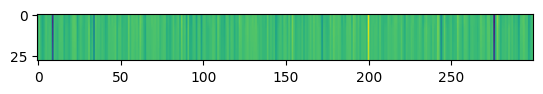

Train Epoch: 21 [600/2360 (25%)]	 KLD Loss: 0.000204 	 NLL Loss: 8596.002930


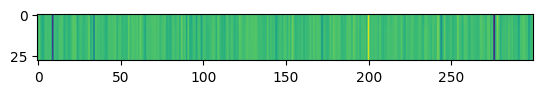

Train Epoch: 21 [800/2360 (34%)]	 KLD Loss: 0.000097 	 NLL Loss: 8643.419922


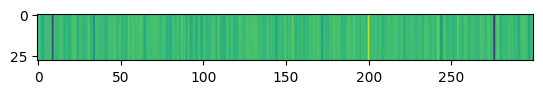

Train Epoch: 21 [1000/2360 (42%)]	 KLD Loss: 0.000110 	 NLL Loss: 8646.487305


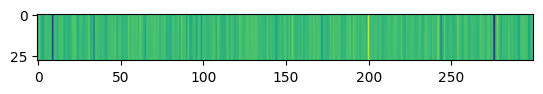

Train Epoch: 21 [1200/2360 (51%)]	 KLD Loss: 0.000158 	 NLL Loss: 8639.278320


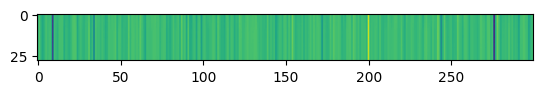

Train Epoch: 21 [1400/2360 (59%)]	 KLD Loss: 0.000136 	 NLL Loss: 8644.250977


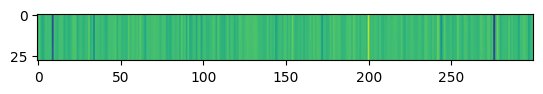

Train Epoch: 21 [1600/2360 (68%)]	 KLD Loss: 0.000301 	 NLL Loss: 8651.186523


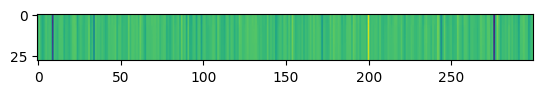

Train Epoch: 21 [1800/2360 (76%)]	 KLD Loss: 0.000198 	 NLL Loss: 8644.392578


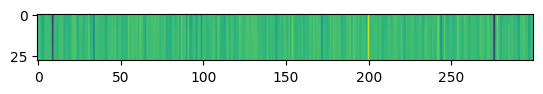

Train Epoch: 21 [2000/2360 (85%)]	 KLD Loss: 0.000664 	 NLL Loss: 8644.736328


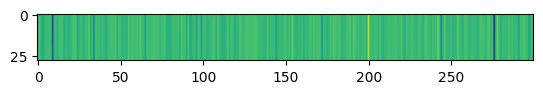

Train Epoch: 21 [2200/2360 (93%)]	 KLD Loss: 0.000519 	 NLL Loss: 8639.896484


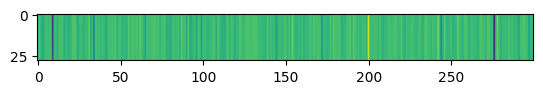

====> Epoch: 21 Average loss: 9243.2899
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.4579 
Train Epoch: 22 [0/2360 (0%)]	 KLD Loss: 0.000209 	 NLL Loss: 8644.870117


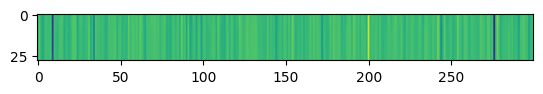

Train Epoch: 22 [200/2360 (8%)]	 KLD Loss: 0.000643 	 NLL Loss: 8646.836914


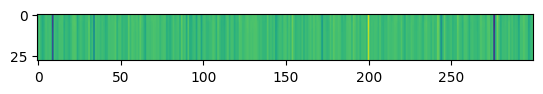

Train Epoch: 22 [400/2360 (17%)]	 KLD Loss: 0.000384 	 NLL Loss: 8646.486328


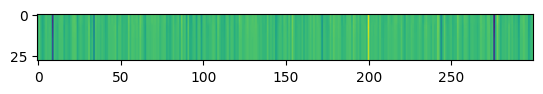

Train Epoch: 22 [600/2360 (25%)]	 KLD Loss: 0.000141 	 NLL Loss: 8596.114258


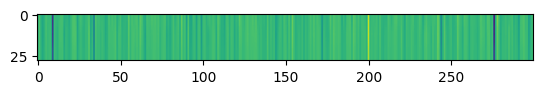

Train Epoch: 22 [800/2360 (34%)]	 KLD Loss: 0.000120 	 NLL Loss: 8643.380859


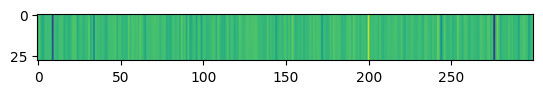

Train Epoch: 22 [1000/2360 (42%)]	 KLD Loss: 0.000060 	 NLL Loss: 8646.608398


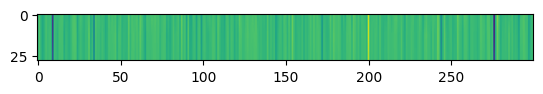

Train Epoch: 22 [1200/2360 (51%)]	 KLD Loss: 0.000189 	 NLL Loss: 8639.255859


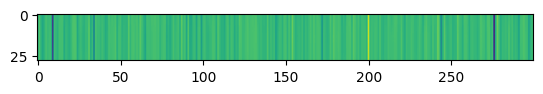

Train Epoch: 22 [1400/2360 (59%)]	 KLD Loss: 0.000105 	 NLL Loss: 8644.053711


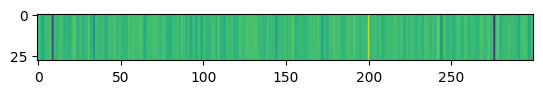

Train Epoch: 22 [1600/2360 (68%)]	 KLD Loss: 0.000131 	 NLL Loss: 8650.974609


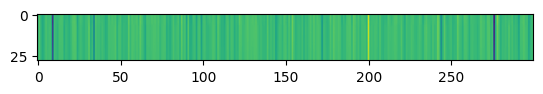

Train Epoch: 22 [1800/2360 (76%)]	 KLD Loss: 0.000170 	 NLL Loss: 8644.457031


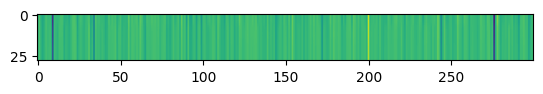

Train Epoch: 22 [2000/2360 (85%)]	 KLD Loss: 0.001690 	 NLL Loss: 8644.592773


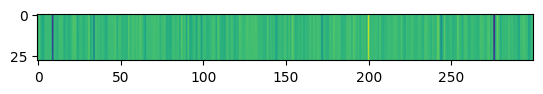

Train Epoch: 22 [2200/2360 (93%)]	 KLD Loss: 0.000771 	 NLL Loss: 8639.824219


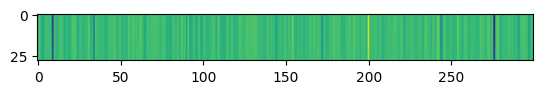

====> Epoch: 22 Average loss: 9243.2936
====> Test set loss: KLD Loss = 0.0009, NLL Loss = 8602.2797 
Train Epoch: 23 [0/2360 (0%)]	 KLD Loss: 0.000909 	 NLL Loss: 8644.756836


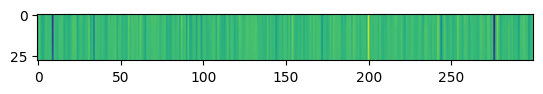

Train Epoch: 23 [200/2360 (8%)]	 KLD Loss: 0.000551 	 NLL Loss: 8646.365234


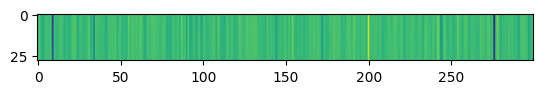

Train Epoch: 23 [400/2360 (17%)]	 KLD Loss: 0.000177 	 NLL Loss: 8646.170898


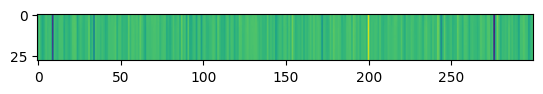

Train Epoch: 23 [600/2360 (25%)]	 KLD Loss: 0.000481 	 NLL Loss: 8595.974609


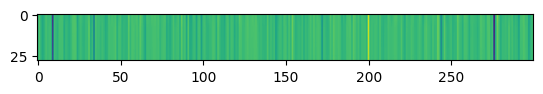

Train Epoch: 23 [800/2360 (34%)]	 KLD Loss: 0.000119 	 NLL Loss: 8643.459961


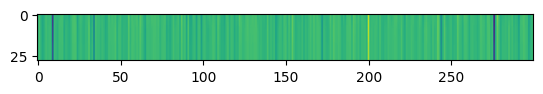

Train Epoch: 23 [1000/2360 (42%)]	 KLD Loss: 0.000207 	 NLL Loss: 8646.431641


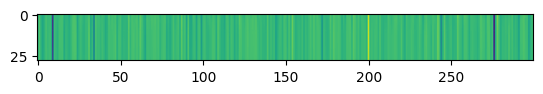

Train Epoch: 23 [1200/2360 (51%)]	 KLD Loss: 0.000610 	 NLL Loss: 8639.297852


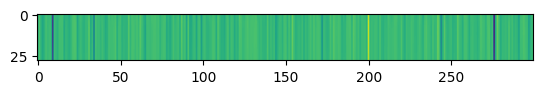

Train Epoch: 23 [1400/2360 (59%)]	 KLD Loss: 0.000163 	 NLL Loss: 8644.452148


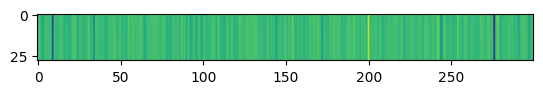

Train Epoch: 23 [1600/2360 (68%)]	 KLD Loss: 0.000158 	 NLL Loss: 8651.006836


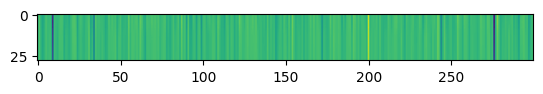

Train Epoch: 23 [1800/2360 (76%)]	 KLD Loss: 0.000309 	 NLL Loss: 8644.302734


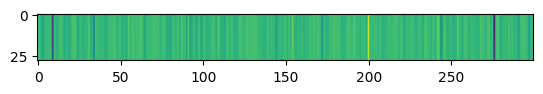

Train Epoch: 23 [2000/2360 (85%)]	 KLD Loss: 0.001324 	 NLL Loss: 8644.952148


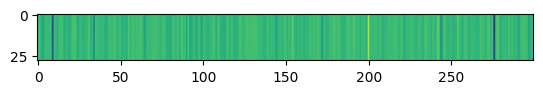

Train Epoch: 23 [2200/2360 (93%)]	 KLD Loss: 0.000640 	 NLL Loss: 8640.041016


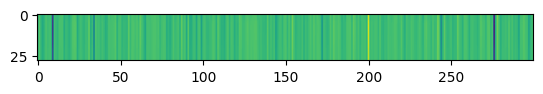

====> Epoch: 23 Average loss: 9243.2270
====> Test set loss: KLD Loss = 0.0004, NLL Loss = 8602.7192 
Train Epoch: 24 [0/2360 (0%)]	 KLD Loss: 0.000367 	 NLL Loss: 8644.939453


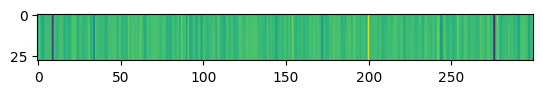

Train Epoch: 24 [200/2360 (8%)]	 KLD Loss: 0.000911 	 NLL Loss: 8647.016602


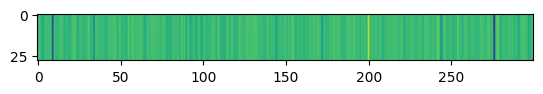

Train Epoch: 24 [400/2360 (17%)]	 KLD Loss: 0.000443 	 NLL Loss: 8646.642578


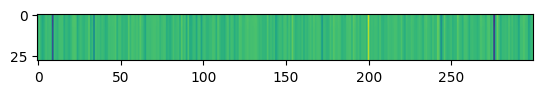

Train Epoch: 24 [600/2360 (25%)]	 KLD Loss: 0.000211 	 NLL Loss: 8596.313477


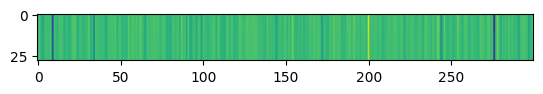

Train Epoch: 24 [800/2360 (34%)]	 KLD Loss: 0.000207 	 NLL Loss: 8643.398438


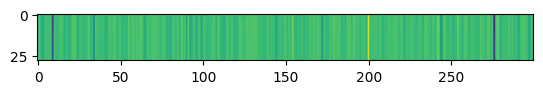

Train Epoch: 24 [1000/2360 (42%)]	 KLD Loss: 0.000220 	 NLL Loss: 8646.654297


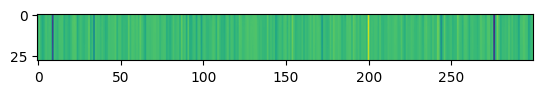

Train Epoch: 24 [1200/2360 (51%)]	 KLD Loss: 0.000235 	 NLL Loss: 8639.280273


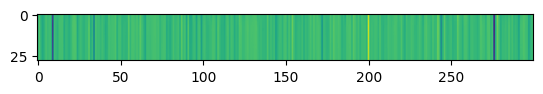

Train Epoch: 24 [1400/2360 (59%)]	 KLD Loss: 0.000164 	 NLL Loss: 8644.159180


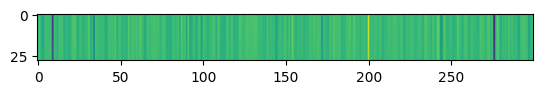

Train Epoch: 24 [1600/2360 (68%)]	 KLD Loss: 0.000668 	 NLL Loss: 8650.927734


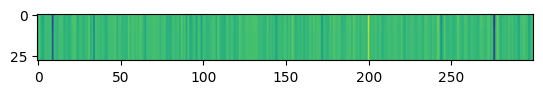

Train Epoch: 24 [1800/2360 (76%)]	 KLD Loss: 0.000234 	 NLL Loss: 8644.816406


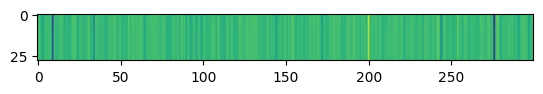

Train Epoch: 24 [2000/2360 (85%)]	 KLD Loss: 0.000165 	 NLL Loss: 8644.694336


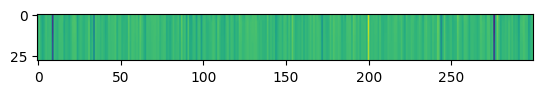

Train Epoch: 24 [2200/2360 (93%)]	 KLD Loss: 0.000107 	 NLL Loss: 8639.782227


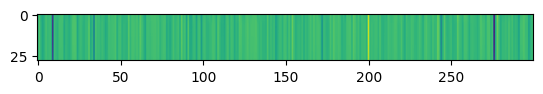

====> Epoch: 24 Average loss: 9243.3912
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.3215 
Train Epoch: 25 [0/2360 (0%)]	 KLD Loss: 0.000198 	 NLL Loss: 8644.852539


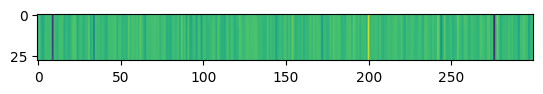

Train Epoch: 25 [200/2360 (8%)]	 KLD Loss: 0.000166 	 NLL Loss: 8646.494141


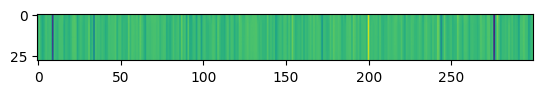

Train Epoch: 25 [400/2360 (17%)]	 KLD Loss: 0.000138 	 NLL Loss: 8646.145508


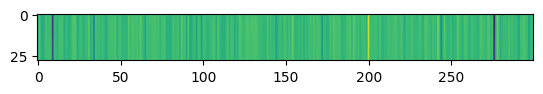

Train Epoch: 25 [600/2360 (25%)]	 KLD Loss: 0.001061 	 NLL Loss: 8596.060547


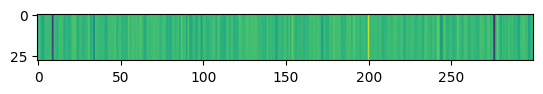

Train Epoch: 25 [800/2360 (34%)]	 KLD Loss: 0.000108 	 NLL Loss: 8643.467773


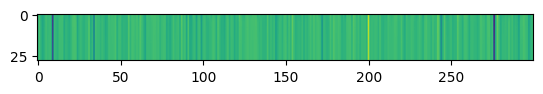

Train Epoch: 25 [1000/2360 (42%)]	 KLD Loss: 0.000163 	 NLL Loss: 8646.615234


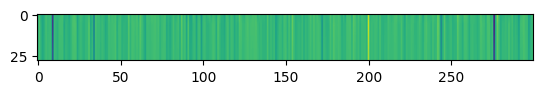

Train Epoch: 25 [1200/2360 (51%)]	 KLD Loss: 0.000435 	 NLL Loss: 8639.303711


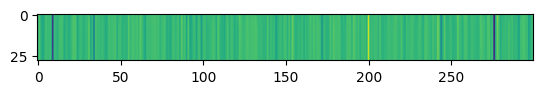

Train Epoch: 25 [1400/2360 (59%)]	 KLD Loss: 0.000111 	 NLL Loss: 8644.267578


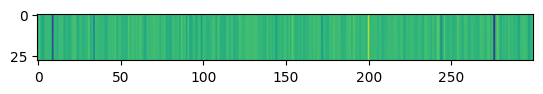

Train Epoch: 25 [1600/2360 (68%)]	 KLD Loss: 0.000144 	 NLL Loss: 8651.187500


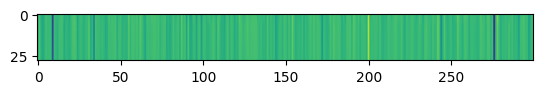

Train Epoch: 25 [1800/2360 (76%)]	 KLD Loss: 0.000231 	 NLL Loss: 8644.516602


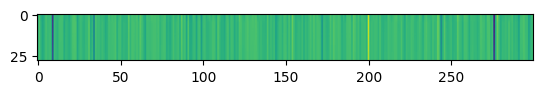

Train Epoch: 25 [2000/2360 (85%)]	 KLD Loss: 0.001171 	 NLL Loss: 8644.567383


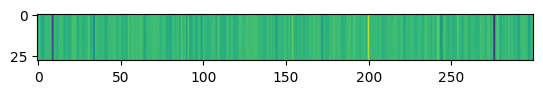

Train Epoch: 25 [2200/2360 (93%)]	 KLD Loss: 0.000569 	 NLL Loss: 8639.822266


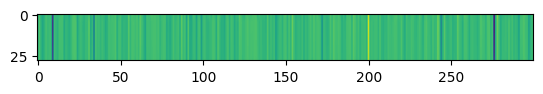

====> Epoch: 25 Average loss: 9243.2771
====> Test set loss: KLD Loss = 0.0007, NLL Loss = 8602.3697 
Train Epoch: 26 [0/2360 (0%)]	 KLD Loss: 0.000687 	 NLL Loss: 8644.877930


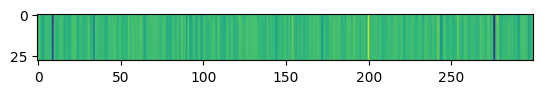

Train Epoch: 26 [200/2360 (8%)]	 KLD Loss: 0.000250 	 NLL Loss: 8646.581055


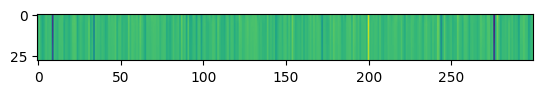

Train Epoch: 26 [400/2360 (17%)]	 KLD Loss: 0.000211 	 NLL Loss: 8646.432617


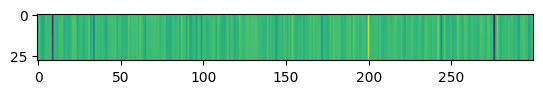

Train Epoch: 26 [600/2360 (25%)]	 KLD Loss: 0.000329 	 NLL Loss: 8595.957031


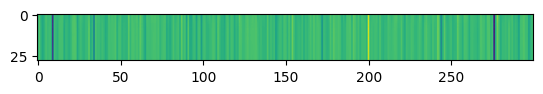

Train Epoch: 26 [800/2360 (34%)]	 KLD Loss: 0.000302 	 NLL Loss: 8643.330078


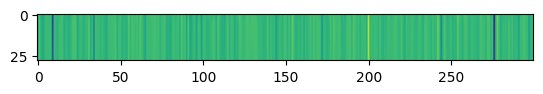

Train Epoch: 26 [1000/2360 (42%)]	 KLD Loss: 0.000232 	 NLL Loss: 8646.294922


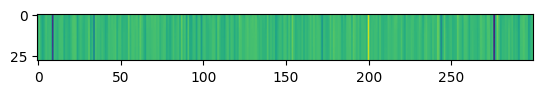

Train Epoch: 26 [1200/2360 (51%)]	 KLD Loss: 0.001078 	 NLL Loss: 8639.134766


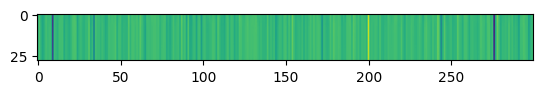

Train Epoch: 26 [1400/2360 (59%)]	 KLD Loss: 0.000155 	 NLL Loss: 8644.370117


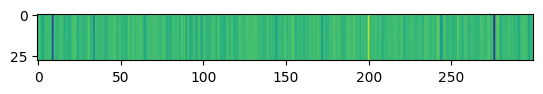

Train Epoch: 26 [1600/2360 (68%)]	 KLD Loss: 0.000361 	 NLL Loss: 8651.262695


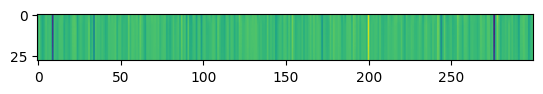

Train Epoch: 26 [1800/2360 (76%)]	 KLD Loss: 0.000218 	 NLL Loss: 8644.365234


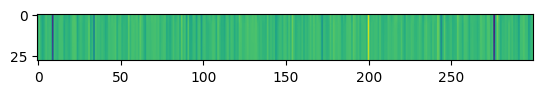

Train Epoch: 26 [2000/2360 (85%)]	 KLD Loss: 0.000609 	 NLL Loss: 8644.659180


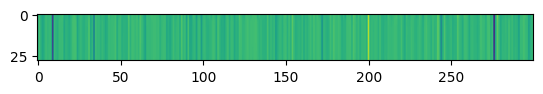

Train Epoch: 26 [2200/2360 (93%)]	 KLD Loss: 0.000658 	 NLL Loss: 8639.841797


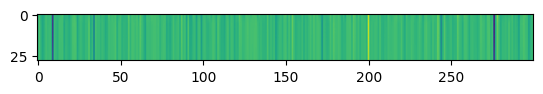

====> Epoch: 26 Average loss: 9243.2524
====> Test set loss: KLD Loss = 0.0004, NLL Loss = 8602.3764 
Train Epoch: 27 [0/2360 (0%)]	 KLD Loss: 0.000427 	 NLL Loss: 8644.833008


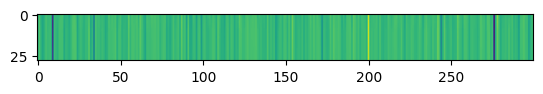

Train Epoch: 27 [200/2360 (8%)]	 KLD Loss: 0.000513 	 NLL Loss: 8646.826172


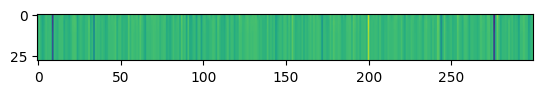

Train Epoch: 27 [400/2360 (17%)]	 KLD Loss: 0.000137 	 NLL Loss: 8646.481445


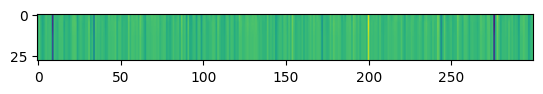

Train Epoch: 27 [600/2360 (25%)]	 KLD Loss: 0.000244 	 NLL Loss: 8596.032227


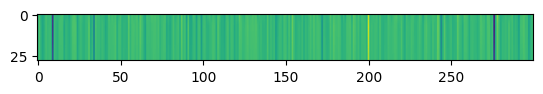

Train Epoch: 27 [800/2360 (34%)]	 KLD Loss: 0.000347 	 NLL Loss: 8643.353516


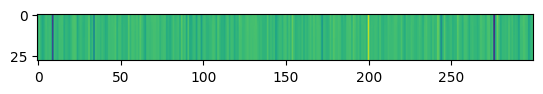

Train Epoch: 27 [1000/2360 (42%)]	 KLD Loss: 0.000088 	 NLL Loss: 8646.519531


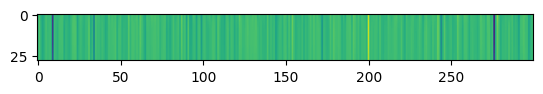

Train Epoch: 27 [1200/2360 (51%)]	 KLD Loss: 0.000230 	 NLL Loss: 8639.271484


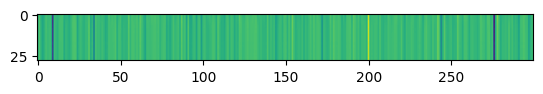

Train Epoch: 27 [1400/2360 (59%)]	 KLD Loss: 0.000161 	 NLL Loss: 8644.497070


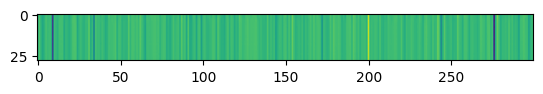

Train Epoch: 27 [1600/2360 (68%)]	 KLD Loss: 0.000162 	 NLL Loss: 8650.939453


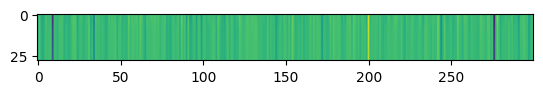

Train Epoch: 27 [1800/2360 (76%)]	 KLD Loss: 0.000145 	 NLL Loss: 8644.388672


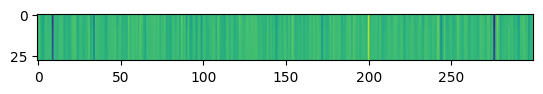

Train Epoch: 27 [2000/2360 (85%)]	 KLD Loss: 0.001207 	 NLL Loss: 8644.693359


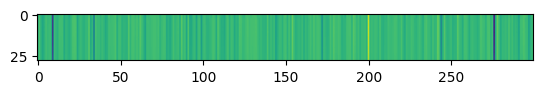

Train Epoch: 27 [2200/2360 (93%)]	 KLD Loss: 0.000332 	 NLL Loss: 8639.818359


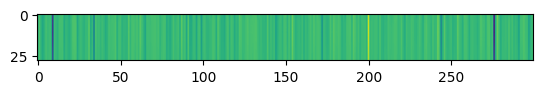

====> Epoch: 27 Average loss: 9243.2793
====> Test set loss: KLD Loss = 0.0005, NLL Loss = 8602.3995 
Train Epoch: 28 [0/2360 (0%)]	 KLD Loss: 0.000456 	 NLL Loss: 8644.854492


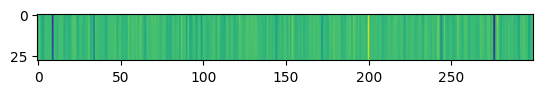

Train Epoch: 28 [200/2360 (8%)]	 KLD Loss: 0.000345 	 NLL Loss: 8646.540039


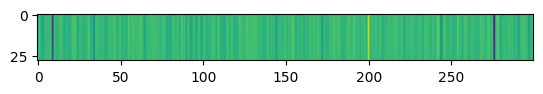

Train Epoch: 28 [400/2360 (17%)]	 KLD Loss: 0.000312 	 NLL Loss: 8646.392578


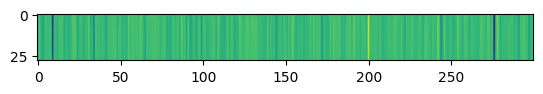

Train Epoch: 28 [600/2360 (25%)]	 KLD Loss: 0.001106 	 NLL Loss: 8596.053711


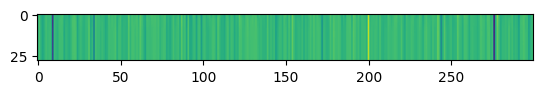

Train Epoch: 28 [800/2360 (34%)]	 KLD Loss: 0.000399 	 NLL Loss: 8643.310547


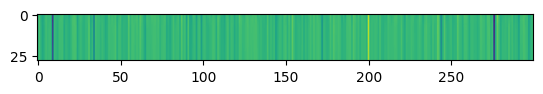

Train Epoch: 28 [1000/2360 (42%)]	 KLD Loss: 0.000370 	 NLL Loss: 8646.370117


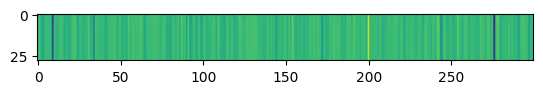

Train Epoch: 28 [1200/2360 (51%)]	 KLD Loss: 0.001082 	 NLL Loss: 8639.057617


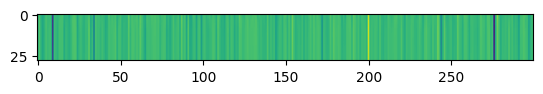

Train Epoch: 28 [1400/2360 (59%)]	 KLD Loss: 0.000140 	 NLL Loss: 8644.400391


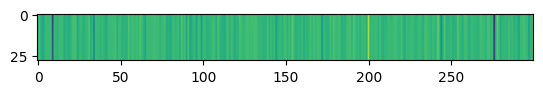

Train Epoch: 28 [1600/2360 (68%)]	 KLD Loss: 0.000359 	 NLL Loss: 8651.087891


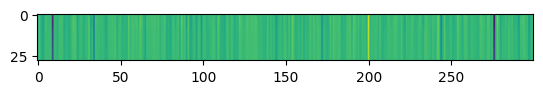

Train Epoch: 28 [1800/2360 (76%)]	 KLD Loss: 0.000279 	 NLL Loss: 8644.429688


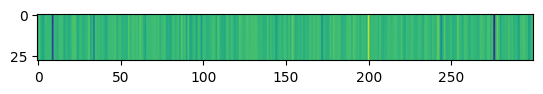

Train Epoch: 28 [2000/2360 (85%)]	 KLD Loss: 0.001322 	 NLL Loss: 8644.646484


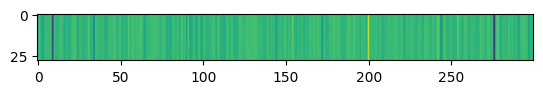

Train Epoch: 28 [2200/2360 (93%)]	 KLD Loss: 0.000869 	 NLL Loss: 8639.942383


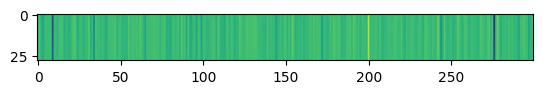

====> Epoch: 28 Average loss: 9243.2488
====> Test set loss: KLD Loss = 0.0004, NLL Loss = 8602.5174 
Train Epoch: 29 [0/2360 (0%)]	 KLD Loss: 0.000386 	 NLL Loss: 8644.994141


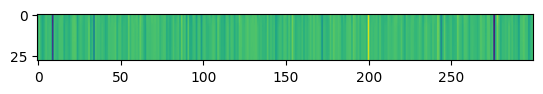

Train Epoch: 29 [200/2360 (8%)]	 KLD Loss: 0.001214 	 NLL Loss: 8646.809570


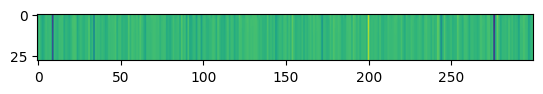

Train Epoch: 29 [400/2360 (17%)]	 KLD Loss: 0.000568 	 NLL Loss: 8646.537109


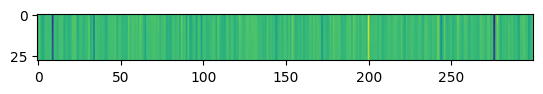

Train Epoch: 29 [600/2360 (25%)]	 KLD Loss: 0.000269 	 NLL Loss: 8596.025391


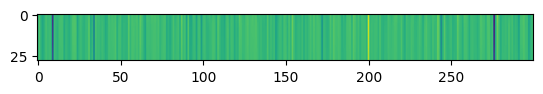

Train Epoch: 29 [800/2360 (34%)]	 KLD Loss: 0.000093 	 NLL Loss: 8643.333008


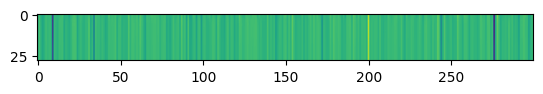

Train Epoch: 29 [1000/2360 (42%)]	 KLD Loss: 0.000065 	 NLL Loss: 8646.533203


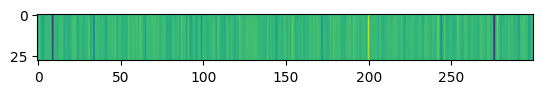

Train Epoch: 29 [1200/2360 (51%)]	 KLD Loss: 0.000274 	 NLL Loss: 8639.240234


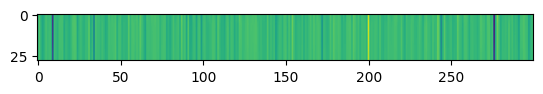

Train Epoch: 29 [1400/2360 (59%)]	 KLD Loss: 0.000182 	 NLL Loss: 8644.075195


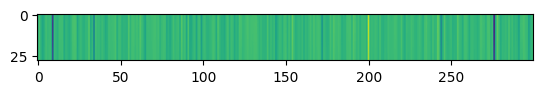

Train Epoch: 29 [1600/2360 (68%)]	 KLD Loss: 0.000074 	 NLL Loss: 8651.118164


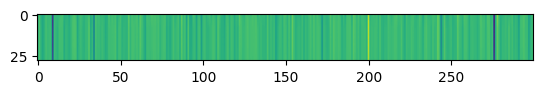

Train Epoch: 29 [1800/2360 (76%)]	 KLD Loss: 0.000133 	 NLL Loss: 8644.439453


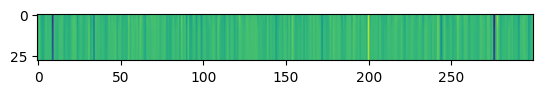

Train Epoch: 29 [2000/2360 (85%)]	 KLD Loss: 0.002282 	 NLL Loss: 8644.594727


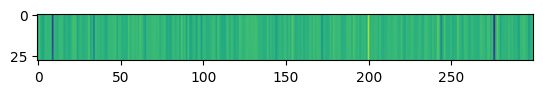

Train Epoch: 29 [2200/2360 (93%)]	 KLD Loss: 0.000784 	 NLL Loss: 8639.820312


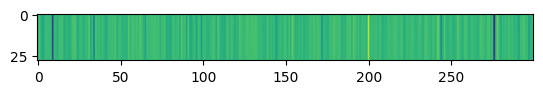

====> Epoch: 29 Average loss: 9243.2839
====> Test set loss: KLD Loss = 0.0007, NLL Loss = 8602.3259 
Train Epoch: 30 [0/2360 (0%)]	 KLD Loss: 0.000674 	 NLL Loss: 8644.809570


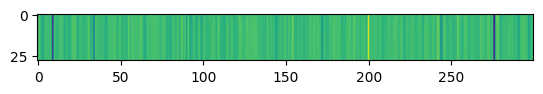

Train Epoch: 30 [200/2360 (8%)]	 KLD Loss: 0.000575 	 NLL Loss: 8646.610352


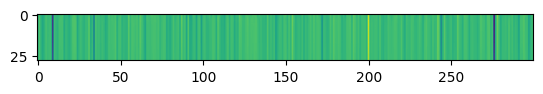

Train Epoch: 30 [400/2360 (17%)]	 KLD Loss: 0.000178 	 NLL Loss: 8646.411133


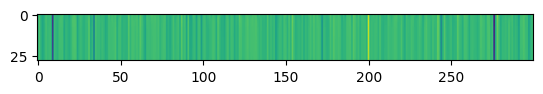

Train Epoch: 30 [600/2360 (25%)]	 KLD Loss: 0.000482 	 NLL Loss: 8595.987305


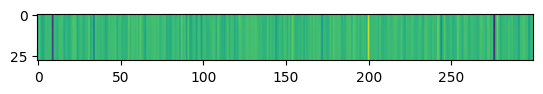

Train Epoch: 30 [800/2360 (34%)]	 KLD Loss: 0.000093 	 NLL Loss: 8643.321289


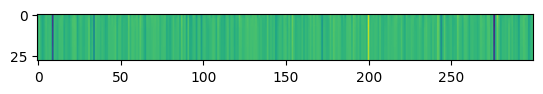

Train Epoch: 30 [1000/2360 (42%)]	 KLD Loss: 0.000144 	 NLL Loss: 8646.328125


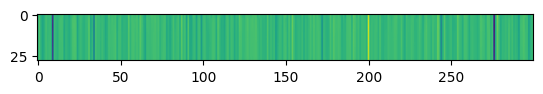

Train Epoch: 30 [1200/2360 (51%)]	 KLD Loss: 0.000441 	 NLL Loss: 8639.100586


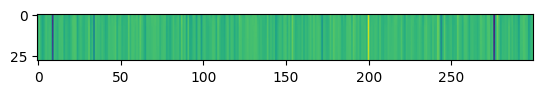

Train Epoch: 30 [1400/2360 (59%)]	 KLD Loss: 0.000072 	 NLL Loss: 8644.298828


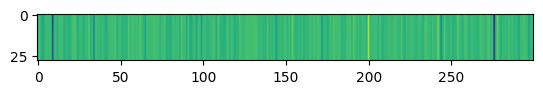

Train Epoch: 30 [1600/2360 (68%)]	 KLD Loss: 0.000115 	 NLL Loss: 8651.267578


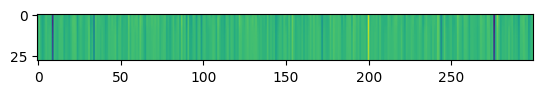

Train Epoch: 30 [1800/2360 (76%)]	 KLD Loss: 0.000090 	 NLL Loss: 8644.339844


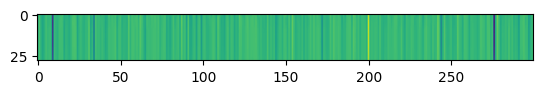

Train Epoch: 30 [2000/2360 (85%)]	 KLD Loss: 0.000836 	 NLL Loss: 8644.638672


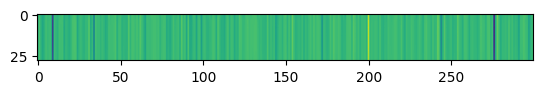

Train Epoch: 30 [2200/2360 (93%)]	 KLD Loss: 0.003645 	 NLL Loss: 8639.863281


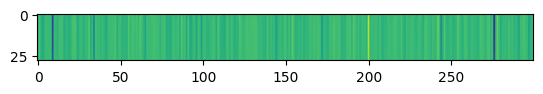

====> Epoch: 30 Average loss: 9243.2299
====> Test set loss: KLD Loss = 0.0025, NLL Loss = 8602.3155 
Train Epoch: 31 [0/2360 (0%)]	 KLD Loss: 0.002449 	 NLL Loss: 8644.962891


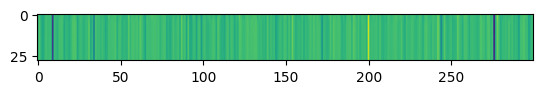

Train Epoch: 31 [200/2360 (8%)]	 KLD Loss: 0.001597 	 NLL Loss: 8646.740234


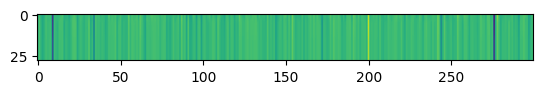

Train Epoch: 31 [400/2360 (17%)]	 KLD Loss: 0.000532 	 NLL Loss: 8646.434570


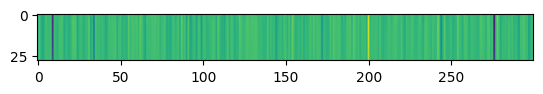

Train Epoch: 31 [600/2360 (25%)]	 KLD Loss: 0.000160 	 NLL Loss: 8596.033203


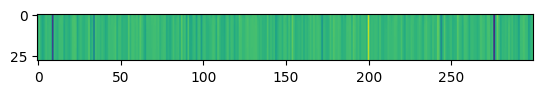

Train Epoch: 31 [800/2360 (34%)]	 KLD Loss: 0.000238 	 NLL Loss: 8643.292969


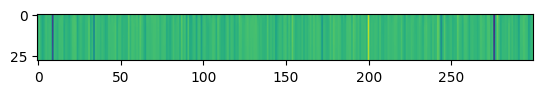

Train Epoch: 31 [1000/2360 (42%)]	 KLD Loss: 0.000127 	 NLL Loss: 8646.399414


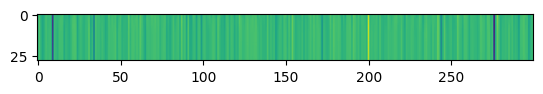

Train Epoch: 31 [1200/2360 (51%)]	 KLD Loss: 0.000113 	 NLL Loss: 8639.166016


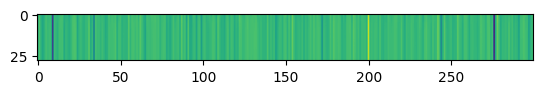

Train Epoch: 31 [1400/2360 (59%)]	 KLD Loss: 0.000050 	 NLL Loss: 8644.119141


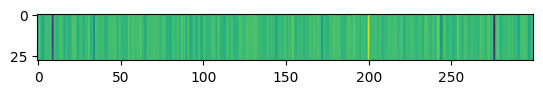

Train Epoch: 31 [1600/2360 (68%)]	 KLD Loss: 0.000184 	 NLL Loss: 8651.138672


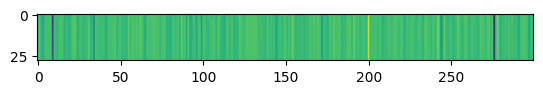

Train Epoch: 31 [1800/2360 (76%)]	 KLD Loss: 0.000228 	 NLL Loss: 8644.380859


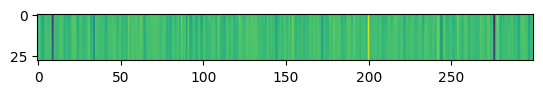

Train Epoch: 31 [2000/2360 (85%)]	 KLD Loss: 0.000850 	 NLL Loss: 8644.654297


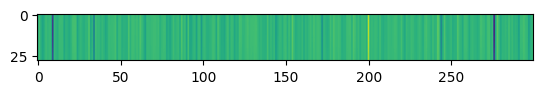

Train Epoch: 31 [2200/2360 (93%)]	 KLD Loss: 0.000296 	 NLL Loss: 8639.925781


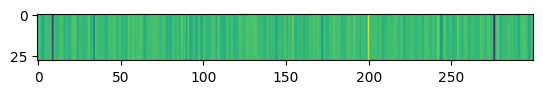

====> Epoch: 31 Average loss: 9243.2686
====> Test set loss: KLD Loss = 0.0004, NLL Loss = 8602.2905 
Train Epoch: 32 [0/2360 (0%)]	 KLD Loss: 0.000414 	 NLL Loss: 8644.770508


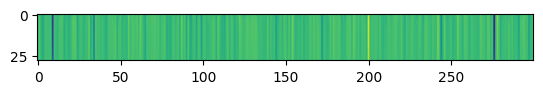

Train Epoch: 32 [200/2360 (8%)]	 KLD Loss: 0.000776 	 NLL Loss: 8646.438477


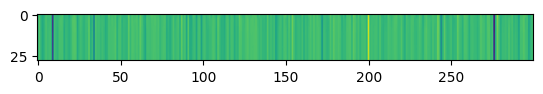

Train Epoch: 32 [400/2360 (17%)]	 KLD Loss: 0.000333 	 NLL Loss: 8646.156250


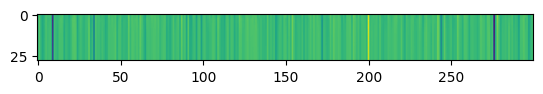

Train Epoch: 32 [600/2360 (25%)]	 KLD Loss: 0.001562 	 NLL Loss: 8596.084961


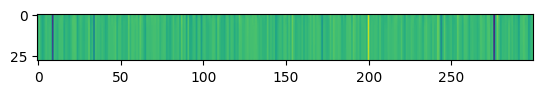

Train Epoch: 32 [800/2360 (34%)]	 KLD Loss: 0.000415 	 NLL Loss: 8643.371094


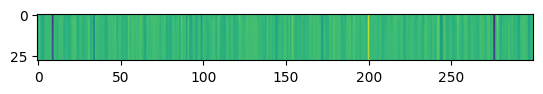

Train Epoch: 32 [1000/2360 (42%)]	 KLD Loss: 0.000396 	 NLL Loss: 8646.369141


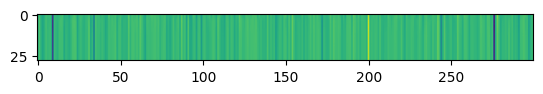

Train Epoch: 32 [1200/2360 (51%)]	 KLD Loss: 0.000306 	 NLL Loss: 8639.154297


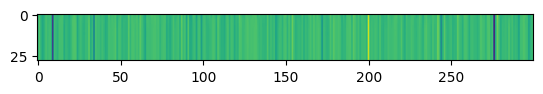

Train Epoch: 32 [1400/2360 (59%)]	 KLD Loss: 0.000072 	 NLL Loss: 8644.372070


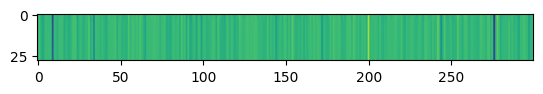

Train Epoch: 32 [1600/2360 (68%)]	 KLD Loss: 0.000085 	 NLL Loss: 8651.085938


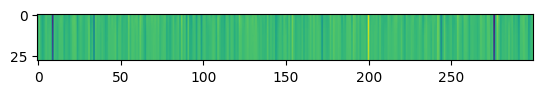

Train Epoch: 32 [1800/2360 (76%)]	 KLD Loss: 0.000228 	 NLL Loss: 8644.375000


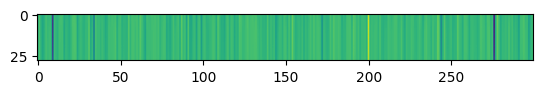

Train Epoch: 32 [2000/2360 (85%)]	 KLD Loss: 0.001062 	 NLL Loss: 8644.621094


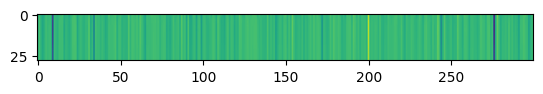

Train Epoch: 32 [2200/2360 (93%)]	 KLD Loss: 0.000940 	 NLL Loss: 8639.882812


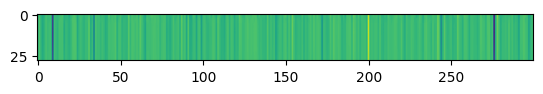

====> Epoch: 32 Average loss: 9243.2434
====> Test set loss: KLD Loss = 0.0011, NLL Loss = 8602.3119 
Train Epoch: 33 [0/2360 (0%)]	 KLD Loss: 0.000961 	 NLL Loss: 8644.853516


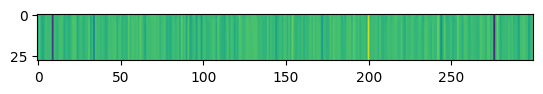

Train Epoch: 33 [200/2360 (8%)]	 KLD Loss: 0.001629 	 NLL Loss: 8646.821289


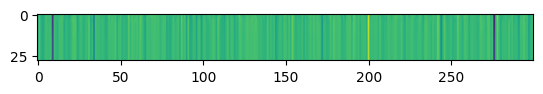

Train Epoch: 33 [400/2360 (17%)]	 KLD Loss: 0.000945 	 NLL Loss: 8646.476562


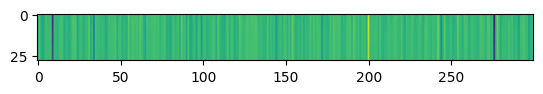

Train Epoch: 33 [600/2360 (25%)]	 KLD Loss: 0.000634 	 NLL Loss: 8595.966797


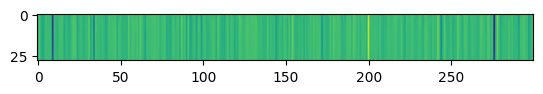

Train Epoch: 33 [800/2360 (34%)]	 KLD Loss: 0.000264 	 NLL Loss: 8643.283203


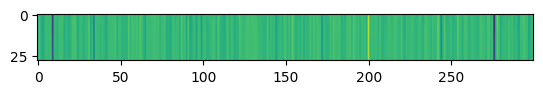

Train Epoch: 33 [1000/2360 (42%)]	 KLD Loss: 0.000138 	 NLL Loss: 8646.509766


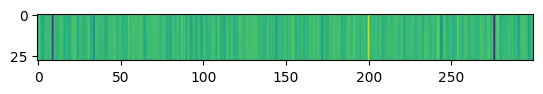

Train Epoch: 33 [1200/2360 (51%)]	 KLD Loss: 0.000169 	 NLL Loss: 8639.258789


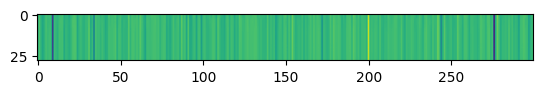

Train Epoch: 33 [1400/2360 (59%)]	 KLD Loss: 0.000310 	 NLL Loss: 8644.125977


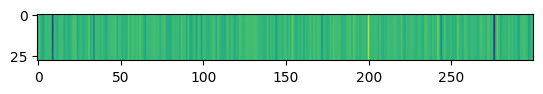

Train Epoch: 33 [1600/2360 (68%)]	 KLD Loss: 0.000144 	 NLL Loss: 8650.957031


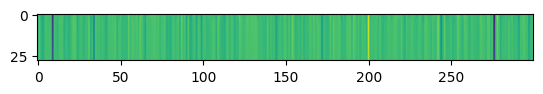

Train Epoch: 33 [1800/2360 (76%)]	 KLD Loss: 0.000104 	 NLL Loss: 8644.391602


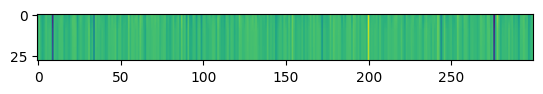

Train Epoch: 33 [2000/2360 (85%)]	 KLD Loss: 0.000886 	 NLL Loss: 8644.705078


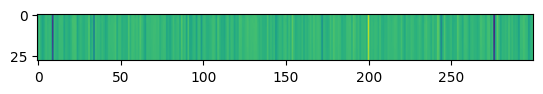

Train Epoch: 33 [2200/2360 (93%)]	 KLD Loss: 0.000432 	 NLL Loss: 8639.843750


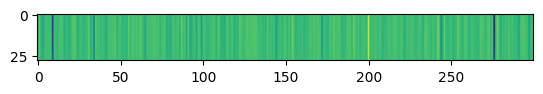

====> Epoch: 33 Average loss: 9243.2868
====> Test set loss: KLD Loss = 0.0008, NLL Loss = 8602.2943 
Train Epoch: 34 [0/2360 (0%)]	 KLD Loss: 0.000816 	 NLL Loss: 8644.750000


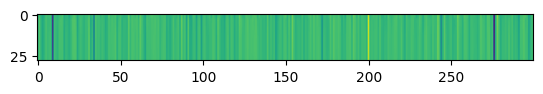

Train Epoch: 34 [200/2360 (8%)]	 KLD Loss: 0.000564 	 NLL Loss: 8646.447266


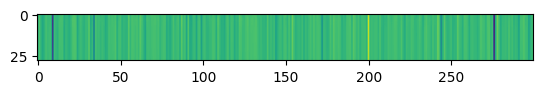

Train Epoch: 34 [400/2360 (17%)]	 KLD Loss: 0.000453 	 NLL Loss: 8646.283203


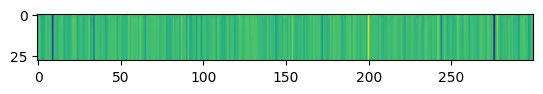

Train Epoch: 34 [600/2360 (25%)]	 KLD Loss: 0.001151 	 NLL Loss: 8595.952148


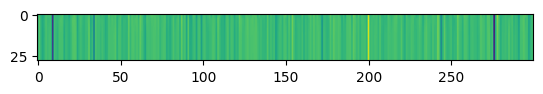

Train Epoch: 34 [800/2360 (34%)]	 KLD Loss: 0.000339 	 NLL Loss: 8643.371094


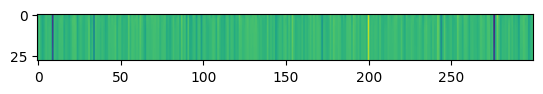

Train Epoch: 34 [1000/2360 (42%)]	 KLD Loss: 0.000679 	 NLL Loss: 8646.349609


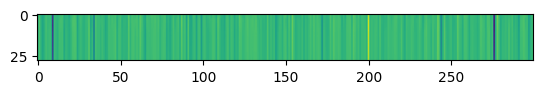

Train Epoch: 34 [1200/2360 (51%)]	 KLD Loss: 0.000345 	 NLL Loss: 8639.154297


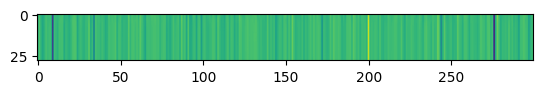

Train Epoch: 34 [1400/2360 (59%)]	 KLD Loss: 0.000151 	 NLL Loss: 8644.229492


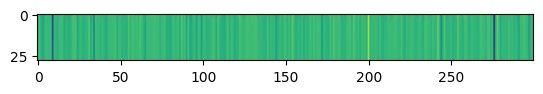

Train Epoch: 34 [1600/2360 (68%)]	 KLD Loss: 0.000081 	 NLL Loss: 8651.151367


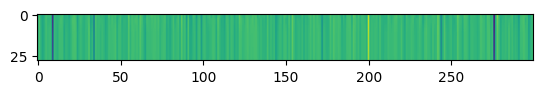

Train Epoch: 34 [1800/2360 (76%)]	 KLD Loss: 0.000115 	 NLL Loss: 8644.260742


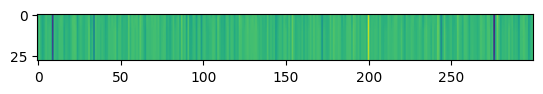

Train Epoch: 34 [2000/2360 (85%)]	 KLD Loss: 0.000628 	 NLL Loss: 8644.599609


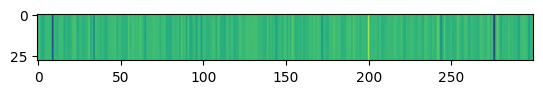

Train Epoch: 34 [2200/2360 (93%)]	 KLD Loss: 0.000844 	 NLL Loss: 8639.908203


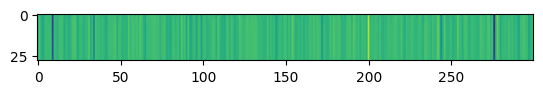

====> Epoch: 34 Average loss: 9243.2308
====> Test set loss: KLD Loss = 0.0020, NLL Loss = 8602.4689 
Train Epoch: 35 [0/2360 (0%)]	 KLD Loss: 0.002055 	 NLL Loss: 8644.800781


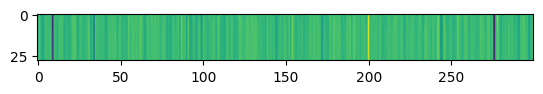

Train Epoch: 35 [200/2360 (8%)]	 KLD Loss: 0.001429 	 NLL Loss: 8646.834961


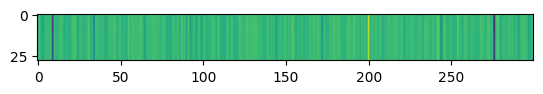

Train Epoch: 35 [400/2360 (17%)]	 KLD Loss: 0.000790 	 NLL Loss: 8646.518555


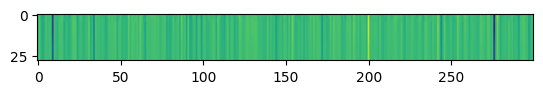

Train Epoch: 35 [600/2360 (25%)]	 KLD Loss: 0.000286 	 NLL Loss: 8596.011719


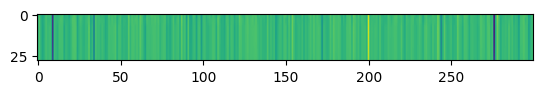

Train Epoch: 35 [800/2360 (34%)]	 KLD Loss: 0.000099 	 NLL Loss: 8643.263672


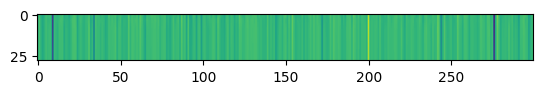

Train Epoch: 35 [1000/2360 (42%)]	 KLD Loss: 0.000065 	 NLL Loss: 8646.373047


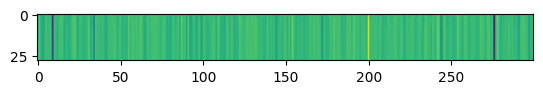

Train Epoch: 35 [1200/2360 (51%)]	 KLD Loss: 0.000095 	 NLL Loss: 8639.202148


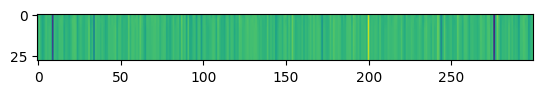

Train Epoch: 35 [1400/2360 (59%)]	 KLD Loss: 0.000233 	 NLL Loss: 8644.019531


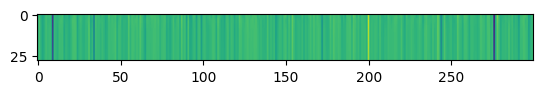

Train Epoch: 35 [1600/2360 (68%)]	 KLD Loss: 0.000080 	 NLL Loss: 8651.147461


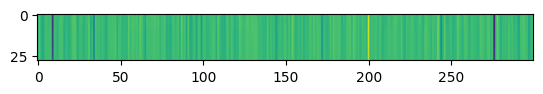

Train Epoch: 35 [1800/2360 (76%)]	 KLD Loss: 0.000069 	 NLL Loss: 8644.365234


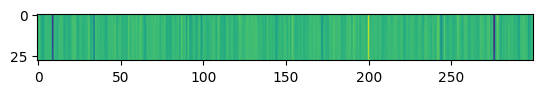

Train Epoch: 35 [2000/2360 (85%)]	 KLD Loss: 0.000261 	 NLL Loss: 8644.435547


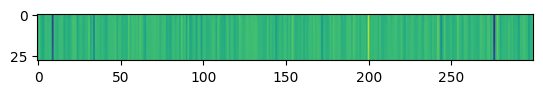

Train Epoch: 35 [2200/2360 (93%)]	 KLD Loss: 0.000581 	 NLL Loss: 8639.798828


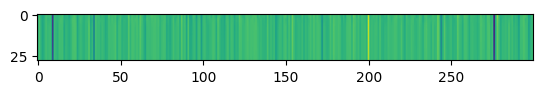

====> Epoch: 35 Average loss: 9243.2475
====> Test set loss: KLD Loss = 0.0026, NLL Loss = 8602.3852 
Train Epoch: 36 [0/2360 (0%)]	 KLD Loss: 0.002546 	 NLL Loss: 8644.816406


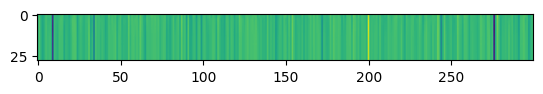

Train Epoch: 36 [200/2360 (8%)]	 KLD Loss: 0.001146 	 NLL Loss: 8646.623047


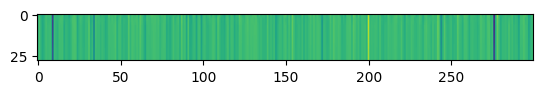

Train Epoch: 36 [400/2360 (17%)]	 KLD Loss: 0.001182 	 NLL Loss: 8646.500000


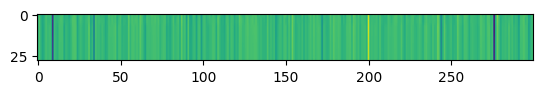

Train Epoch: 36 [600/2360 (25%)]	 KLD Loss: 0.001504 	 NLL Loss: 8595.942383


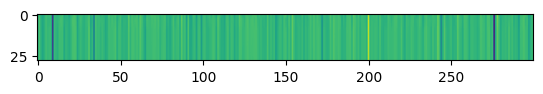

Train Epoch: 36 [800/2360 (34%)]	 KLD Loss: 0.000486 	 NLL Loss: 8643.287109


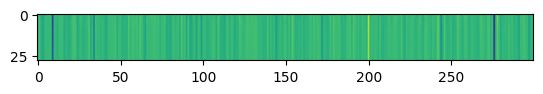

Train Epoch: 36 [1000/2360 (42%)]	 KLD Loss: 0.000272 	 NLL Loss: 8646.280273


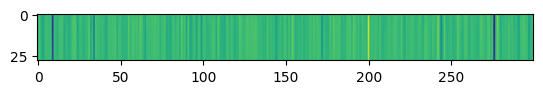

Train Epoch: 36 [1200/2360 (51%)]	 KLD Loss: 0.000168 	 NLL Loss: 8639.146484


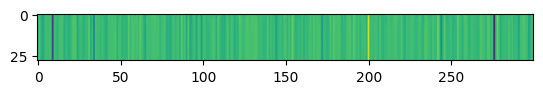

Train Epoch: 36 [1400/2360 (59%)]	 KLD Loss: 0.000162 	 NLL Loss: 8644.047852


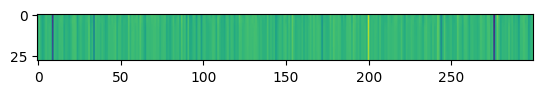

Train Epoch: 36 [1600/2360 (68%)]	 KLD Loss: 0.000127 	 NLL Loss: 8651.228516


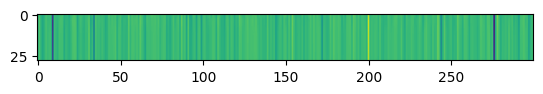

Train Epoch: 36 [1800/2360 (76%)]	 KLD Loss: 0.000080 	 NLL Loss: 8644.259766


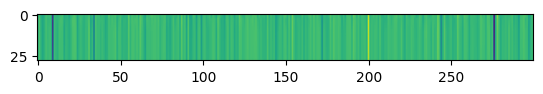

Train Epoch: 36 [2000/2360 (85%)]	 KLD Loss: 0.000385 	 NLL Loss: 8644.474609


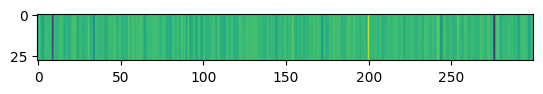

Train Epoch: 36 [2200/2360 (93%)]	 KLD Loss: 0.000458 	 NLL Loss: 8639.844727


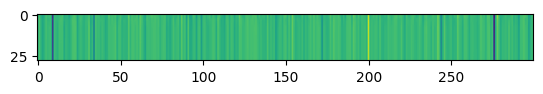

====> Epoch: 36 Average loss: 9243.2128
====> Test set loss: KLD Loss = 0.0008, NLL Loss = 8602.2815 
Train Epoch: 37 [0/2360 (0%)]	 KLD Loss: 0.000811 	 NLL Loss: 8644.707031


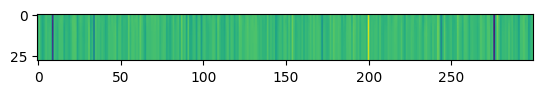

Train Epoch: 37 [200/2360 (8%)]	 KLD Loss: 0.001562 	 NLL Loss: 8646.603516


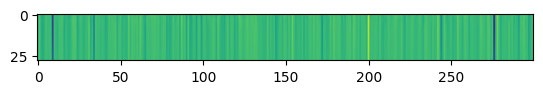

Train Epoch: 37 [400/2360 (17%)]	 KLD Loss: 0.001189 	 NLL Loss: 8646.364258


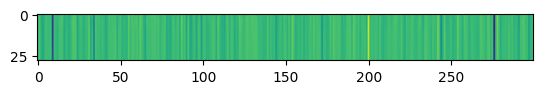

Train Epoch: 37 [600/2360 (25%)]	 KLD Loss: 0.002385 	 NLL Loss: 8595.971680


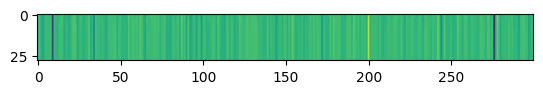

Train Epoch: 37 [800/2360 (34%)]	 KLD Loss: 0.000811 	 NLL Loss: 8643.346680


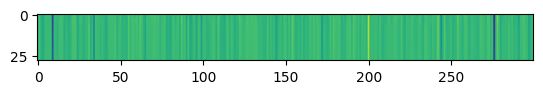

Train Epoch: 37 [1000/2360 (42%)]	 KLD Loss: 0.000361 	 NLL Loss: 8646.317383


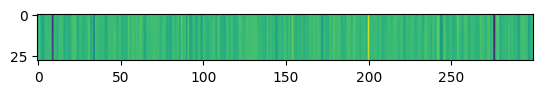

Train Epoch: 37 [1200/2360 (51%)]	 KLD Loss: 0.000273 	 NLL Loss: 8639.207031


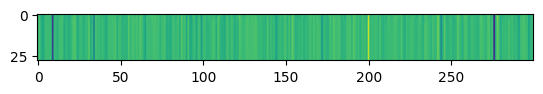

Train Epoch: 37 [1400/2360 (59%)]	 KLD Loss: 0.000110 	 NLL Loss: 8644.123047


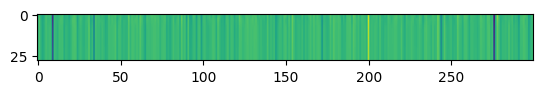

Train Epoch: 37 [1600/2360 (68%)]	 KLD Loss: 0.000075 	 NLL Loss: 8651.028320


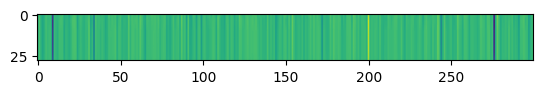

Train Epoch: 37 [1800/2360 (76%)]	 KLD Loss: 0.000266 	 NLL Loss: 8644.224609


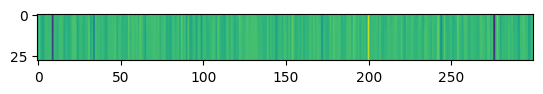

Train Epoch: 37 [2000/2360 (85%)]	 KLD Loss: 0.001688 	 NLL Loss: 8644.513672


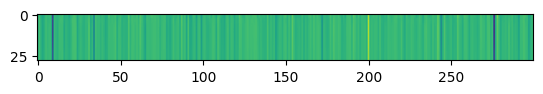

Train Epoch: 37 [2200/2360 (93%)]	 KLD Loss: 0.001274 	 NLL Loss: 8639.936523


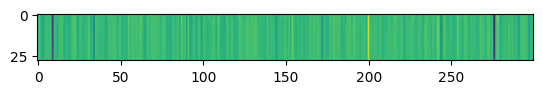

====> Epoch: 37 Average loss: 9243.1877
====> Test set loss: KLD Loss = 0.0051, NLL Loss = 8602.3403 
Train Epoch: 38 [0/2360 (0%)]	 KLD Loss: 0.005074 	 NLL Loss: 8644.751953


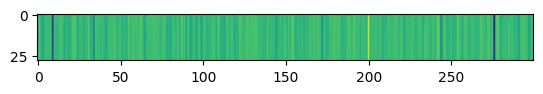

Train Epoch: 38 [200/2360 (8%)]	 KLD Loss: 0.002794 	 NLL Loss: 8646.767578


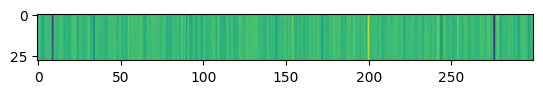

Train Epoch: 38 [400/2360 (17%)]	 KLD Loss: 0.000924 	 NLL Loss: 8646.468750


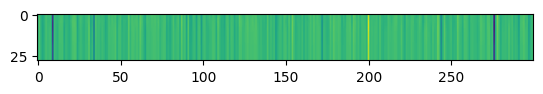

Train Epoch: 38 [600/2360 (25%)]	 KLD Loss: 0.000755 	 NLL Loss: 8596.051758


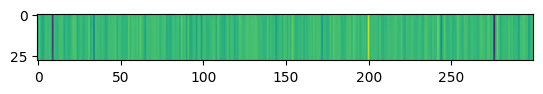

Train Epoch: 38 [800/2360 (34%)]	 KLD Loss: 0.000417 	 NLL Loss: 8643.314453


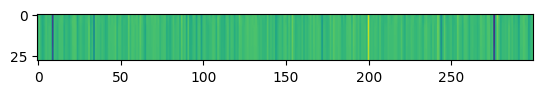

Train Epoch: 38 [1000/2360 (42%)]	 KLD Loss: 0.000218 	 NLL Loss: 8646.364258


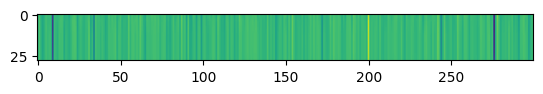

Train Epoch: 38 [1200/2360 (51%)]	 KLD Loss: 0.000319 	 NLL Loss: 8639.214844


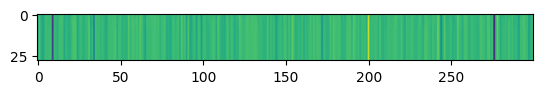

Train Epoch: 38 [1400/2360 (59%)]	 KLD Loss: 0.052192 	 NLL Loss: 8667.255859


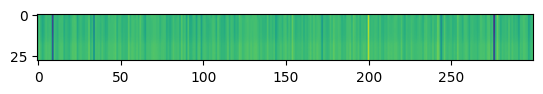

Train Epoch: 38 [1600/2360 (68%)]	 KLD Loss: 0.049585 	 NLL Loss: 8648.513672


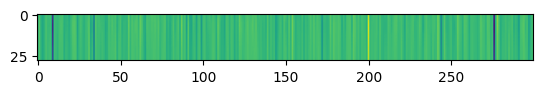

Train Epoch: 38 [1800/2360 (76%)]	 KLD Loss: 0.023930 	 NLL Loss: 8644.922852


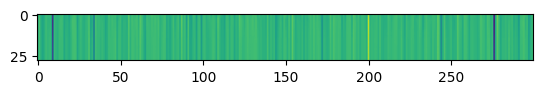

Train Epoch: 38 [2000/2360 (85%)]	 KLD Loss: 0.005952 	 NLL Loss: 8645.718750


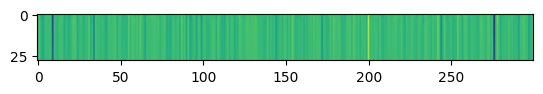

Train Epoch: 38 [2200/2360 (93%)]	 KLD Loss: 0.003486 	 NLL Loss: 8640.193359


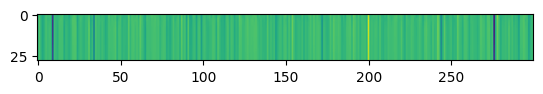

====> Epoch: 38 Average loss: 9243.2454
====> Test set loss: KLD Loss = 0.0028, NLL Loss = 8602.2938 
Train Epoch: 39 [0/2360 (0%)]	 KLD Loss: 0.002806 	 NLL Loss: 8644.880859


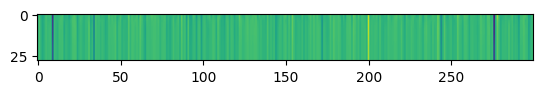

Train Epoch: 39 [200/2360 (8%)]	 KLD Loss: 0.002249 	 NLL Loss: 8646.200195


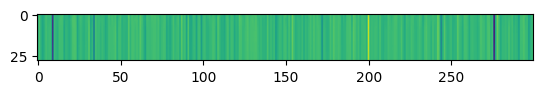

Train Epoch: 39 [400/2360 (17%)]	 KLD Loss: 0.000839 	 NLL Loss: 8645.944336


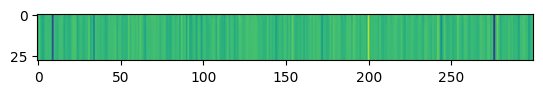

Train Epoch: 39 [600/2360 (25%)]	 KLD Loss: 0.001825 	 NLL Loss: 8596.050781


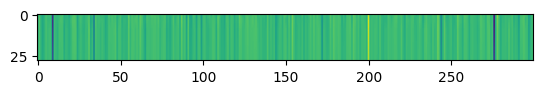

Train Epoch: 39 [800/2360 (34%)]	 KLD Loss: 0.000624 	 NLL Loss: 8643.513672


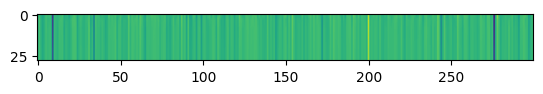

Train Epoch: 39 [1000/2360 (42%)]	 KLD Loss: 0.000378 	 NLL Loss: 8646.410156


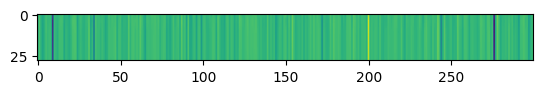

Train Epoch: 39 [1200/2360 (51%)]	 KLD Loss: 0.000609 	 NLL Loss: 8639.210938


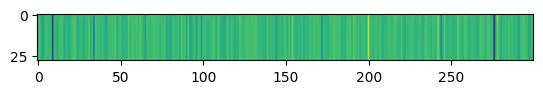

Train Epoch: 39 [1400/2360 (59%)]	 KLD Loss: 0.000113 	 NLL Loss: 8644.504883


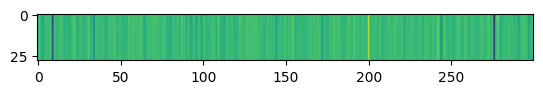

Train Epoch: 39 [1600/2360 (68%)]	 KLD Loss: 0.000033 	 NLL Loss: 8651.012695


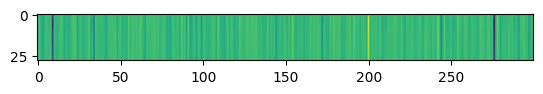

Train Epoch: 39 [1800/2360 (76%)]	 KLD Loss: 0.000620 	 NLL Loss: 8644.400391


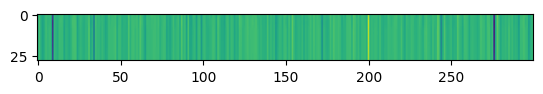

Train Epoch: 39 [2000/2360 (85%)]	 KLD Loss: 0.000461 	 NLL Loss: 8644.708008


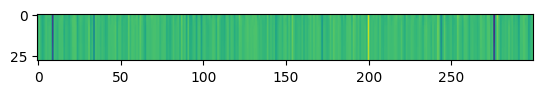

Train Epoch: 39 [2200/2360 (93%)]	 KLD Loss: 0.002125 	 NLL Loss: 8639.880859


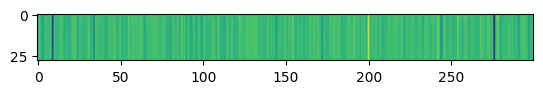

====> Epoch: 39 Average loss: 9243.2291
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.4873 
Train Epoch: 40 [0/2360 (0%)]	 KLD Loss: 0.000241 	 NLL Loss: 8644.882812


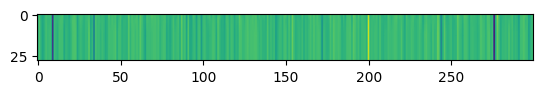

Train Epoch: 40 [200/2360 (8%)]	 KLD Loss: 0.003036 	 NLL Loss: 8646.809570


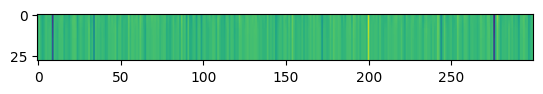

Train Epoch: 40 [400/2360 (17%)]	 KLD Loss: 0.001020 	 NLL Loss: 8646.502930


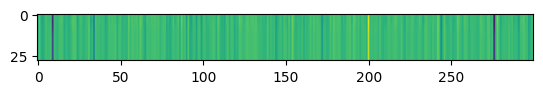

Train Epoch: 40 [600/2360 (25%)]	 KLD Loss: 0.000299 	 NLL Loss: 8596.120117


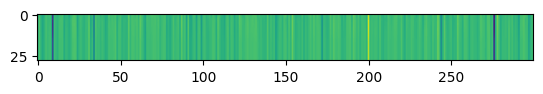

Train Epoch: 40 [800/2360 (34%)]	 KLD Loss: 0.000109 	 NLL Loss: 8643.302734


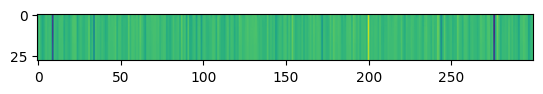

Train Epoch: 40 [1000/2360 (42%)]	 KLD Loss: 0.000394 	 NLL Loss: 8646.543945


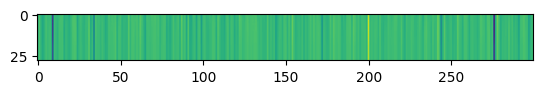

Train Epoch: 40 [1200/2360 (51%)]	 KLD Loss: 0.000515 	 NLL Loss: 8639.209961


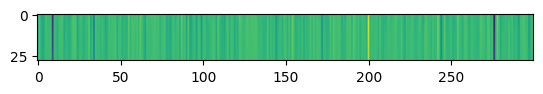

Train Epoch: 40 [1400/2360 (59%)]	 KLD Loss: 0.000153 	 NLL Loss: 8644.052734


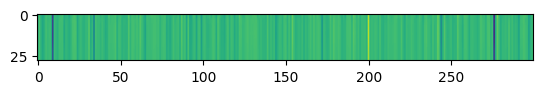

Train Epoch: 40 [1600/2360 (68%)]	 KLD Loss: 0.000084 	 NLL Loss: 8651.024414


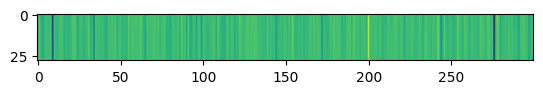

Train Epoch: 40 [1800/2360 (76%)]	 KLD Loss: 0.000278 	 NLL Loss: 8644.458984


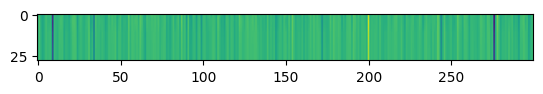

Train Epoch: 40 [2000/2360 (85%)]	 KLD Loss: 0.001447 	 NLL Loss: 8644.562500


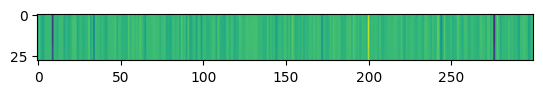

Train Epoch: 40 [2200/2360 (93%)]	 KLD Loss: 0.000726 	 NLL Loss: 8639.771484


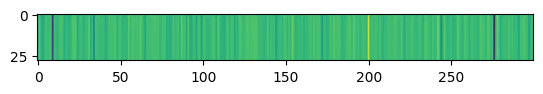

====> Epoch: 40 Average loss: 9243.2700
====> Test set loss: KLD Loss = 0.0024, NLL Loss = 8602.2264 
Train Epoch: 41 [0/2360 (0%)]	 KLD Loss: 0.002423 	 NLL Loss: 8644.789062


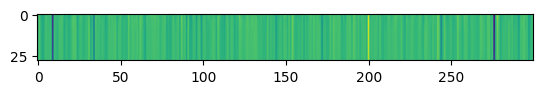

Train Epoch: 41 [200/2360 (8%)]	 KLD Loss: 0.002000 	 NLL Loss: 8646.527344


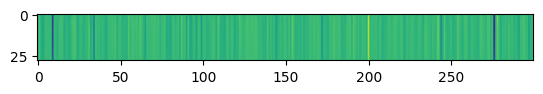

Train Epoch: 41 [400/2360 (17%)]	 KLD Loss: 0.000876 	 NLL Loss: 8646.271484


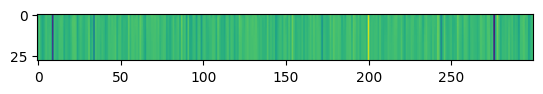

Train Epoch: 41 [600/2360 (25%)]	 KLD Loss: 0.001728 	 NLL Loss: 8595.985352


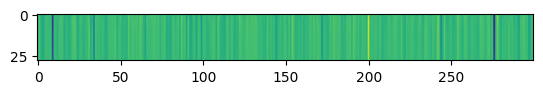

Train Epoch: 41 [800/2360 (34%)]	 KLD Loss: 0.000373 	 NLL Loss: 8643.205078


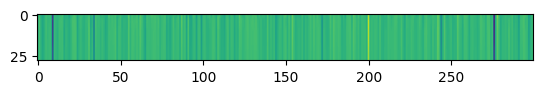

Train Epoch: 41 [1000/2360 (42%)]	 KLD Loss: 0.000185 	 NLL Loss: 8646.309570


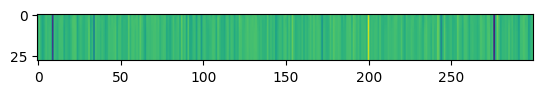

Train Epoch: 41 [1200/2360 (51%)]	 KLD Loss: 0.000206 	 NLL Loss: 8639.162109


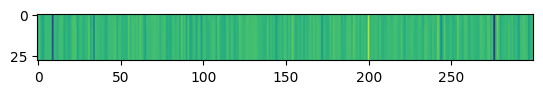

Train Epoch: 41 [1400/2360 (59%)]	 KLD Loss: 0.000103 	 NLL Loss: 8644.151367


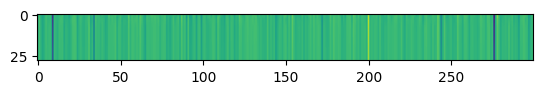

Train Epoch: 41 [1600/2360 (68%)]	 KLD Loss: 0.000073 	 NLL Loss: 8651.272461


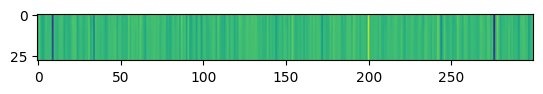

Train Epoch: 41 [1800/2360 (76%)]	 KLD Loss: 0.000371 	 NLL Loss: 8644.230469


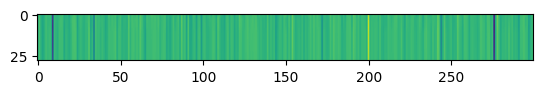

Train Epoch: 41 [2000/2360 (85%)]	 KLD Loss: 0.000378 	 NLL Loss: 8644.416016


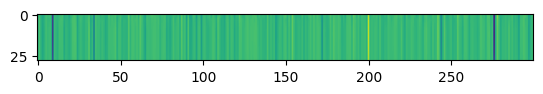

Train Epoch: 41 [2200/2360 (93%)]	 KLD Loss: 0.001061 	 NLL Loss: 8639.755859


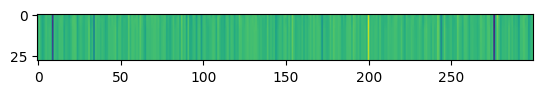

====> Epoch: 41 Average loss: 9243.1879
====> Test set loss: KLD Loss = 0.0014, NLL Loss = 8602.2558 
Train Epoch: 42 [0/2360 (0%)]	 KLD Loss: 0.001421 	 NLL Loss: 8644.811523


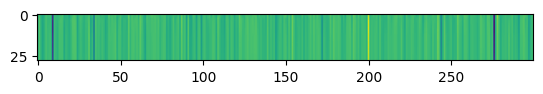

Train Epoch: 42 [200/2360 (8%)]	 KLD Loss: 0.001905 	 NLL Loss: 8646.758789


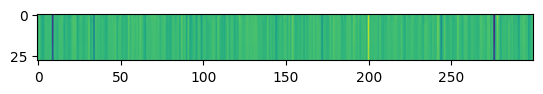

Train Epoch: 42 [400/2360 (17%)]	 KLD Loss: 0.001007 	 NLL Loss: 8646.423828


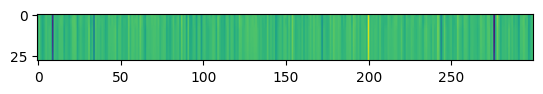

Train Epoch: 42 [600/2360 (25%)]	 KLD Loss: 0.000832 	 NLL Loss: 8595.975586


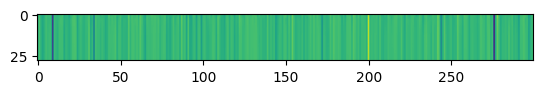

Train Epoch: 42 [800/2360 (34%)]	 KLD Loss: 0.000180 	 NLL Loss: 8643.243164


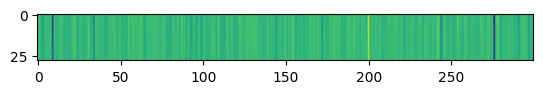

Train Epoch: 42 [1000/2360 (42%)]	 KLD Loss: 0.000168 	 NLL Loss: 8646.271484


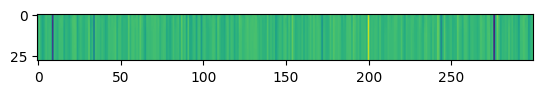

Train Epoch: 42 [1200/2360 (51%)]	 KLD Loss: 0.000606 	 NLL Loss: 8639.076172


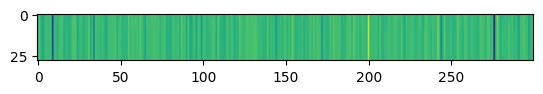

Train Epoch: 42 [1400/2360 (59%)]	 KLD Loss: 0.000140 	 NLL Loss: 8644.143555


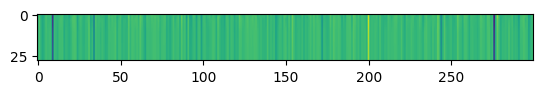

Train Epoch: 42 [1600/2360 (68%)]	 KLD Loss: 0.000052 	 NLL Loss: 8651.162109


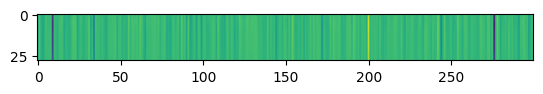

Train Epoch: 42 [1800/2360 (76%)]	 KLD Loss: 0.000100 	 NLL Loss: 8644.376953


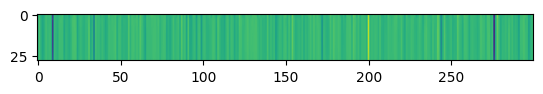

Train Epoch: 42 [2000/2360 (85%)]	 KLD Loss: 0.000297 	 NLL Loss: 8644.472656


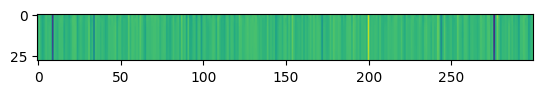

Train Epoch: 42 [2200/2360 (93%)]	 KLD Loss: 0.000314 	 NLL Loss: 8639.793945


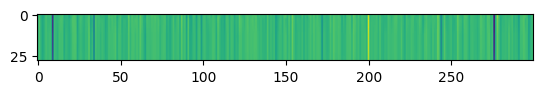

====> Epoch: 42 Average loss: 9243.2008
====> Test set loss: KLD Loss = 0.0011, NLL Loss = 8602.3609 
Train Epoch: 43 [0/2360 (0%)]	 KLD Loss: 0.001117 	 NLL Loss: 8644.849609


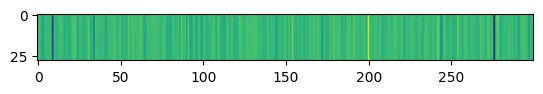

Train Epoch: 43 [200/2360 (8%)]	 KLD Loss: 0.000797 	 NLL Loss: 8646.606445


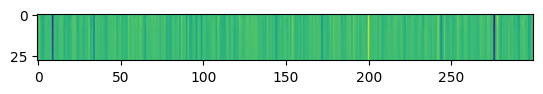

Train Epoch: 43 [400/2360 (17%)]	 KLD Loss: 0.000310 	 NLL Loss: 8646.349609


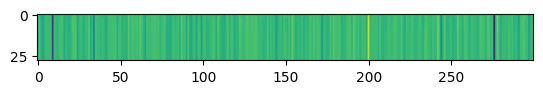

Train Epoch: 43 [600/2360 (25%)]	 KLD Loss: 0.000377 	 NLL Loss: 8595.952148


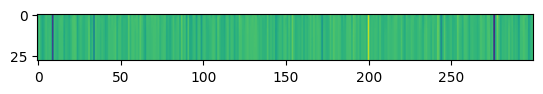

Train Epoch: 43 [800/2360 (34%)]	 KLD Loss: 0.000060 	 NLL Loss: 8643.246094


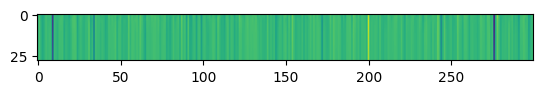

Train Epoch: 43 [1000/2360 (42%)]	 KLD Loss: 0.000095 	 NLL Loss: 8646.419922


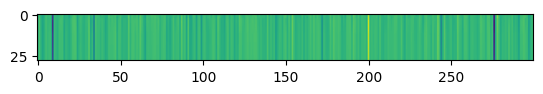

Train Epoch: 43 [1200/2360 (51%)]	 KLD Loss: 0.000260 	 NLL Loss: 8639.115234


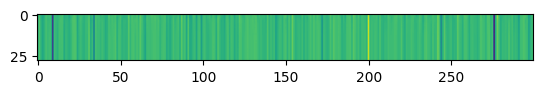

Train Epoch: 43 [1400/2360 (59%)]	 KLD Loss: 0.000141 	 NLL Loss: 8644.097656


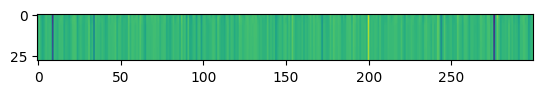

Train Epoch: 43 [1600/2360 (68%)]	 KLD Loss: 0.000098 	 NLL Loss: 8651.184570


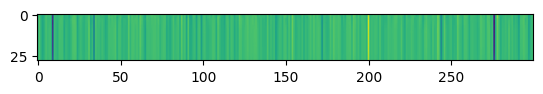

Train Epoch: 43 [1800/2360 (76%)]	 KLD Loss: 0.000125 	 NLL Loss: 8644.314453


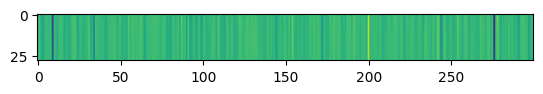

Train Epoch: 43 [2000/2360 (85%)]	 KLD Loss: 0.000156 	 NLL Loss: 8644.386719


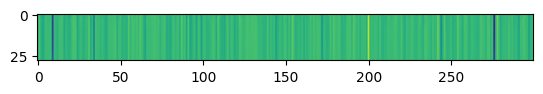

Train Epoch: 43 [2200/2360 (93%)]	 KLD Loss: 0.000198 	 NLL Loss: 8639.819336


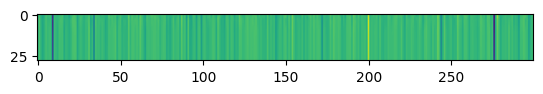

====> Epoch: 43 Average loss: 9243.1969
====> Test set loss: KLD Loss = 0.0015, NLL Loss = 8602.3279 
Train Epoch: 44 [0/2360 (0%)]	 KLD Loss: 0.001498 	 NLL Loss: 8644.759766


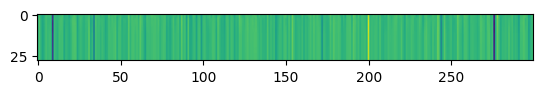

Train Epoch: 44 [200/2360 (8%)]	 KLD Loss: 0.000576 	 NLL Loss: 8646.633789


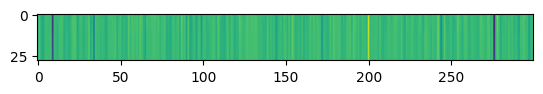

Train Epoch: 44 [400/2360 (17%)]	 KLD Loss: 0.000393 	 NLL Loss: 8646.323242


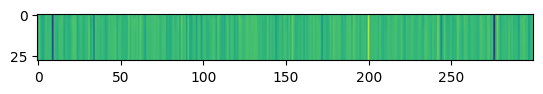

Train Epoch: 44 [600/2360 (25%)]	 KLD Loss: 0.000773 	 NLL Loss: 8595.923828


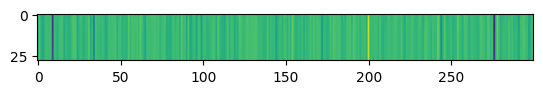

Train Epoch: 44 [800/2360 (34%)]	 KLD Loss: 0.000511 	 NLL Loss: 8643.217773


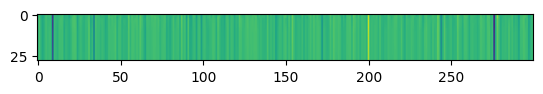

Train Epoch: 44 [1000/2360 (42%)]	 KLD Loss: 0.000202 	 NLL Loss: 8646.282227


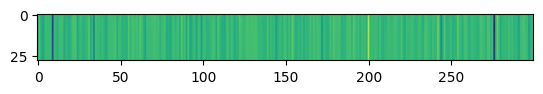

Train Epoch: 44 [1200/2360 (51%)]	 KLD Loss: 0.000167 	 NLL Loss: 8639.125977


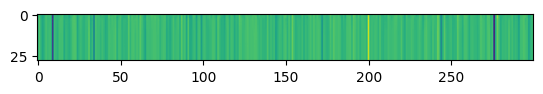

Train Epoch: 44 [1400/2360 (59%)]	 KLD Loss: 0.000143 	 NLL Loss: 8644.117188


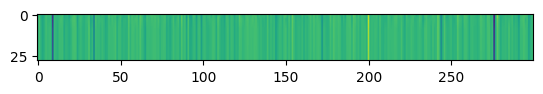

Train Epoch: 44 [1600/2360 (68%)]	 KLD Loss: 0.000075 	 NLL Loss: 8651.205078


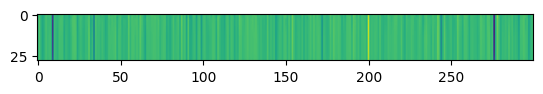

Train Epoch: 44 [1800/2360 (76%)]	 KLD Loss: 0.000092 	 NLL Loss: 8644.333984


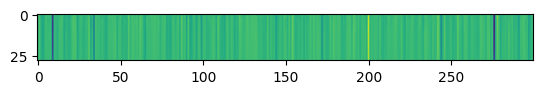

Train Epoch: 44 [2000/2360 (85%)]	 KLD Loss: 0.000081 	 NLL Loss: 8644.444336


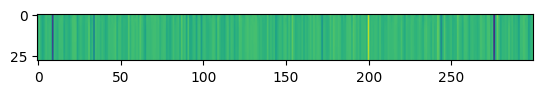

Train Epoch: 44 [2200/2360 (93%)]	 KLD Loss: 0.000404 	 NLL Loss: 8639.760742


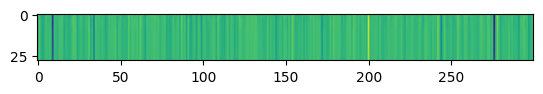

====> Epoch: 44 Average loss: 9243.1821
====> Test set loss: KLD Loss = 0.0007, NLL Loss = 8602.2970 
Train Epoch: 45 [0/2360 (0%)]	 KLD Loss: 0.000705 	 NLL Loss: 8644.739258


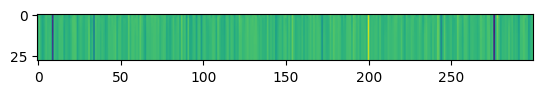

Train Epoch: 45 [200/2360 (8%)]	 KLD Loss: 0.000442 	 NLL Loss: 8646.626953


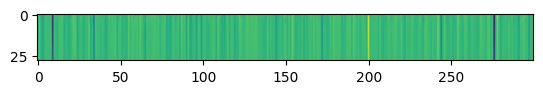

Train Epoch: 45 [400/2360 (17%)]	 KLD Loss: 0.000172 	 NLL Loss: 8646.296875


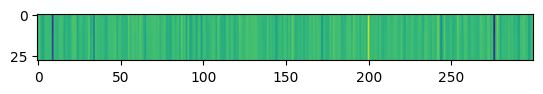

Train Epoch: 45 [600/2360 (25%)]	 KLD Loss: 0.000278 	 NLL Loss: 8595.961914


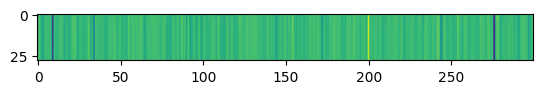

Train Epoch: 45 [800/2360 (34%)]	 KLD Loss: 0.000088 	 NLL Loss: 8643.228516


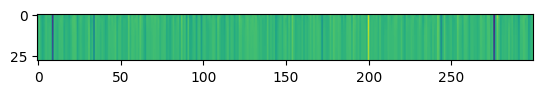

Train Epoch: 45 [1000/2360 (42%)]	 KLD Loss: 0.000169 	 NLL Loss: 8646.330078


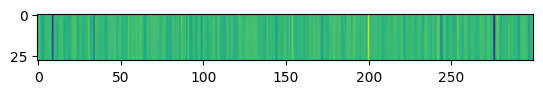

Train Epoch: 45 [1200/2360 (51%)]	 KLD Loss: 0.000661 	 NLL Loss: 8639.128906


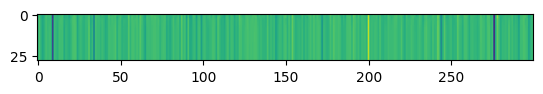

Train Epoch: 45 [1400/2360 (59%)]	 KLD Loss: 0.000155 	 NLL Loss: 8644.048828


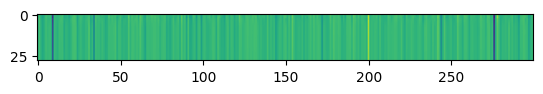

Train Epoch: 45 [1600/2360 (68%)]	 KLD Loss: 0.000080 	 NLL Loss: 8651.169922


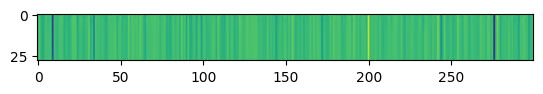

Train Epoch: 45 [1800/2360 (76%)]	 KLD Loss: 0.001660 	 NLL Loss: 8644.068359


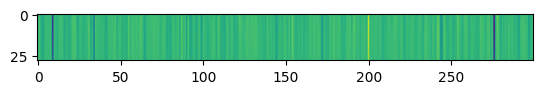

Train Epoch: 45 [2000/2360 (85%)]	 KLD Loss: 0.001065 	 NLL Loss: 8644.831055


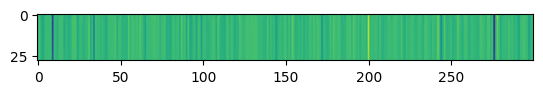

Train Epoch: 45 [2200/2360 (93%)]	 KLD Loss: 0.001247 	 NLL Loss: 8640.051758


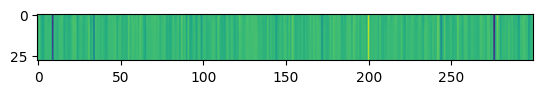

====> Epoch: 45 Average loss: 9243.1888
====> Test set loss: KLD Loss = 0.0052, NLL Loss = 8602.2506 
Train Epoch: 46 [0/2360 (0%)]	 KLD Loss: 0.005197 	 NLL Loss: 8644.728516


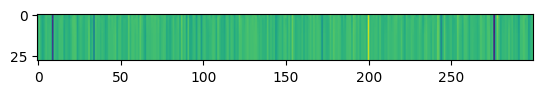

Train Epoch: 46 [200/2360 (8%)]	 KLD Loss: 0.000766 	 NLL Loss: 8646.482422


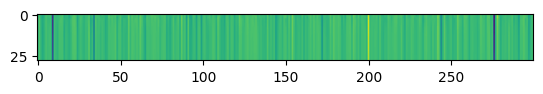

Train Epoch: 46 [400/2360 (17%)]	 KLD Loss: 0.000557 	 NLL Loss: 8646.245117


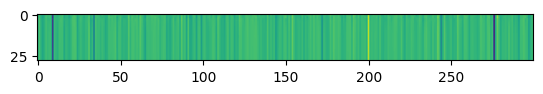

Train Epoch: 46 [600/2360 (25%)]	 KLD Loss: 0.000479 	 NLL Loss: 8595.871094


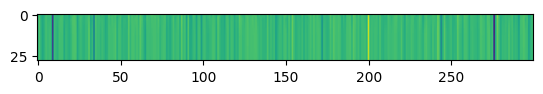

Train Epoch: 46 [800/2360 (34%)]	 KLD Loss: 0.000294 	 NLL Loss: 8643.335938


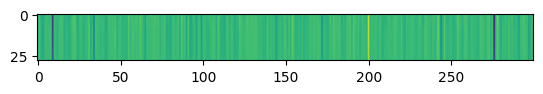

Train Epoch: 46 [1000/2360 (42%)]	 KLD Loss: 0.000200 	 NLL Loss: 8646.380859


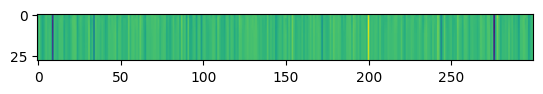

Train Epoch: 46 [1200/2360 (51%)]	 KLD Loss: 0.000229 	 NLL Loss: 8639.078125


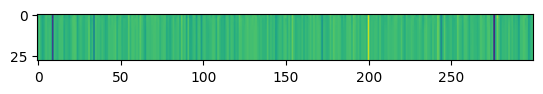

Train Epoch: 46 [1400/2360 (59%)]	 KLD Loss: 0.000064 	 NLL Loss: 8644.192383


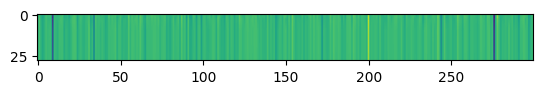

Train Epoch: 46 [1600/2360 (68%)]	 KLD Loss: 0.000058 	 NLL Loss: 8651.111328


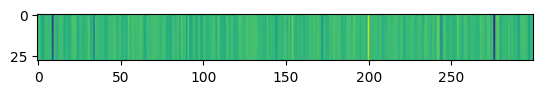

Train Epoch: 46 [1800/2360 (76%)]	 KLD Loss: 0.000115 	 NLL Loss: 8644.304688


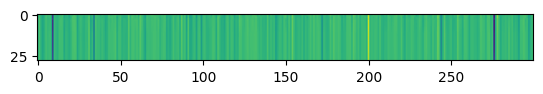

Train Epoch: 46 [2000/2360 (85%)]	 KLD Loss: 0.000169 	 NLL Loss: 8644.423828


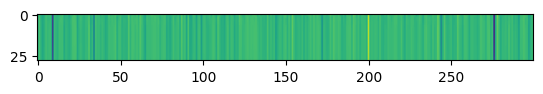

Train Epoch: 46 [2200/2360 (93%)]	 KLD Loss: 0.001510 	 NLL Loss: 8639.824219


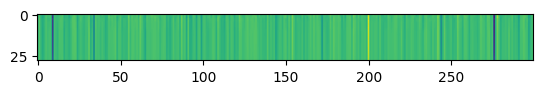

====> Epoch: 46 Average loss: 9243.1396
====> Test set loss: KLD Loss = 0.0033, NLL Loss = 8602.3345 
Train Epoch: 47 [0/2360 (0%)]	 KLD Loss: 0.003295 	 NLL Loss: 8644.744141


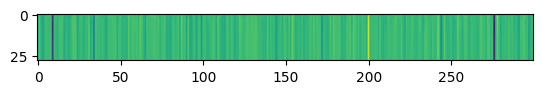

Train Epoch: 47 [200/2360 (8%)]	 KLD Loss: 0.001449 	 NLL Loss: 8646.716797


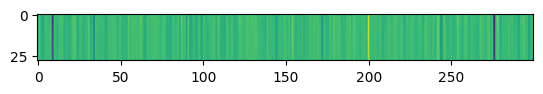

Train Epoch: 47 [400/2360 (17%)]	 KLD Loss: 0.000790 	 NLL Loss: 8646.344727


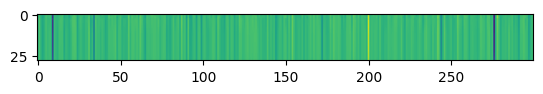

Train Epoch: 47 [600/2360 (25%)]	 KLD Loss: 0.000822 	 NLL Loss: 8595.935547


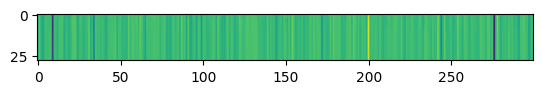

Train Epoch: 47 [800/2360 (34%)]	 KLD Loss: 0.000271 	 NLL Loss: 8643.208008


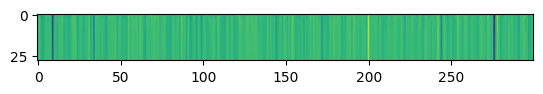

Train Epoch: 47 [1000/2360 (42%)]	 KLD Loss: 0.000188 	 NLL Loss: 8646.335938


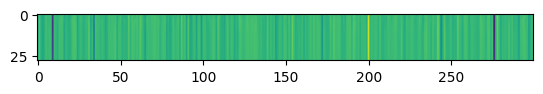

Train Epoch: 47 [1200/2360 (51%)]	 KLD Loss: 0.000405 	 NLL Loss: 8639.146484


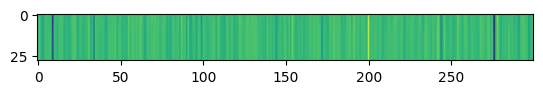

Train Epoch: 47 [1400/2360 (59%)]	 KLD Loss: 0.000160 	 NLL Loss: 8644.041992


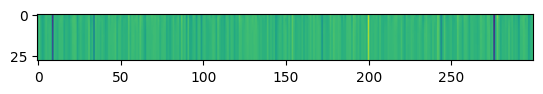

Train Epoch: 47 [1600/2360 (68%)]	 KLD Loss: 0.000133 	 NLL Loss: 8651.145508


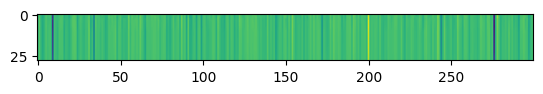

Train Epoch: 47 [1800/2360 (76%)]	 KLD Loss: 0.000059 	 NLL Loss: 8644.335938


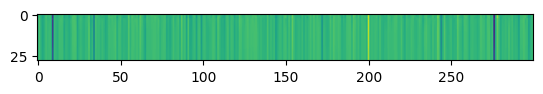

Train Epoch: 47 [2000/2360 (85%)]	 KLD Loss: 0.000325 	 NLL Loss: 8644.384766


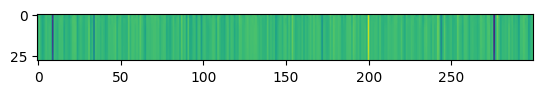

Train Epoch: 47 [2200/2360 (93%)]	 KLD Loss: 0.000386 	 NLL Loss: 8639.791016


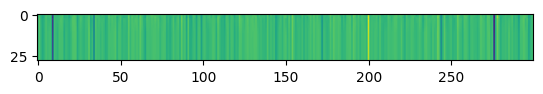

====> Epoch: 47 Average loss: 9243.1498
====> Test set loss: KLD Loss = 0.0015, NLL Loss = 8602.2103 
Train Epoch: 48 [0/2360 (0%)]	 KLD Loss: 0.001467 	 NLL Loss: 8644.673828


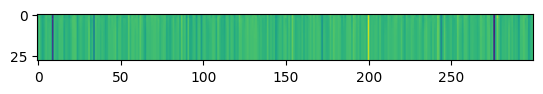

Train Epoch: 48 [200/2360 (8%)]	 KLD Loss: 0.000606 	 NLL Loss: 8646.538086


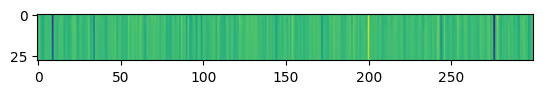

Train Epoch: 48 [400/2360 (17%)]	 KLD Loss: 0.000453 	 NLL Loss: 8646.226562


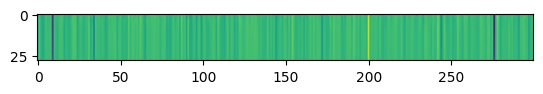

Train Epoch: 48 [600/2360 (25%)]	 KLD Loss: 0.000118 	 NLL Loss: 8595.943359


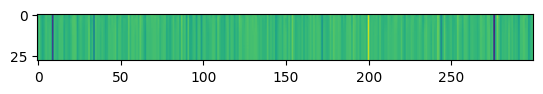

Train Epoch: 48 [800/2360 (34%)]	 KLD Loss: 0.000130 	 NLL Loss: 8643.285156


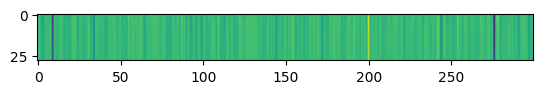

Train Epoch: 48 [1000/2360 (42%)]	 KLD Loss: 0.000078 	 NLL Loss: 8646.345703


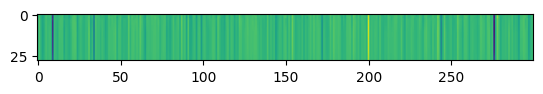

Train Epoch: 48 [1200/2360 (51%)]	 KLD Loss: 0.000443 	 NLL Loss: 8639.125977


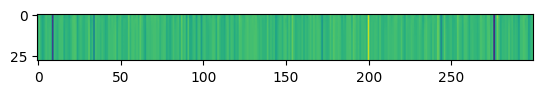

Train Epoch: 48 [1400/2360 (59%)]	 KLD Loss: 0.000120 	 NLL Loss: 8644.077148


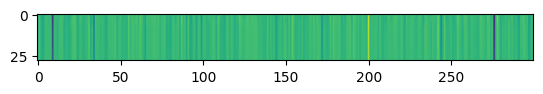

Train Epoch: 48 [1600/2360 (68%)]	 KLD Loss: 0.000241 	 NLL Loss: 8651.232422


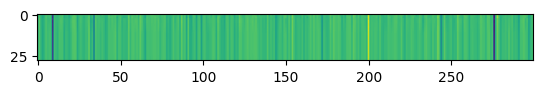

Train Epoch: 48 [1800/2360 (76%)]	 KLD Loss: 0.000080 	 NLL Loss: 8644.283203


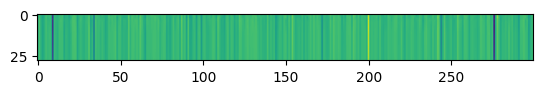

Train Epoch: 48 [2000/2360 (85%)]	 KLD Loss: 0.000290 	 NLL Loss: 8644.408203


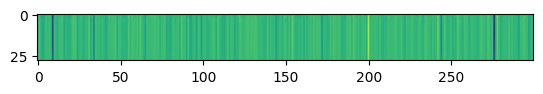

Train Epoch: 48 [2200/2360 (93%)]	 KLD Loss: 0.001234 	 NLL Loss: 8639.820312


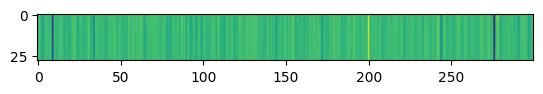

====> Epoch: 48 Average loss: 9243.1363
====> Test set loss: KLD Loss = 0.0052, NLL Loss = 8602.2700 
Train Epoch: 49 [0/2360 (0%)]	 KLD Loss: 0.005213 	 NLL Loss: 8644.713867


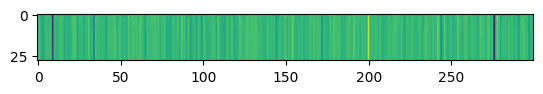

Train Epoch: 49 [200/2360 (8%)]	 KLD Loss: 0.002882 	 NLL Loss: 8646.553711


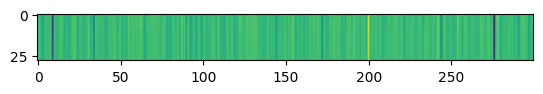

Train Epoch: 49 [400/2360 (17%)]	 KLD Loss: 0.000934 	 NLL Loss: 8646.281250


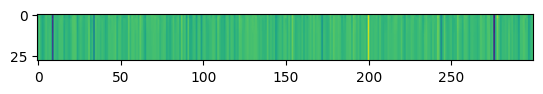

Train Epoch: 49 [600/2360 (25%)]	 KLD Loss: 0.000363 	 NLL Loss: 8595.951172


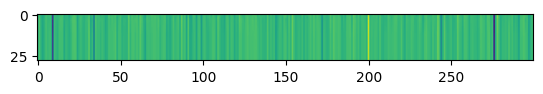

Train Epoch: 49 [800/2360 (34%)]	 KLD Loss: 0.000348 	 NLL Loss: 8643.248047


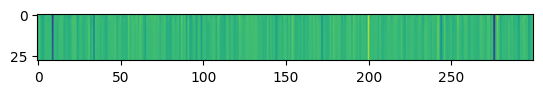

Train Epoch: 49 [1000/2360 (42%)]	 KLD Loss: 0.000193 	 NLL Loss: 8646.285156


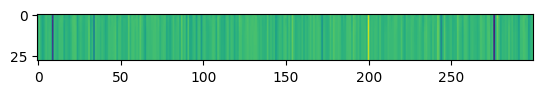

Train Epoch: 49 [1200/2360 (51%)]	 KLD Loss: 0.000828 	 NLL Loss: 8639.102539


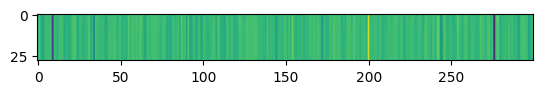

Train Epoch: 49 [1400/2360 (59%)]	 KLD Loss: 0.000126 	 NLL Loss: 8644.106445


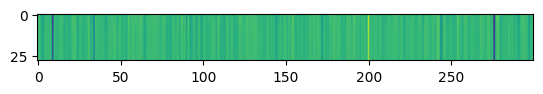

Train Epoch: 49 [1600/2360 (68%)]	 KLD Loss: 0.000214 	 NLL Loss: 8651.149414


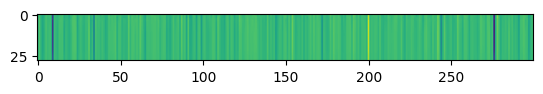

Train Epoch: 49 [1800/2360 (76%)]	 KLD Loss: 0.000046 	 NLL Loss: 8644.330078


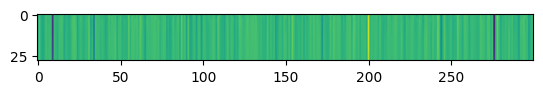

Train Epoch: 49 [2000/2360 (85%)]	 KLD Loss: 0.000394 	 NLL Loss: 8644.391602


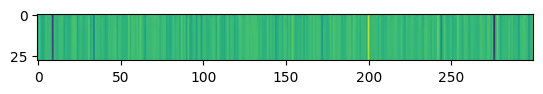

Train Epoch: 49 [2200/2360 (93%)]	 KLD Loss: 0.000413 	 NLL Loss: 8639.781250


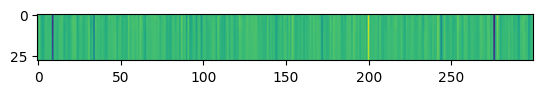

====> Epoch: 49 Average loss: 9243.1254
====> Test set loss: KLD Loss = 0.0034, NLL Loss = 8602.2280 
Train Epoch: 50 [0/2360 (0%)]	 KLD Loss: 0.003432 	 NLL Loss: 8644.765625


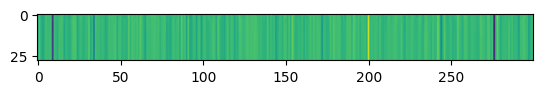

Train Epoch: 50 [200/2360 (8%)]	 KLD Loss: 0.002234 	 NLL Loss: 8646.507812


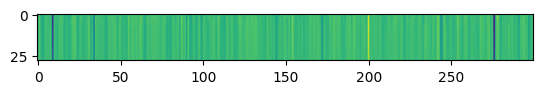

Train Epoch: 50 [400/2360 (17%)]	 KLD Loss: 0.000666 	 NLL Loss: 8646.322266


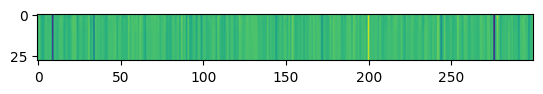

Train Epoch: 50 [600/2360 (25%)]	 KLD Loss: 0.000258 	 NLL Loss: 8595.959961


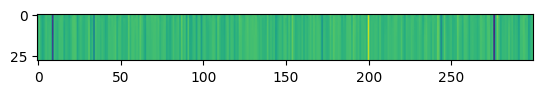

Train Epoch: 50 [800/2360 (34%)]	 KLD Loss: 0.000238 	 NLL Loss: 8643.215820


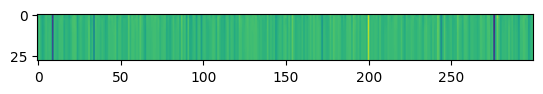

Train Epoch: 50 [1000/2360 (42%)]	 KLD Loss: 0.000158 	 NLL Loss: 8646.284180


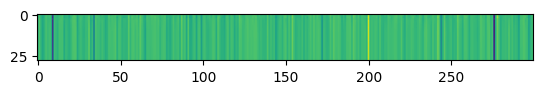

Train Epoch: 50 [1200/2360 (51%)]	 KLD Loss: 0.000108 	 NLL Loss: 8639.125977


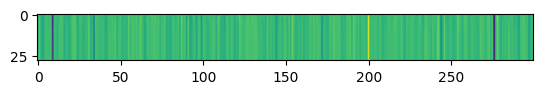

Train Epoch: 50 [1400/2360 (59%)]	 KLD Loss: 0.000148 	 NLL Loss: 8644.152344


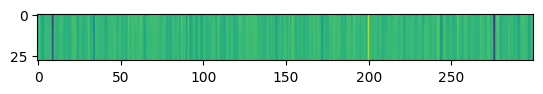

Train Epoch: 50 [1600/2360 (68%)]	 KLD Loss: 0.000099 	 NLL Loss: 8651.220703


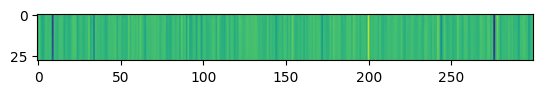

Train Epoch: 50 [1800/2360 (76%)]	 KLD Loss: 0.000043 	 NLL Loss: 8644.259766


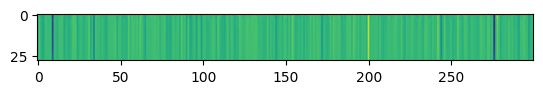

Train Epoch: 50 [2000/2360 (85%)]	 KLD Loss: 0.000070 	 NLL Loss: 8644.370117


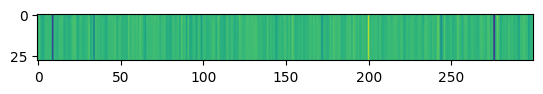

Train Epoch: 50 [2200/2360 (93%)]	 KLD Loss: 0.001047 	 NLL Loss: 8639.791016


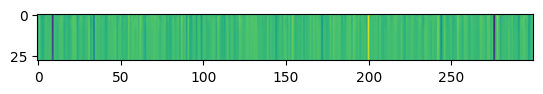

====> Epoch: 50 Average loss: 9243.1196
====> Test set loss: KLD Loss = 0.0057, NLL Loss = 8602.2143 
Train Epoch: 51 [0/2360 (0%)]	 KLD Loss: 0.005667 	 NLL Loss: 8644.618164


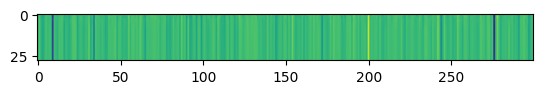

Train Epoch: 51 [200/2360 (8%)]	 KLD Loss: 0.001765 	 NLL Loss: 8646.447266


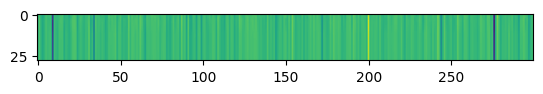

Train Epoch: 51 [400/2360 (17%)]	 KLD Loss: 0.000633 	 NLL Loss: 8646.219727


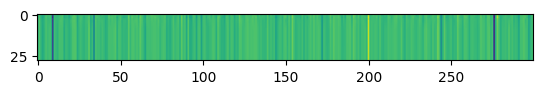

Train Epoch: 51 [600/2360 (25%)]	 KLD Loss: 0.000676 	 NLL Loss: 8595.876953


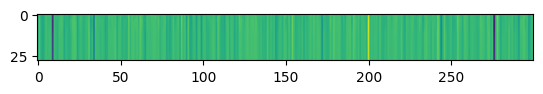

Train Epoch: 51 [800/2360 (34%)]	 KLD Loss: 0.000559 	 NLL Loss: 8643.326172


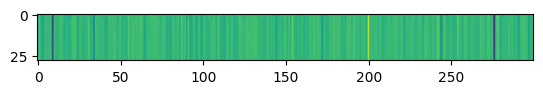

Train Epoch: 51 [1000/2360 (42%)]	 KLD Loss: 0.000305 	 NLL Loss: 8646.224609


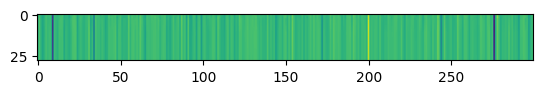

Train Epoch: 51 [1200/2360 (51%)]	 KLD Loss: 0.000929 	 NLL Loss: 8639.150391


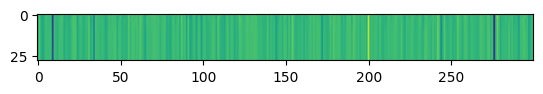

Train Epoch: 51 [1400/2360 (59%)]	 KLD Loss: 0.000230 	 NLL Loss: 8644.362305


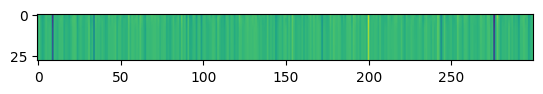

Train Epoch: 51 [1600/2360 (68%)]	 KLD Loss: 0.000228 	 NLL Loss: 8651.205078


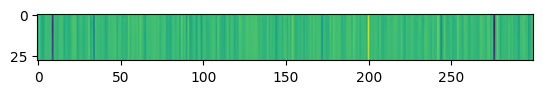

Train Epoch: 51 [1800/2360 (76%)]	 KLD Loss: 0.000054 	 NLL Loss: 8644.212891


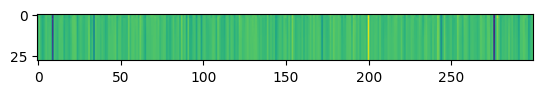

Train Epoch: 51 [2000/2360 (85%)]	 KLD Loss: 0.000323 	 NLL Loss: 8644.424805


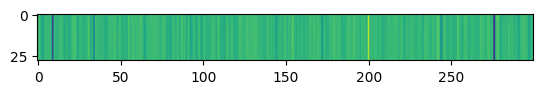

Train Epoch: 51 [2200/2360 (93%)]	 KLD Loss: 0.001142 	 NLL Loss: 8639.820312


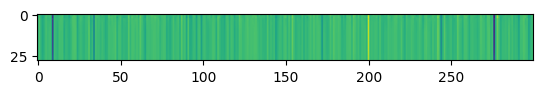

====> Epoch: 51 Average loss: 9243.0995
====> Test set loss: KLD Loss = 0.0010, NLL Loss = 8602.2361 
Train Epoch: 52 [0/2360 (0%)]	 KLD Loss: 0.001044 	 NLL Loss: 8644.713867


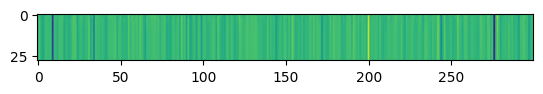

Train Epoch: 52 [200/2360 (8%)]	 KLD Loss: 0.000350 	 NLL Loss: 8646.747070


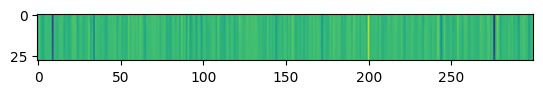

Train Epoch: 52 [400/2360 (17%)]	 KLD Loss: 0.000150 	 NLL Loss: 8646.298828


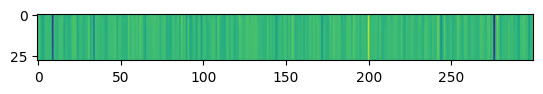

Train Epoch: 52 [600/2360 (25%)]	 KLD Loss: 0.000153 	 NLL Loss: 8595.940430


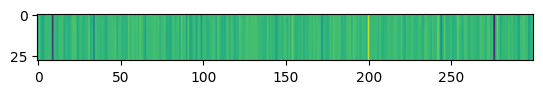

Train Epoch: 52 [800/2360 (34%)]	 KLD Loss: 0.000119 	 NLL Loss: 8643.228516


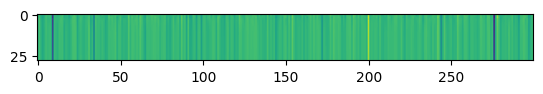

Train Epoch: 52 [1000/2360 (42%)]	 KLD Loss: 0.000050 	 NLL Loss: 8646.341797


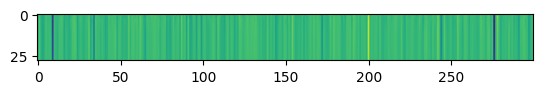

Train Epoch: 52 [1200/2360 (51%)]	 KLD Loss: 0.000445 	 NLL Loss: 8639.056641


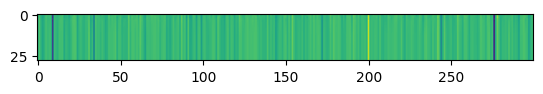

Train Epoch: 52 [1400/2360 (59%)]	 KLD Loss: 0.000048 	 NLL Loss: 8644.099609


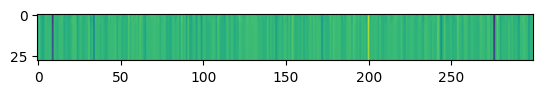

Train Epoch: 52 [1600/2360 (68%)]	 KLD Loss: 0.000250 	 NLL Loss: 8651.217773


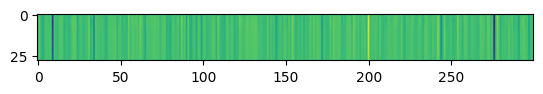

Train Epoch: 52 [1800/2360 (76%)]	 KLD Loss: 0.000036 	 NLL Loss: 8644.314453


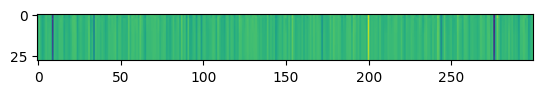

Train Epoch: 52 [2000/2360 (85%)]	 KLD Loss: 0.000035 	 NLL Loss: 8644.397461


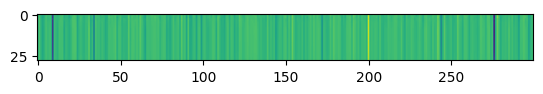

Train Epoch: 52 [2200/2360 (93%)]	 KLD Loss: 0.000130 	 NLL Loss: 8639.753906


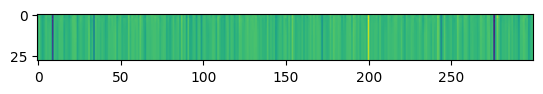

====> Epoch: 52 Average loss: 9243.1194
====> Test set loss: KLD Loss = 0.0004, NLL Loss = 8602.2342 
Train Epoch: 53 [0/2360 (0%)]	 KLD Loss: 0.000393 	 NLL Loss: 8644.806641


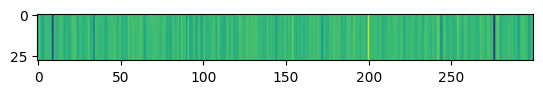

Train Epoch: 53 [200/2360 (8%)]	 KLD Loss: 0.000283 	 NLL Loss: 8646.539062


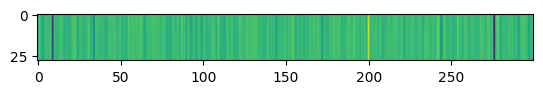

Train Epoch: 53 [400/2360 (17%)]	 KLD Loss: 0.000135 	 NLL Loss: 8646.239258


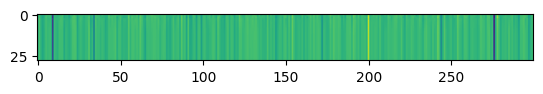

Train Epoch: 53 [600/2360 (25%)]	 KLD Loss: 0.000108 	 NLL Loss: 8595.958984


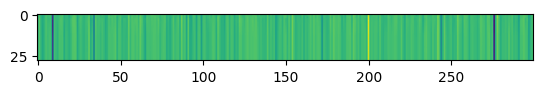

Train Epoch: 53 [800/2360 (34%)]	 KLD Loss: 0.000034 	 NLL Loss: 8643.244141


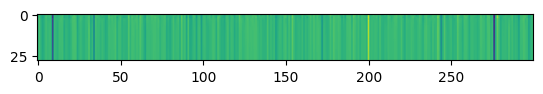

Train Epoch: 53 [1000/2360 (42%)]	 KLD Loss: 0.000022 	 NLL Loss: 8646.314453


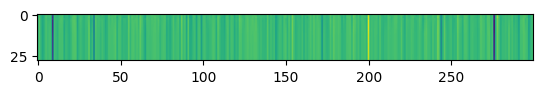

Train Epoch: 53 [1200/2360 (51%)]	 KLD Loss: 0.000452 	 NLL Loss: 8639.133789


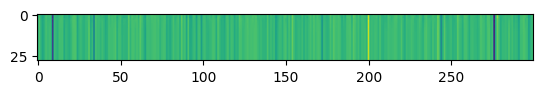

Train Epoch: 53 [1400/2360 (59%)]	 KLD Loss: 0.000024 	 NLL Loss: 8644.041016


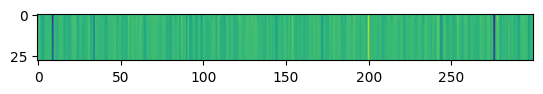

Train Epoch: 53 [1600/2360 (68%)]	 KLD Loss: 0.000089 	 NLL Loss: 8651.283203


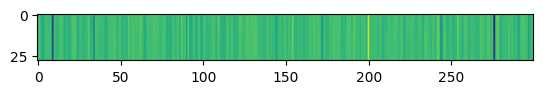

Train Epoch: 53 [1800/2360 (76%)]	 KLD Loss: 0.000040 	 NLL Loss: 8644.320312


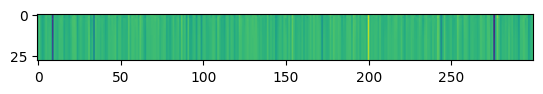

Train Epoch: 53 [2000/2360 (85%)]	 KLD Loss: 0.000065 	 NLL Loss: 8644.380859


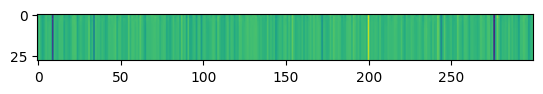

Train Epoch: 53 [2200/2360 (93%)]	 KLD Loss: 0.000055 	 NLL Loss: 8639.841797


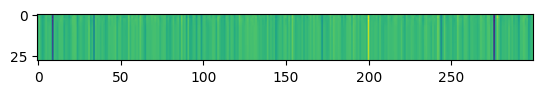

====> Epoch: 53 Average loss: 9243.1069
====> Test set loss: KLD Loss = 0.0011, NLL Loss = 8602.2687 
Train Epoch: 54 [0/2360 (0%)]	 KLD Loss: 0.001149 	 NLL Loss: 8644.733398


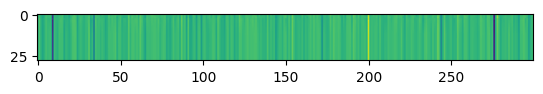

Train Epoch: 54 [200/2360 (8%)]	 KLD Loss: 0.001389 	 NLL Loss: 8646.539062


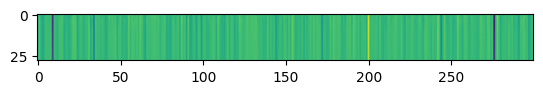

Train Epoch: 54 [400/2360 (17%)]	 KLD Loss: 0.000699 	 NLL Loss: 8646.357422


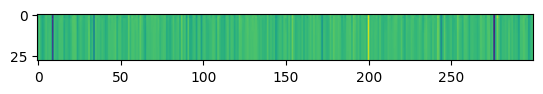

Train Epoch: 54 [600/2360 (25%)]	 KLD Loss: 0.000093 	 NLL Loss: 8595.869141


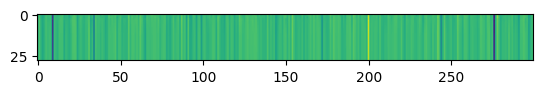

Train Epoch: 54 [800/2360 (34%)]	 KLD Loss: 0.000173 	 NLL Loss: 8643.200195


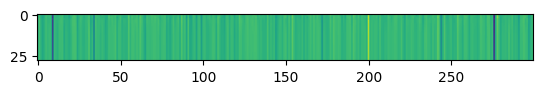

Train Epoch: 54 [1000/2360 (42%)]	 KLD Loss: 0.000065 	 NLL Loss: 8646.291016


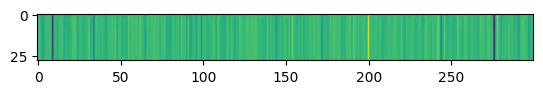

Train Epoch: 54 [1200/2360 (51%)]	 KLD Loss: 0.000648 	 NLL Loss: 8639.109375


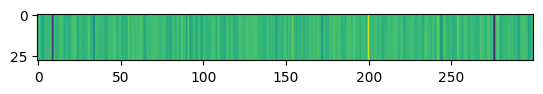

Train Epoch: 54 [1400/2360 (59%)]	 KLD Loss: 0.000153 	 NLL Loss: 8644.084961


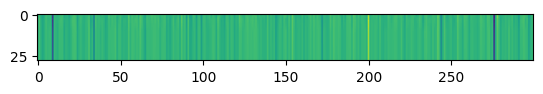

Train Epoch: 54 [1600/2360 (68%)]	 KLD Loss: 0.000198 	 NLL Loss: 8651.232422


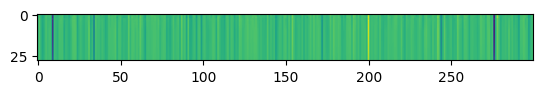

Train Epoch: 54 [1800/2360 (76%)]	 KLD Loss: 0.000082 	 NLL Loss: 8644.272461


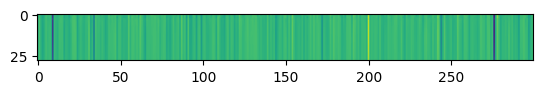

Train Epoch: 54 [2000/2360 (85%)]	 KLD Loss: 0.000316 	 NLL Loss: 8644.296875


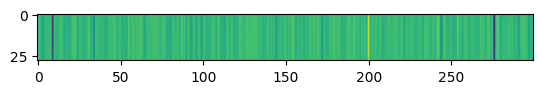

Train Epoch: 54 [2200/2360 (93%)]	 KLD Loss: 0.000205 	 NLL Loss: 8639.771484


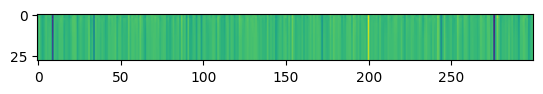

====> Epoch: 54 Average loss: 9243.0992
====> Test set loss: KLD Loss = 0.0012, NLL Loss = 8602.2661 
Train Epoch: 55 [0/2360 (0%)]	 KLD Loss: 0.001174 	 NLL Loss: 8644.752930


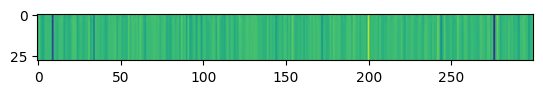

Train Epoch: 55 [200/2360 (8%)]	 KLD Loss: 0.000508 	 NLL Loss: 8646.552734


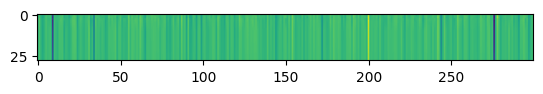

Train Epoch: 55 [400/2360 (17%)]	 KLD Loss: 0.000187 	 NLL Loss: 8646.241211


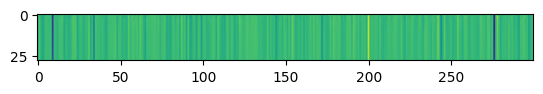

Train Epoch: 55 [600/2360 (25%)]	 KLD Loss: 0.000080 	 NLL Loss: 8595.830078


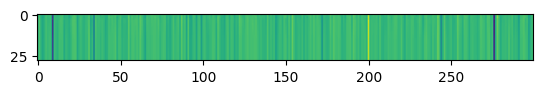

Train Epoch: 55 [800/2360 (34%)]	 KLD Loss: 0.000133 	 NLL Loss: 8643.271484


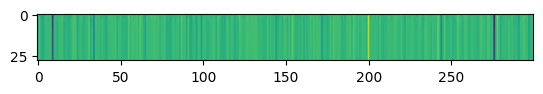

Train Epoch: 55 [1000/2360 (42%)]	 KLD Loss: 0.000098 	 NLL Loss: 8646.273438


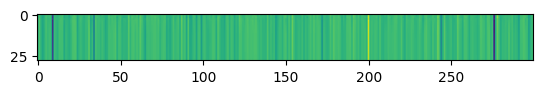

Train Epoch: 55 [1200/2360 (51%)]	 KLD Loss: 0.000618 	 NLL Loss: 8639.072266


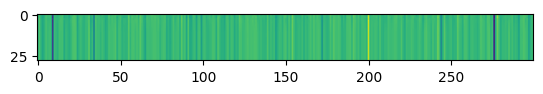

Train Epoch: 55 [1400/2360 (59%)]	 KLD Loss: 0.000034 	 NLL Loss: 8644.161133


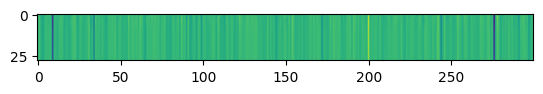

Train Epoch: 55 [1600/2360 (68%)]	 KLD Loss: 0.000070 	 NLL Loss: 8651.177734


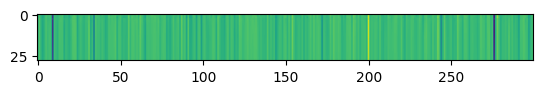

Train Epoch: 55 [1800/2360 (76%)]	 KLD Loss: 0.000153 	 NLL Loss: 8644.226562


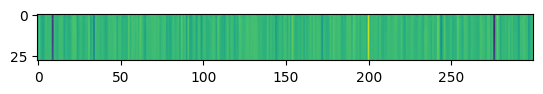

Train Epoch: 55 [2000/2360 (85%)]	 KLD Loss: 0.000228 	 NLL Loss: 8644.329102


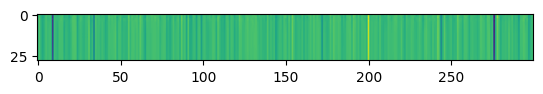

Train Epoch: 55 [2200/2360 (93%)]	 KLD Loss: 0.000300 	 NLL Loss: 8639.810547


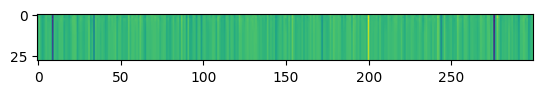

====> Epoch: 55 Average loss: 9243.0931
====> Test set loss: KLD Loss = 0.0007, NLL Loss = 8602.2584 
Train Epoch: 56 [0/2360 (0%)]	 KLD Loss: 0.000733 	 NLL Loss: 8644.712891


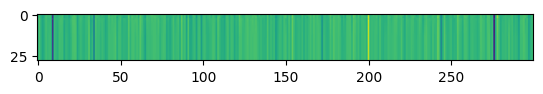

Train Epoch: 56 [200/2360 (8%)]	 KLD Loss: 0.000401 	 NLL Loss: 8646.597656


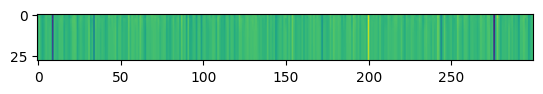

Train Epoch: 56 [400/2360 (17%)]	 KLD Loss: 0.000119 	 NLL Loss: 8646.307617


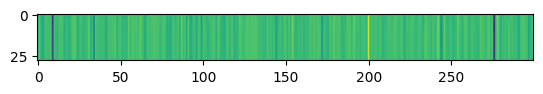

Train Epoch: 56 [600/2360 (25%)]	 KLD Loss: 0.000133 	 NLL Loss: 8595.943359


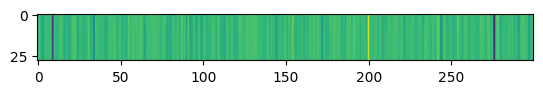

Train Epoch: 56 [800/2360 (34%)]	 KLD Loss: 0.000075 	 NLL Loss: 8643.255859


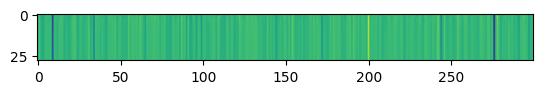

Train Epoch: 56 [1000/2360 (42%)]	 KLD Loss: 0.000098 	 NLL Loss: 8646.295898


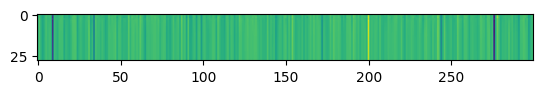

Train Epoch: 56 [1200/2360 (51%)]	 KLD Loss: 0.000245 	 NLL Loss: 8639.107422


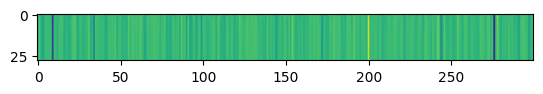

Train Epoch: 56 [1400/2360 (59%)]	 KLD Loss: 0.000170 	 NLL Loss: 8644.239258


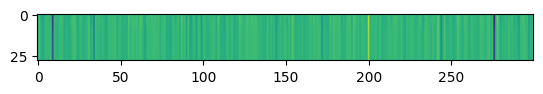

Train Epoch: 56 [1600/2360 (68%)]	 KLD Loss: 0.000240 	 NLL Loss: 8651.203125


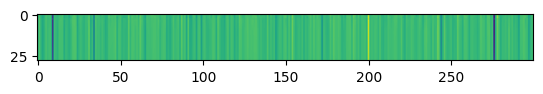

Train Epoch: 56 [1800/2360 (76%)]	 KLD Loss: 0.000208 	 NLL Loss: 8644.232422


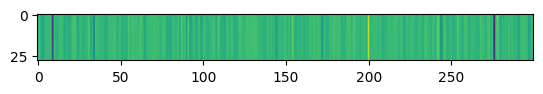

Train Epoch: 56 [2000/2360 (85%)]	 KLD Loss: 0.000183 	 NLL Loss: 8644.250000


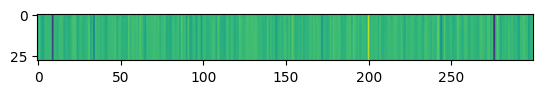

Train Epoch: 56 [2200/2360 (93%)]	 KLD Loss: 0.000185 	 NLL Loss: 8639.803711


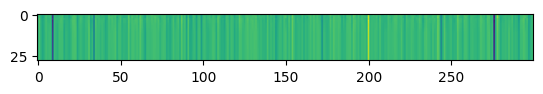

====> Epoch: 56 Average loss: 9243.1169
====> Test set loss: KLD Loss = 0.0011, NLL Loss = 8602.2115 
Train Epoch: 57 [0/2360 (0%)]	 KLD Loss: 0.001109 	 NLL Loss: 8644.669922


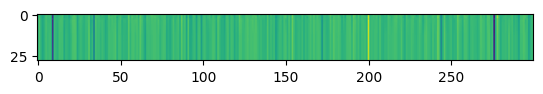

Train Epoch: 57 [200/2360 (8%)]	 KLD Loss: 0.000215 	 NLL Loss: 8646.525391


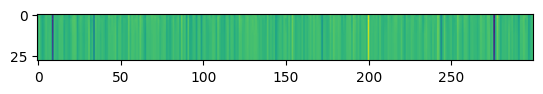

Train Epoch: 57 [400/2360 (17%)]	 KLD Loss: 0.000318 	 NLL Loss: 8646.199219


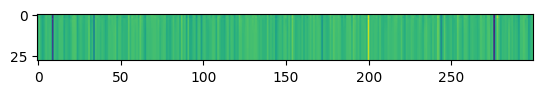

Train Epoch: 57 [600/2360 (25%)]	 KLD Loss: 0.000165 	 NLL Loss: 8595.960938


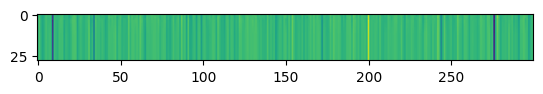

Train Epoch: 57 [800/2360 (34%)]	 KLD Loss: 0.000864 	 NLL Loss: 8643.298828


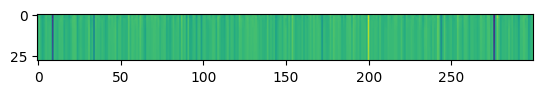

Train Epoch: 57 [1000/2360 (42%)]	 KLD Loss: 0.000271 	 NLL Loss: 8646.293945


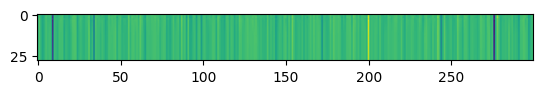

Train Epoch: 57 [1200/2360 (51%)]	 KLD Loss: 0.001529 	 NLL Loss: 8639.146484


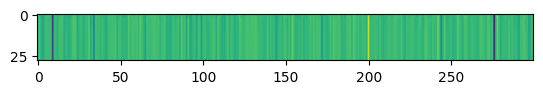

Train Epoch: 57 [1400/2360 (59%)]	 KLD Loss: 0.000388 	 NLL Loss: 8645.960938


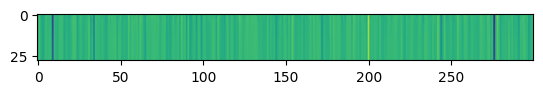

Train Epoch: 57 [1600/2360 (68%)]	 KLD Loss: 0.000990 	 NLL Loss: 8650.425781


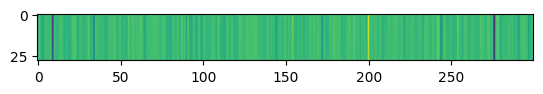

Train Epoch: 57 [1800/2360 (76%)]	 KLD Loss: 0.000481 	 NLL Loss: 8644.347656


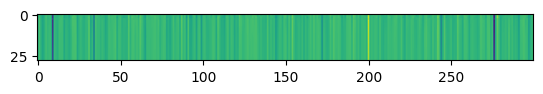

Train Epoch: 57 [2000/2360 (85%)]	 KLD Loss: 0.000228 	 NLL Loss: 8644.357422


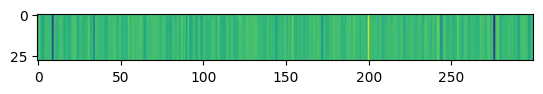

Train Epoch: 57 [2200/2360 (93%)]	 KLD Loss: 0.000706 	 NLL Loss: 8639.808594


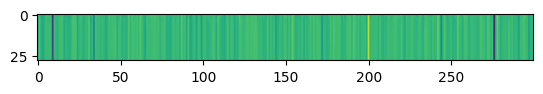

====> Epoch: 57 Average loss: 9243.1490
====> Test set loss: KLD Loss = 0.0010, NLL Loss = 8602.1095 
Train Epoch: 58 [0/2360 (0%)]	 KLD Loss: 0.000996 	 NLL Loss: 8644.743164


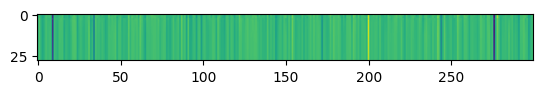

Train Epoch: 58 [200/2360 (8%)]	 KLD Loss: 0.000465 	 NLL Loss: 8646.591797


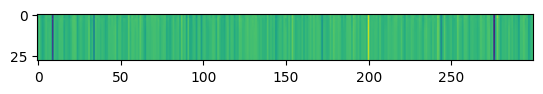

Train Epoch: 58 [400/2360 (17%)]	 KLD Loss: 0.000256 	 NLL Loss: 8646.230469


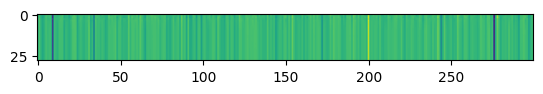

Train Epoch: 58 [600/2360 (25%)]	 KLD Loss: 0.000513 	 NLL Loss: 8595.885742


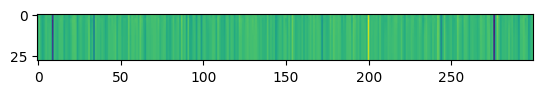

Train Epoch: 58 [800/2360 (34%)]	 KLD Loss: 0.000205 	 NLL Loss: 8643.232422


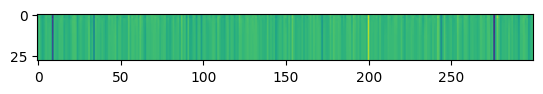

Train Epoch: 58 [1000/2360 (42%)]	 KLD Loss: 0.000067 	 NLL Loss: 8646.329102


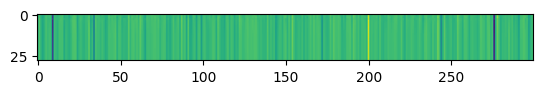

Train Epoch: 58 [1200/2360 (51%)]	 KLD Loss: 0.003267 	 NLL Loss: 8639.153320


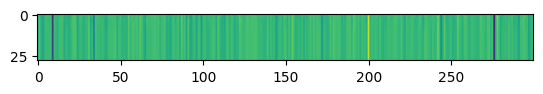

Train Epoch: 58 [1400/2360 (59%)]	 KLD Loss: 0.000448 	 NLL Loss: 8644.157227


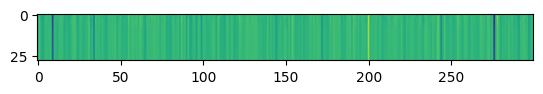

Train Epoch: 58 [1600/2360 (68%)]	 KLD Loss: 0.001484 	 NLL Loss: 8651.271484


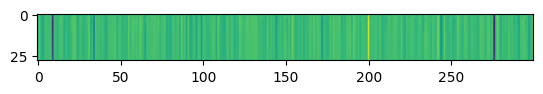

Train Epoch: 58 [1800/2360 (76%)]	 KLD Loss: 0.000598 	 NLL Loss: 8644.378906


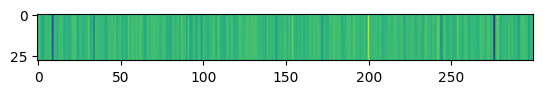

Train Epoch: 58 [2000/2360 (85%)]	 KLD Loss: 0.000115 	 NLL Loss: 8644.281250


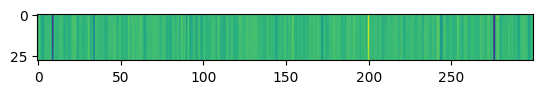

Train Epoch: 58 [2200/2360 (93%)]	 KLD Loss: 0.000283 	 NLL Loss: 8639.782227


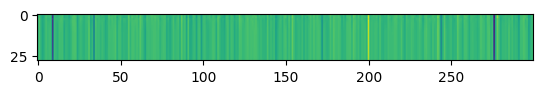

====> Epoch: 58 Average loss: 9243.2126
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2338 
Train Epoch: 59 [0/2360 (0%)]	 KLD Loss: 0.000068 	 NLL Loss: 8644.716797


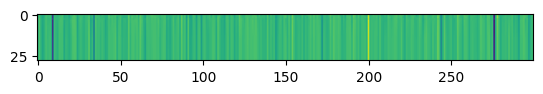

Train Epoch: 59 [200/2360 (8%)]	 KLD Loss: 0.000188 	 NLL Loss: 8646.576172


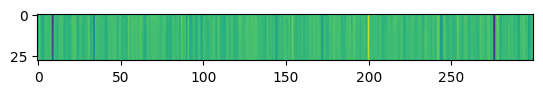

Train Epoch: 59 [400/2360 (17%)]	 KLD Loss: 0.000092 	 NLL Loss: 8646.334961


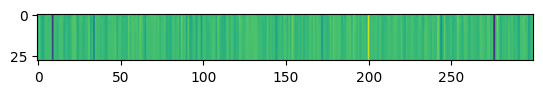

Train Epoch: 59 [600/2360 (25%)]	 KLD Loss: 0.000133 	 NLL Loss: 8595.941406


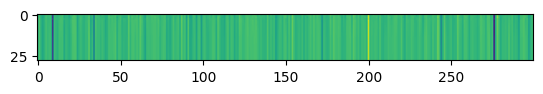

Train Epoch: 59 [800/2360 (34%)]	 KLD Loss: 0.000030 	 NLL Loss: 8643.175781


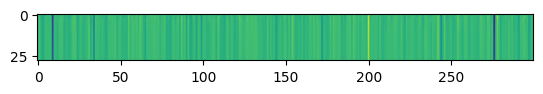

Train Epoch: 59 [1000/2360 (42%)]	 KLD Loss: 0.000015 	 NLL Loss: 8646.271484


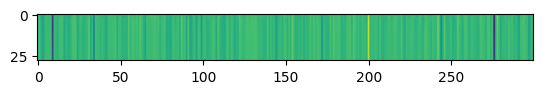

Train Epoch: 59 [1200/2360 (51%)]	 KLD Loss: 0.000280 	 NLL Loss: 8639.082031


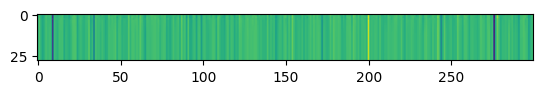

Train Epoch: 59 [1400/2360 (59%)]	 KLD Loss: 0.000072 	 NLL Loss: 8644.111328


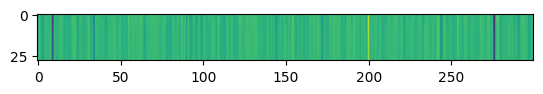

Train Epoch: 59 [1600/2360 (68%)]	 KLD Loss: 0.000035 	 NLL Loss: 8651.178711


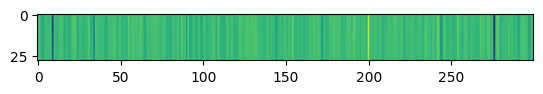

Train Epoch: 59 [1800/2360 (76%)]	 KLD Loss: 0.000011 	 NLL Loss: 8644.273438


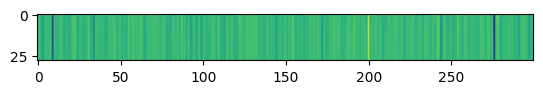

Train Epoch: 59 [2000/2360 (85%)]	 KLD Loss: 0.000028 	 NLL Loss: 8644.322266


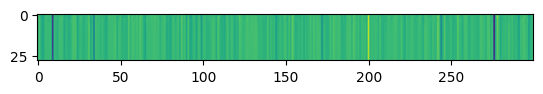

Train Epoch: 59 [2200/2360 (93%)]	 KLD Loss: 0.000094 	 NLL Loss: 8639.768555


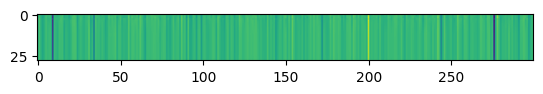

====> Epoch: 59 Average loss: 9243.2022
====> Test set loss: KLD Loss = 0.0000, NLL Loss = 8602.2402 
Train Epoch: 60 [0/2360 (0%)]	 KLD Loss: 0.000034 	 NLL Loss: 8644.726562


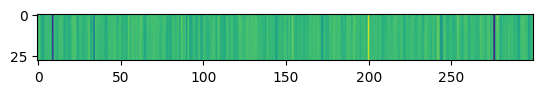

Train Epoch: 60 [200/2360 (8%)]	 KLD Loss: 0.000165 	 NLL Loss: 8646.513672


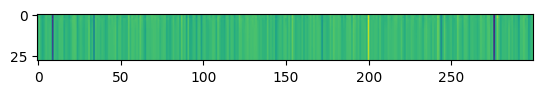

Train Epoch: 60 [400/2360 (17%)]	 KLD Loss: 0.000068 	 NLL Loss: 8646.320312


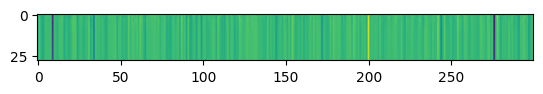

Train Epoch: 60 [600/2360 (25%)]	 KLD Loss: 0.000070 	 NLL Loss: 8595.908203


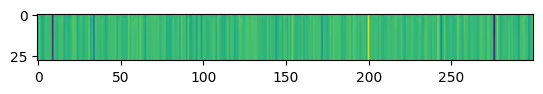

Train Epoch: 60 [800/2360 (34%)]	 KLD Loss: 0.000029 	 NLL Loss: 8643.232422


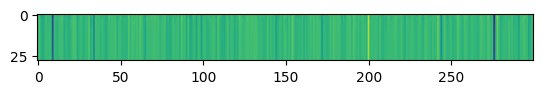

Train Epoch: 60 [1000/2360 (42%)]	 KLD Loss: 0.000005 	 NLL Loss: 8646.302734


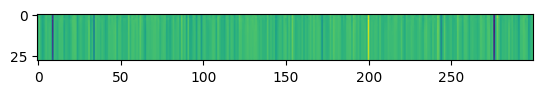

Train Epoch: 60 [1200/2360 (51%)]	 KLD Loss: 0.001302 	 NLL Loss: 8639.120117


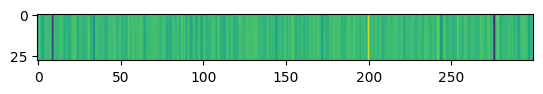

Train Epoch: 60 [1400/2360 (59%)]	 KLD Loss: 0.000346 	 NLL Loss: 8644.214844


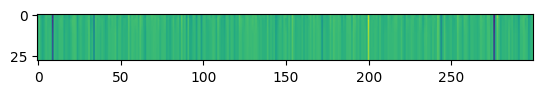

Train Epoch: 60 [1600/2360 (68%)]	 KLD Loss: 0.000095 	 NLL Loss: 8651.193359


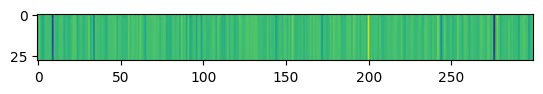

Train Epoch: 60 [1800/2360 (76%)]	 KLD Loss: 0.000058 	 NLL Loss: 8644.249023


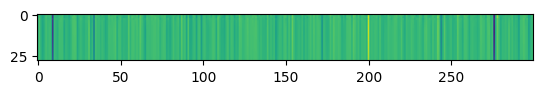

Train Epoch: 60 [2000/2360 (85%)]	 KLD Loss: 0.000163 	 NLL Loss: 8644.272461


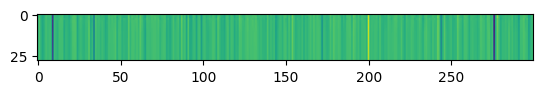

Train Epoch: 60 [2200/2360 (93%)]	 KLD Loss: 0.000077 	 NLL Loss: 8639.847656


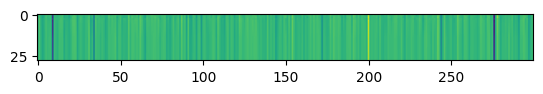

====> Epoch: 60 Average loss: 9243.2008
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2268 
Train Epoch: 61 [0/2360 (0%)]	 KLD Loss: 0.000090 	 NLL Loss: 8644.658203


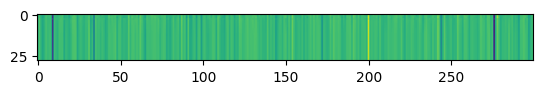

Train Epoch: 61 [200/2360 (8%)]	 KLD Loss: 0.000135 	 NLL Loss: 8646.505859


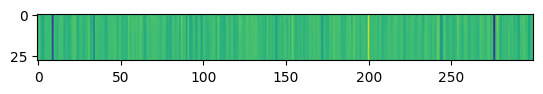

Train Epoch: 61 [400/2360 (17%)]	 KLD Loss: 0.000025 	 NLL Loss: 8646.221680


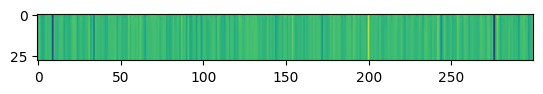

Train Epoch: 61 [600/2360 (25%)]	 KLD Loss: 0.000125 	 NLL Loss: 8595.920898


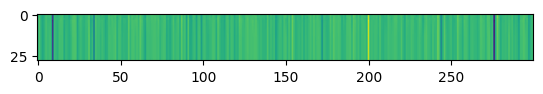

Train Epoch: 61 [800/2360 (34%)]	 KLD Loss: 0.000045 	 NLL Loss: 8643.250977


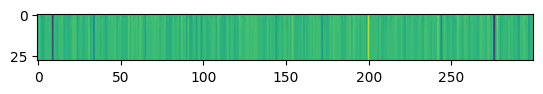

Train Epoch: 61 [1000/2360 (42%)]	 KLD Loss: 0.000023 	 NLL Loss: 8646.292969


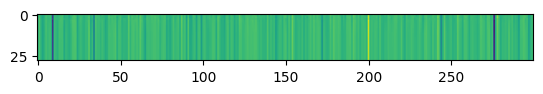

Train Epoch: 61 [1200/2360 (51%)]	 KLD Loss: 0.001400 	 NLL Loss: 8639.113281


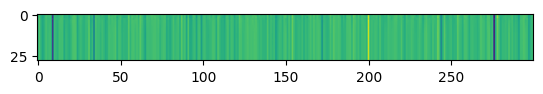

Train Epoch: 61 [1400/2360 (59%)]	 KLD Loss: 0.000806 	 NLL Loss: 8644.207031


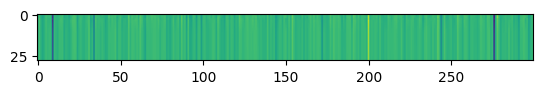

Train Epoch: 61 [1600/2360 (68%)]	 KLD Loss: 0.000238 	 NLL Loss: 8651.168945


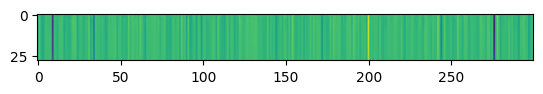

Train Epoch: 61 [1800/2360 (76%)]	 KLD Loss: 0.000495 	 NLL Loss: 8644.263672


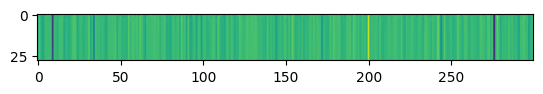

Train Epoch: 61 [2000/2360 (85%)]	 KLD Loss: 0.000621 	 NLL Loss: 8644.310547


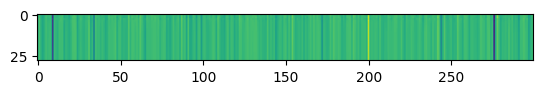

Train Epoch: 61 [2200/2360 (93%)]	 KLD Loss: 0.000437 	 NLL Loss: 8639.821289


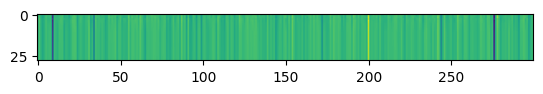

====> Epoch: 61 Average loss: 9243.1876
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2526 
Train Epoch: 62 [0/2360 (0%)]	 KLD Loss: 0.000168 	 NLL Loss: 8644.680664


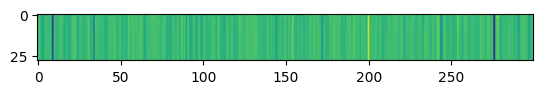

Train Epoch: 62 [200/2360 (8%)]	 KLD Loss: 0.000352 	 NLL Loss: 8646.509766


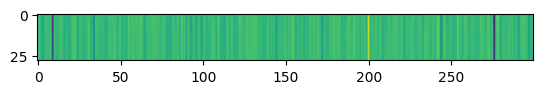

Train Epoch: 62 [400/2360 (17%)]	 KLD Loss: 0.000070 	 NLL Loss: 8646.240234


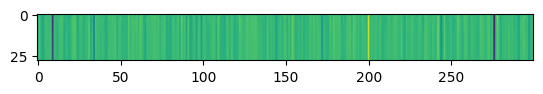

Train Epoch: 62 [600/2360 (25%)]	 KLD Loss: 0.000174 	 NLL Loss: 8595.848633


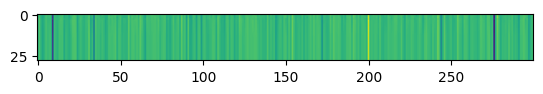

Train Epoch: 62 [800/2360 (34%)]	 KLD Loss: 0.000063 	 NLL Loss: 8643.215820


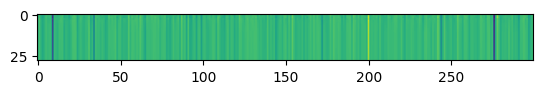

Train Epoch: 62 [1000/2360 (42%)]	 KLD Loss: 0.000155 	 NLL Loss: 8646.280273


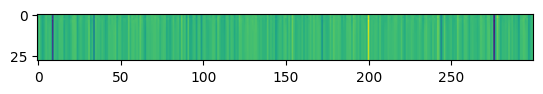

Train Epoch: 62 [1200/2360 (51%)]	 KLD Loss: 0.002568 	 NLL Loss: 8639.154297


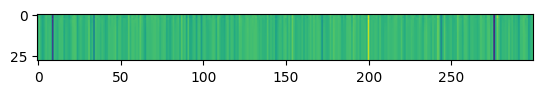

Train Epoch: 62 [1400/2360 (59%)]	 KLD Loss: 0.000558 	 NLL Loss: 8644.129883


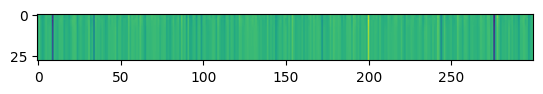

Train Epoch: 62 [1600/2360 (68%)]	 KLD Loss: 0.000371 	 NLL Loss: 8651.222656


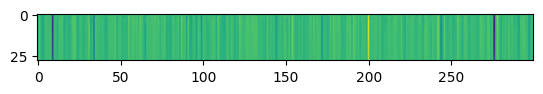

Train Epoch: 62 [1800/2360 (76%)]	 KLD Loss: 0.000108 	 NLL Loss: 8644.296875


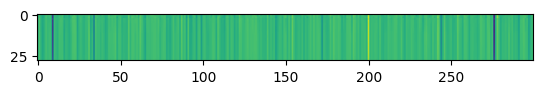

Train Epoch: 62 [2000/2360 (85%)]	 KLD Loss: 0.000238 	 NLL Loss: 8644.316406


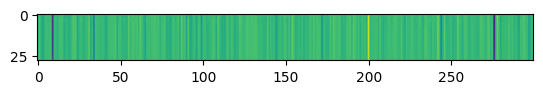

Train Epoch: 62 [2200/2360 (93%)]	 KLD Loss: 0.000210 	 NLL Loss: 8639.802734


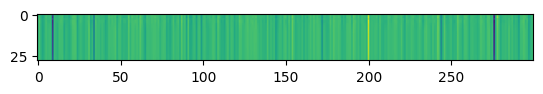

====> Epoch: 62 Average loss: 9243.1900
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.1968 
Train Epoch: 63 [0/2360 (0%)]	 KLD Loss: 0.000190 	 NLL Loss: 8644.683594


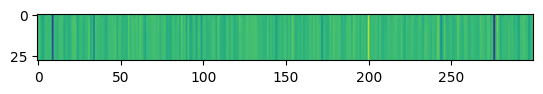

Train Epoch: 63 [200/2360 (8%)]	 KLD Loss: 0.000478 	 NLL Loss: 8646.460938


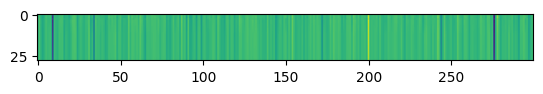

Train Epoch: 63 [400/2360 (17%)]	 KLD Loss: 0.000218 	 NLL Loss: 8646.251953


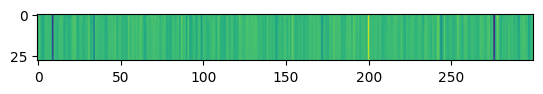

Train Epoch: 63 [600/2360 (25%)]	 KLD Loss: 0.000145 	 NLL Loss: 8595.947266


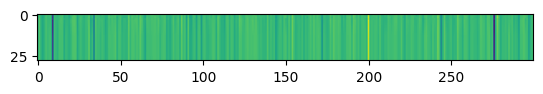

Train Epoch: 63 [800/2360 (34%)]	 KLD Loss: 0.000155 	 NLL Loss: 8643.259766


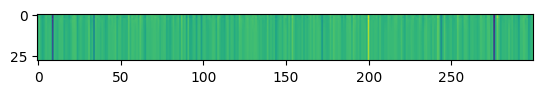

Train Epoch: 63 [1000/2360 (42%)]	 KLD Loss: 0.000083 	 NLL Loss: 8646.287109


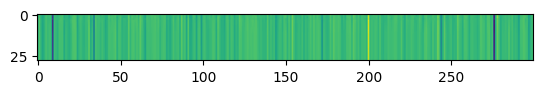

Train Epoch: 63 [1200/2360 (51%)]	 KLD Loss: 0.000709 	 NLL Loss: 8639.150391


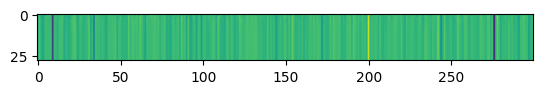

Train Epoch: 63 [1400/2360 (59%)]	 KLD Loss: 0.000586 	 NLL Loss: 8644.172852


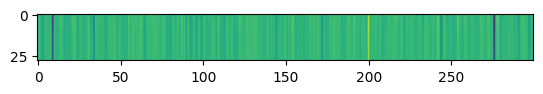

Train Epoch: 63 [1600/2360 (68%)]	 KLD Loss: 0.000183 	 NLL Loss: 8651.162109


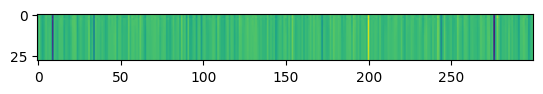

Train Epoch: 63 [1800/2360 (76%)]	 KLD Loss: 0.000098 	 NLL Loss: 8644.250000


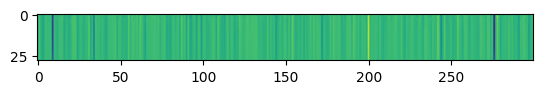

Train Epoch: 63 [2000/2360 (85%)]	 KLD Loss: 0.000599 	 NLL Loss: 8644.342773


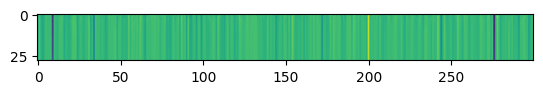

Train Epoch: 63 [2200/2360 (93%)]	 KLD Loss: 0.000688 	 NLL Loss: 8639.806641


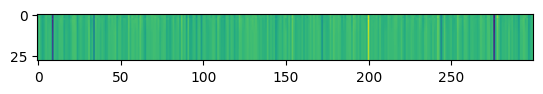

====> Epoch: 63 Average loss: 9243.1504
====> Test set loss: KLD Loss = 0.0003, NLL Loss = 8602.2741 
Train Epoch: 64 [0/2360 (0%)]	 KLD Loss: 0.000271 	 NLL Loss: 8644.681641


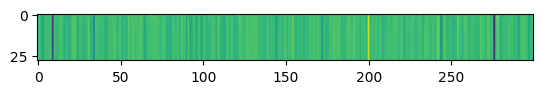

Train Epoch: 64 [200/2360 (8%)]	 KLD Loss: 0.000426 	 NLL Loss: 8646.559570


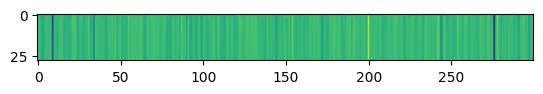

Train Epoch: 64 [400/2360 (17%)]	 KLD Loss: 0.000255 	 NLL Loss: 8646.316406


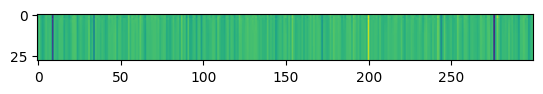

Train Epoch: 64 [600/2360 (25%)]	 KLD Loss: 0.000358 	 NLL Loss: 8595.884766


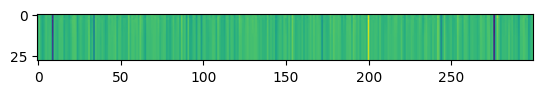

Train Epoch: 64 [800/2360 (34%)]	 KLD Loss: 0.000160 	 NLL Loss: 8643.212891


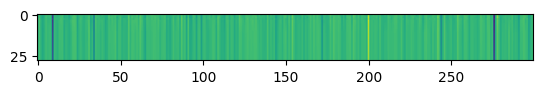

Train Epoch: 64 [1000/2360 (42%)]	 KLD Loss: 0.000125 	 NLL Loss: 8646.315430


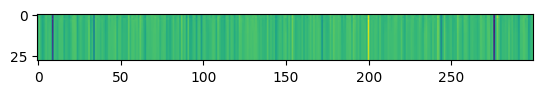

Train Epoch: 64 [1200/2360 (51%)]	 KLD Loss: 0.001464 	 NLL Loss: 8639.034180


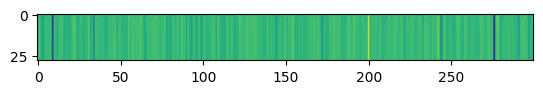

Train Epoch: 64 [1400/2360 (59%)]	 KLD Loss: 0.001467 	 NLL Loss: 8644.246094


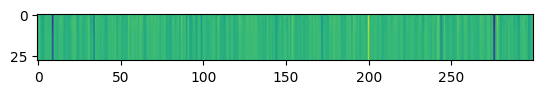

Train Epoch: 64 [1600/2360 (68%)]	 KLD Loss: 0.000416 	 NLL Loss: 8651.111328


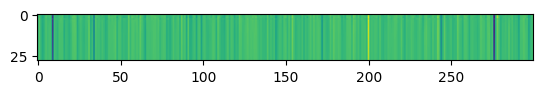

Train Epoch: 64 [1800/2360 (76%)]	 KLD Loss: 0.000141 	 NLL Loss: 8644.312500


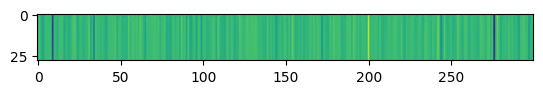

Train Epoch: 64 [2000/2360 (85%)]	 KLD Loss: 0.000278 	 NLL Loss: 8644.293945


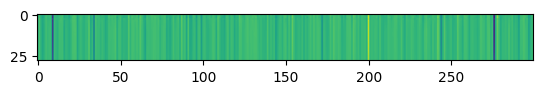

Train Epoch: 64 [2200/2360 (93%)]	 KLD Loss: 0.000193 	 NLL Loss: 8639.806641


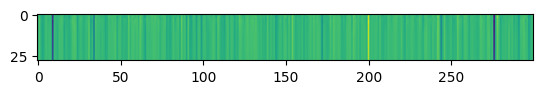

====> Epoch: 64 Average loss: 9243.1683
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2057 
Train Epoch: 65 [0/2360 (0%)]	 KLD Loss: 0.000223 	 NLL Loss: 8644.678711


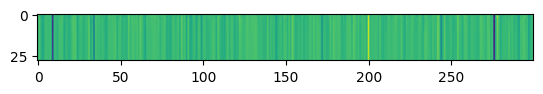

Train Epoch: 65 [200/2360 (8%)]	 KLD Loss: 0.000313 	 NLL Loss: 8646.451172


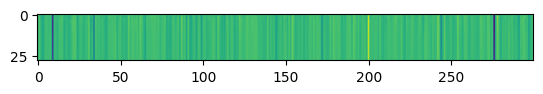

Train Epoch: 65 [400/2360 (17%)]	 KLD Loss: 0.000080 	 NLL Loss: 8646.250000


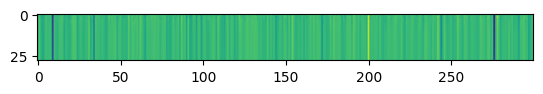

Train Epoch: 65 [600/2360 (25%)]	 KLD Loss: 0.000138 	 NLL Loss: 8595.994141


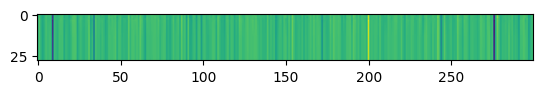

Train Epoch: 65 [800/2360 (34%)]	 KLD Loss: 0.000030 	 NLL Loss: 8643.232422


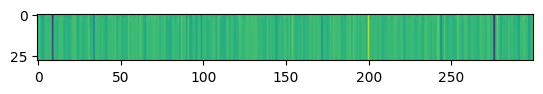

Train Epoch: 65 [1000/2360 (42%)]	 KLD Loss: 0.000046 	 NLL Loss: 8646.252930


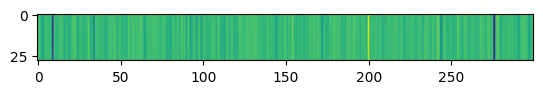

Train Epoch: 65 [1200/2360 (51%)]	 KLD Loss: 0.001064 	 NLL Loss: 8639.106445


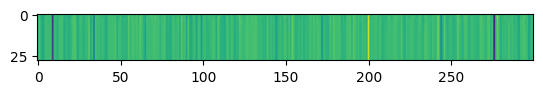

Train Epoch: 65 [1400/2360 (59%)]	 KLD Loss: 0.000899 	 NLL Loss: 8644.247070


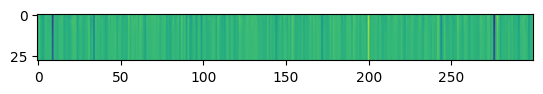

Train Epoch: 65 [1600/2360 (68%)]	 KLD Loss: 0.000175 	 NLL Loss: 8651.205078


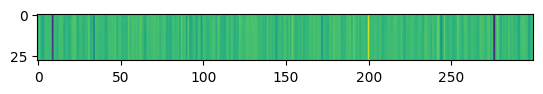

Train Epoch: 65 [1800/2360 (76%)]	 KLD Loss: 0.000225 	 NLL Loss: 8644.268555


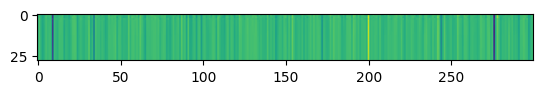

Train Epoch: 65 [2000/2360 (85%)]	 KLD Loss: 0.000315 	 NLL Loss: 8644.275391


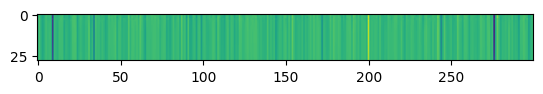

Train Epoch: 65 [2200/2360 (93%)]	 KLD Loss: 0.000203 	 NLL Loss: 8639.775391


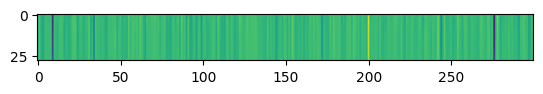

====> Epoch: 65 Average loss: 9243.1517
====> Test set loss: KLD Loss = 0.0005, NLL Loss = 8602.2649 
Train Epoch: 66 [0/2360 (0%)]	 KLD Loss: 0.000466 	 NLL Loss: 8644.717773


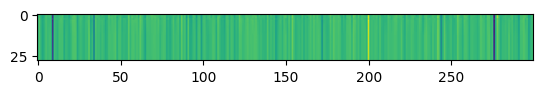

Train Epoch: 66 [200/2360 (8%)]	 KLD Loss: 0.000303 	 NLL Loss: 8646.575195


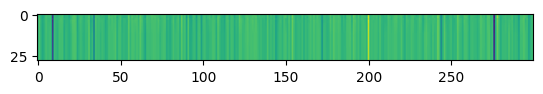

Train Epoch: 66 [400/2360 (17%)]	 KLD Loss: 0.000153 	 NLL Loss: 8646.308594


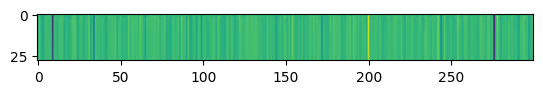

Train Epoch: 66 [600/2360 (25%)]	 KLD Loss: 0.000070 	 NLL Loss: 8595.967773


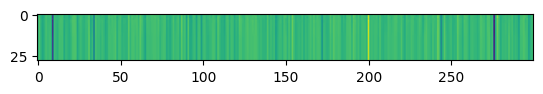

Train Epoch: 66 [800/2360 (34%)]	 KLD Loss: 0.000055 	 NLL Loss: 8643.211914


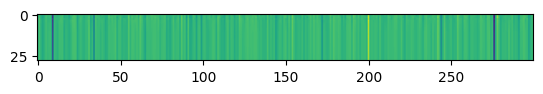

Train Epoch: 66 [1000/2360 (42%)]	 KLD Loss: 0.000030 	 NLL Loss: 8646.319336


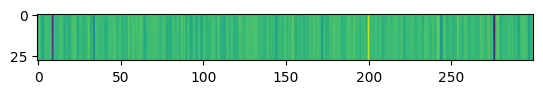

Train Epoch: 66 [1200/2360 (51%)]	 KLD Loss: 0.000183 	 NLL Loss: 8639.541992


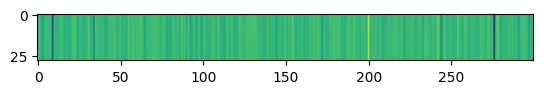

Train Epoch: 66 [1400/2360 (59%)]	 KLD Loss: 0.000673 	 NLL Loss: 8643.834961


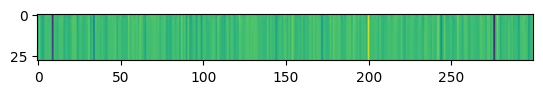

Train Epoch: 66 [1600/2360 (68%)]	 KLD Loss: 0.000197 	 NLL Loss: 8651.117188


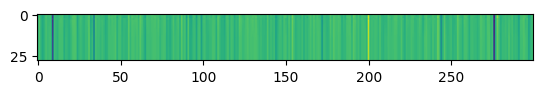

Train Epoch: 66 [1800/2360 (76%)]	 KLD Loss: 0.000463 	 NLL Loss: 8643.861328


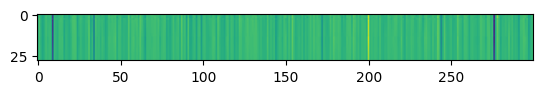

Train Epoch: 66 [2000/2360 (85%)]	 KLD Loss: 0.000263 	 NLL Loss: 8644.518555


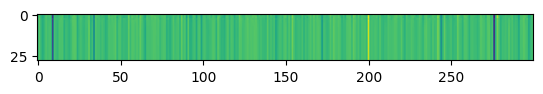

Train Epoch: 66 [2200/2360 (93%)]	 KLD Loss: 0.000155 	 NLL Loss: 8639.911133


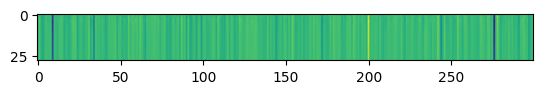

====> Epoch: 66 Average loss: 9243.2029
====> Test set loss: KLD Loss = 0.0005, NLL Loss = 8602.2058 
Train Epoch: 67 [0/2360 (0%)]	 KLD Loss: 0.000533 	 NLL Loss: 8644.842773


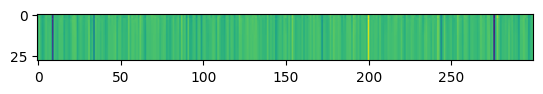

Train Epoch: 67 [200/2360 (8%)]	 KLD Loss: 0.000458 	 NLL Loss: 8646.380859


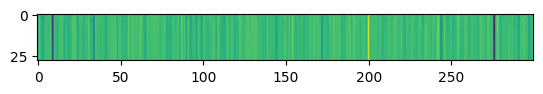

Train Epoch: 67 [400/2360 (17%)]	 KLD Loss: 0.000203 	 NLL Loss: 8646.216797


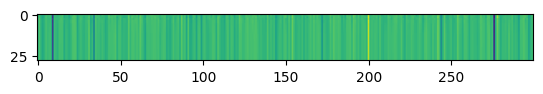

Train Epoch: 67 [600/2360 (25%)]	 KLD Loss: 0.000164 	 NLL Loss: 8595.946289


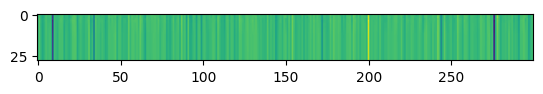

Train Epoch: 67 [800/2360 (34%)]	 KLD Loss: 0.000068 	 NLL Loss: 8643.259766


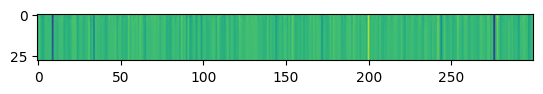

Train Epoch: 67 [1000/2360 (42%)]	 KLD Loss: 0.000098 	 NLL Loss: 8646.314453


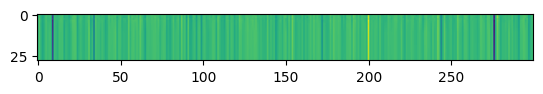

Train Epoch: 67 [1200/2360 (51%)]	 KLD Loss: 0.000814 	 NLL Loss: 8639.121094


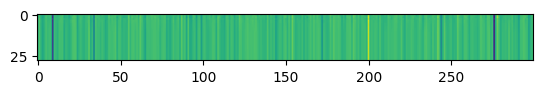

Train Epoch: 67 [1400/2360 (59%)]	 KLD Loss: 0.001114 	 NLL Loss: 8644.243164


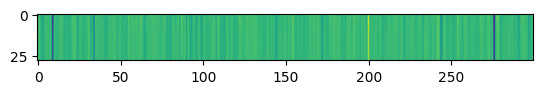

Train Epoch: 67 [1600/2360 (68%)]	 KLD Loss: 0.000408 	 NLL Loss: 8651.207031


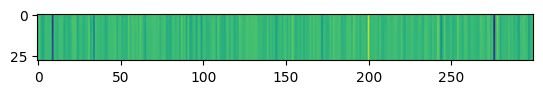

Train Epoch: 67 [1800/2360 (76%)]	 KLD Loss: 0.000443 	 NLL Loss: 8644.276367


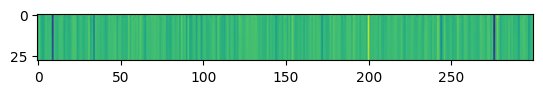

Train Epoch: 67 [2000/2360 (85%)]	 KLD Loss: 0.000536 	 NLL Loss: 8644.248047


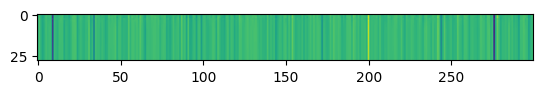

Train Epoch: 67 [2200/2360 (93%)]	 KLD Loss: 0.000407 	 NLL Loss: 8639.765625


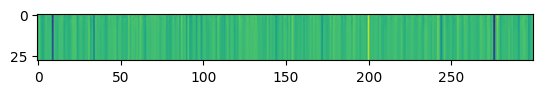

====> Epoch: 67 Average loss: 9243.1751
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2120 
Train Epoch: 68 [0/2360 (0%)]	 KLD Loss: 0.000228 	 NLL Loss: 8644.734375


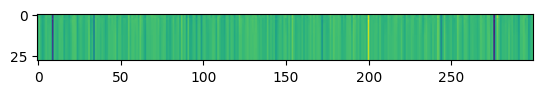

Train Epoch: 68 [200/2360 (8%)]	 KLD Loss: 0.000558 	 NLL Loss: 8646.548828


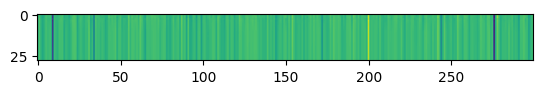

Train Epoch: 68 [400/2360 (17%)]	 KLD Loss: 0.000288 	 NLL Loss: 8646.293945


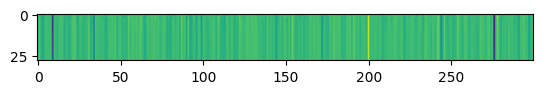

Train Epoch: 68 [600/2360 (25%)]	 KLD Loss: 0.000110 	 NLL Loss: 8595.881836


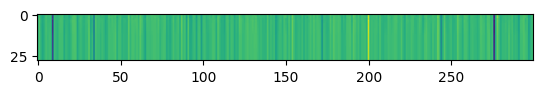

Train Epoch: 68 [800/2360 (34%)]	 KLD Loss: 0.000058 	 NLL Loss: 8643.267578


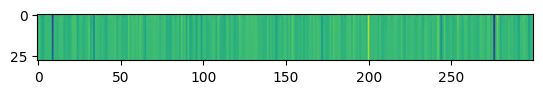

Train Epoch: 68 [1000/2360 (42%)]	 KLD Loss: 0.000080 	 NLL Loss: 8646.296875


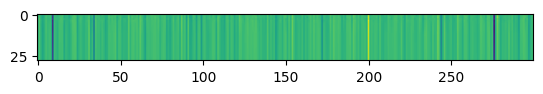

Train Epoch: 68 [1200/2360 (51%)]	 KLD Loss: 0.000401 	 NLL Loss: 8639.069336


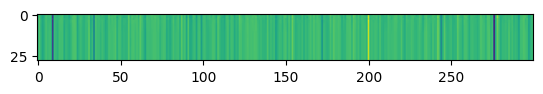

Train Epoch: 68 [1400/2360 (59%)]	 KLD Loss: 0.001474 	 NLL Loss: 8644.192383


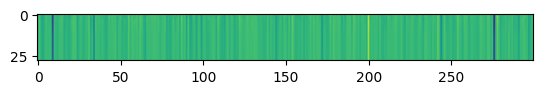

Train Epoch: 68 [1600/2360 (68%)]	 KLD Loss: 0.000581 	 NLL Loss: 8651.225586


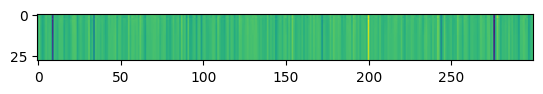

Train Epoch: 68 [1800/2360 (76%)]	 KLD Loss: 0.000158 	 NLL Loss: 8644.313477


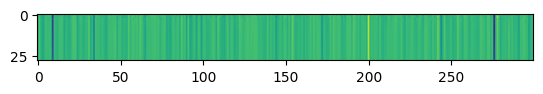

Train Epoch: 68 [2000/2360 (85%)]	 KLD Loss: 0.000503 	 NLL Loss: 8644.225586


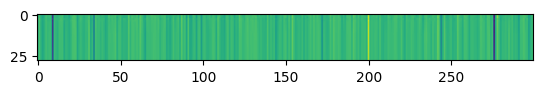

Train Epoch: 68 [2200/2360 (93%)]	 KLD Loss: 0.000398 	 NLL Loss: 8639.791992


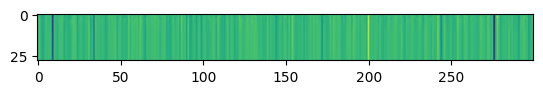

====> Epoch: 68 Average loss: 9243.1639
====> Test set loss: KLD Loss = 0.0008, NLL Loss = 8602.2378 
Train Epoch: 69 [0/2360 (0%)]	 KLD Loss: 0.000766 	 NLL Loss: 8644.679688


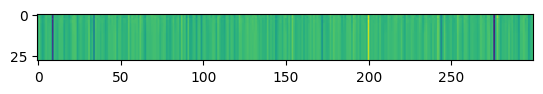

Train Epoch: 69 [200/2360 (8%)]	 KLD Loss: 0.000979 	 NLL Loss: 8646.551758


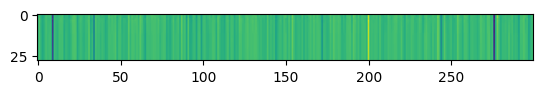

Train Epoch: 69 [400/2360 (17%)]	 KLD Loss: 0.000113 	 NLL Loss: 8646.297852


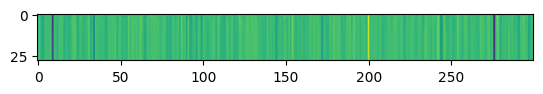

Train Epoch: 69 [600/2360 (25%)]	 KLD Loss: 0.000368 	 NLL Loss: 8595.892578


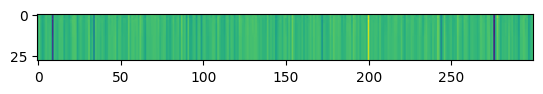

Train Epoch: 69 [800/2360 (34%)]	 KLD Loss: 0.000150 	 NLL Loss: 8643.205078


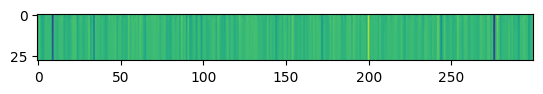

Train Epoch: 69 [1000/2360 (42%)]	 KLD Loss: 0.000237 	 NLL Loss: 8646.311523


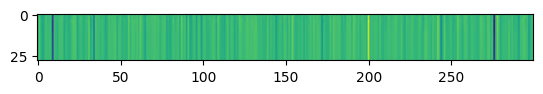

Train Epoch: 69 [1200/2360 (51%)]	 KLD Loss: 0.001157 	 NLL Loss: 8639.103516


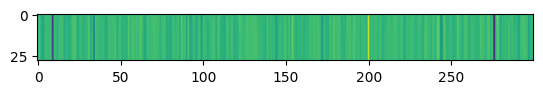

Train Epoch: 69 [1400/2360 (59%)]	 KLD Loss: 0.000526 	 NLL Loss: 8644.171875


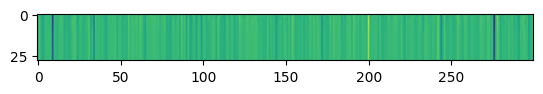

Train Epoch: 69 [1600/2360 (68%)]	 KLD Loss: 0.000235 	 NLL Loss: 8651.244141


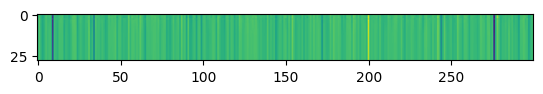

Train Epoch: 69 [1800/2360 (76%)]	 KLD Loss: 0.000028 	 NLL Loss: 8644.255859


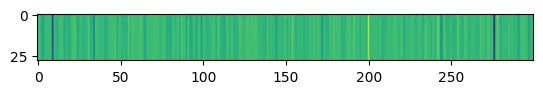

Train Epoch: 69 [2000/2360 (85%)]	 KLD Loss: 0.000593 	 NLL Loss: 8644.284180


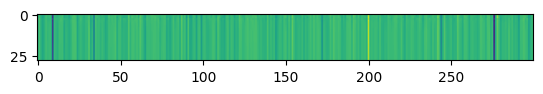

Train Epoch: 69 [2200/2360 (93%)]	 KLD Loss: 0.000233 	 NLL Loss: 8639.751953


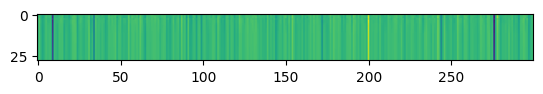

====> Epoch: 69 Average loss: 9243.1799
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2364 
Train Epoch: 70 [0/2360 (0%)]	 KLD Loss: 0.000207 	 NLL Loss: 8644.732422


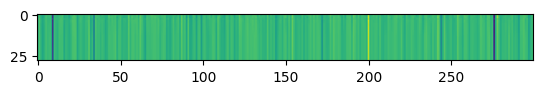

Train Epoch: 70 [200/2360 (8%)]	 KLD Loss: 0.000268 	 NLL Loss: 8646.474609


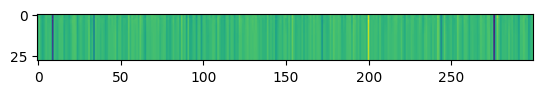

Train Epoch: 70 [400/2360 (17%)]	 KLD Loss: 0.000092 	 NLL Loss: 8646.275391


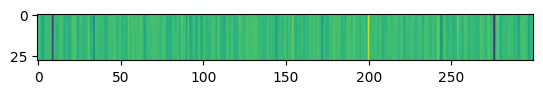

Train Epoch: 70 [600/2360 (25%)]	 KLD Loss: 0.000061 	 NLL Loss: 8595.952148


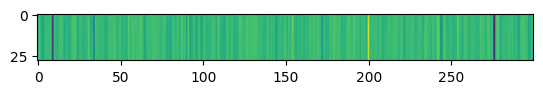

Train Epoch: 70 [800/2360 (34%)]	 KLD Loss: 0.000036 	 NLL Loss: 8643.234375


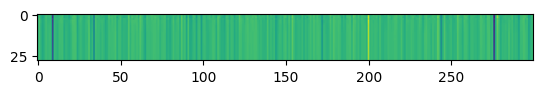

Train Epoch: 70 [1000/2360 (42%)]	 KLD Loss: 0.000067 	 NLL Loss: 8646.307617


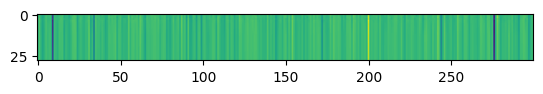

Train Epoch: 70 [1200/2360 (51%)]	 KLD Loss: 0.000328 	 NLL Loss: 8639.096680


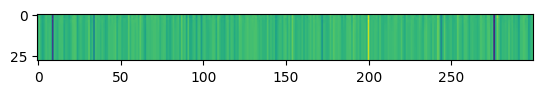

Train Epoch: 70 [1400/2360 (59%)]	 KLD Loss: 0.000688 	 NLL Loss: 8644.114258


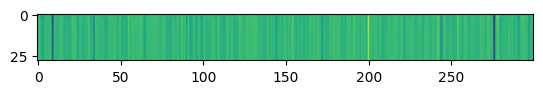

Train Epoch: 70 [1600/2360 (68%)]	 KLD Loss: 0.000213 	 NLL Loss: 8651.322266


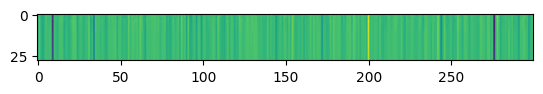

Train Epoch: 70 [1800/2360 (76%)]	 KLD Loss: 0.000110 	 NLL Loss: 8644.280273


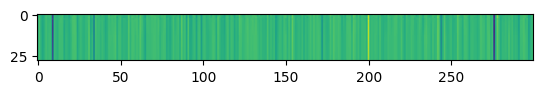

Train Epoch: 70 [2000/2360 (85%)]	 KLD Loss: 0.000144 	 NLL Loss: 8644.310547


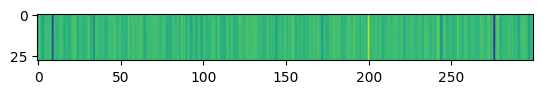

Train Epoch: 70 [2200/2360 (93%)]	 KLD Loss: 0.000188 	 NLL Loss: 8639.728516


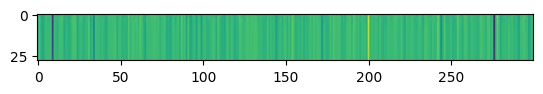

====> Epoch: 70 Average loss: 9243.1725
====> Test set loss: KLD Loss = 0.0003, NLL Loss = 8602.2241 
Train Epoch: 71 [0/2360 (0%)]	 KLD Loss: 0.000253 	 NLL Loss: 8644.658203


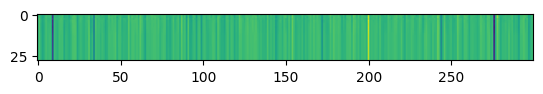

Train Epoch: 71 [200/2360 (8%)]	 KLD Loss: 0.000972 	 NLL Loss: 8646.529297


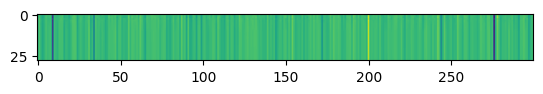

Train Epoch: 71 [400/2360 (17%)]	 KLD Loss: 0.000556 	 NLL Loss: 8646.232422


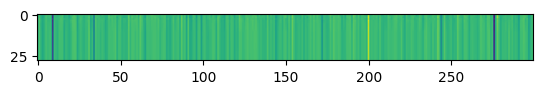

Train Epoch: 71 [600/2360 (25%)]	 KLD Loss: 0.000370 	 NLL Loss: 8595.930664


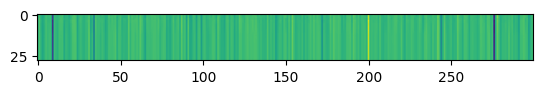

Train Epoch: 71 [800/2360 (34%)]	 KLD Loss: 0.000206 	 NLL Loss: 8643.219727


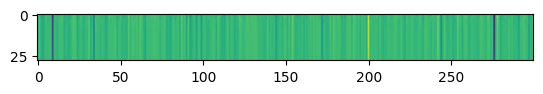

Train Epoch: 71 [1000/2360 (42%)]	 KLD Loss: 0.000108 	 NLL Loss: 8646.279297


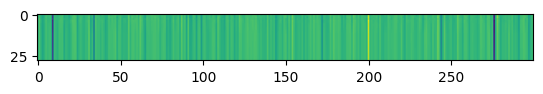

Train Epoch: 71 [1200/2360 (51%)]	 KLD Loss: 0.000376 	 NLL Loss: 8639.082031


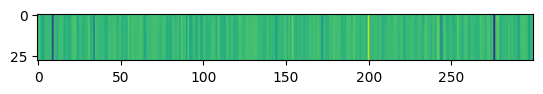

Train Epoch: 71 [1400/2360 (59%)]	 KLD Loss: 0.000884 	 NLL Loss: 8644.099609


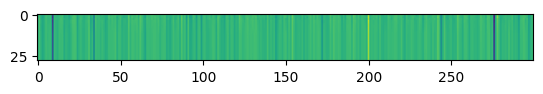

Train Epoch: 71 [1600/2360 (68%)]	 KLD Loss: 0.000330 	 NLL Loss: 8651.266602


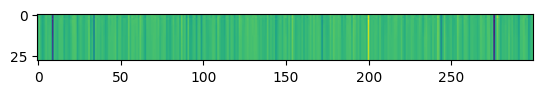

Train Epoch: 71 [1800/2360 (76%)]	 KLD Loss: 0.000152 	 NLL Loss: 8644.326172


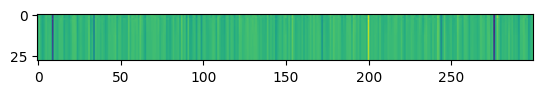

Train Epoch: 71 [2000/2360 (85%)]	 KLD Loss: 0.000337 	 NLL Loss: 8644.333008


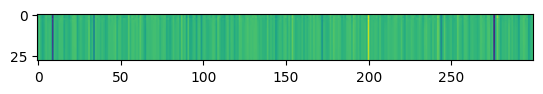

Train Epoch: 71 [2200/2360 (93%)]	 KLD Loss: 0.000180 	 NLL Loss: 8639.702148


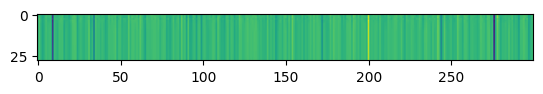

====> Epoch: 71 Average loss: 9243.1801
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2239 
Train Epoch: 72 [0/2360 (0%)]	 KLD Loss: 0.000170 	 NLL Loss: 8644.690430


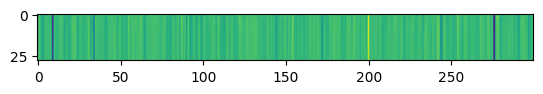

Train Epoch: 72 [200/2360 (8%)]	 KLD Loss: 0.000230 	 NLL Loss: 8646.492188


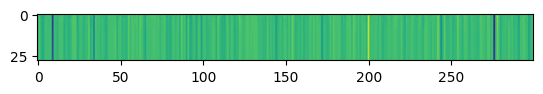

Train Epoch: 72 [400/2360 (17%)]	 KLD Loss: 0.000103 	 NLL Loss: 8646.250000


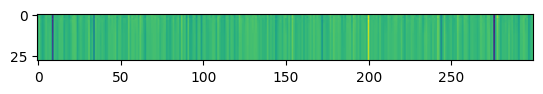

Train Epoch: 72 [600/2360 (25%)]	 KLD Loss: 0.000105 	 NLL Loss: 8595.896484


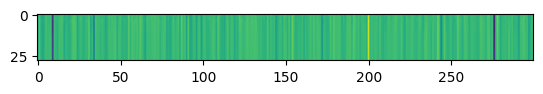

Train Epoch: 72 [800/2360 (34%)]	 KLD Loss: 0.000067 	 NLL Loss: 8643.221680


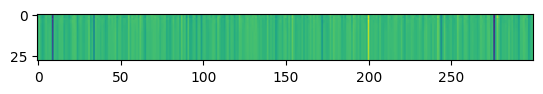

Train Epoch: 72 [1000/2360 (42%)]	 KLD Loss: 0.000070 	 NLL Loss: 8646.333984


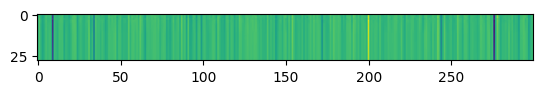

Train Epoch: 72 [1200/2360 (51%)]	 KLD Loss: 0.000563 	 NLL Loss: 8639.072266


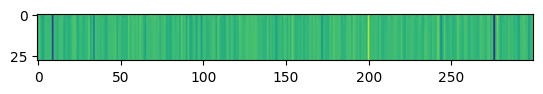

Train Epoch: 72 [1400/2360 (59%)]	 KLD Loss: 0.000765 	 NLL Loss: 8644.083984


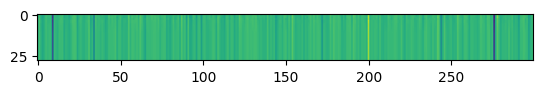

Train Epoch: 72 [1600/2360 (68%)]	 KLD Loss: 0.000273 	 NLL Loss: 8651.302734


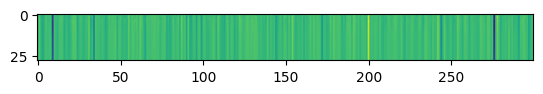

Train Epoch: 72 [1800/2360 (76%)]	 KLD Loss: 0.000132 	 NLL Loss: 8644.283203


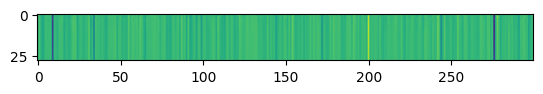

Train Epoch: 72 [2000/2360 (85%)]	 KLD Loss: 0.000205 	 NLL Loss: 8644.290039


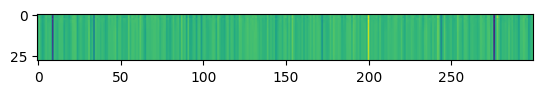

Train Epoch: 72 [2200/2360 (93%)]	 KLD Loss: 0.000093 	 NLL Loss: 8639.719727


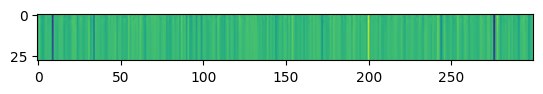

====> Epoch: 72 Average loss: 9243.1663
====> Test set loss: KLD Loss = 0.0003, NLL Loss = 8602.2133 
Train Epoch: 73 [0/2360 (0%)]	 KLD Loss: 0.000283 	 NLL Loss: 8644.682617


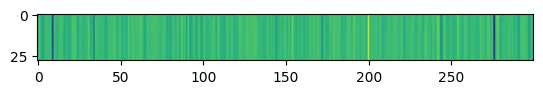

Train Epoch: 73 [200/2360 (8%)]	 KLD Loss: 0.000213 	 NLL Loss: 8646.513672


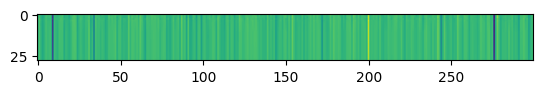

Train Epoch: 73 [400/2360 (17%)]	 KLD Loss: 0.000140 	 NLL Loss: 8646.190430


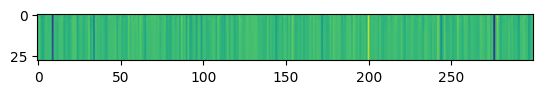

Train Epoch: 73 [600/2360 (25%)]	 KLD Loss: 0.000158 	 NLL Loss: 8595.904297


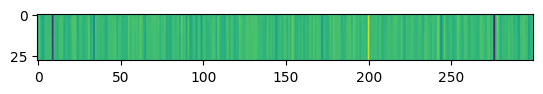

Train Epoch: 73 [800/2360 (34%)]	 KLD Loss: 0.000153 	 NLL Loss: 8643.232422


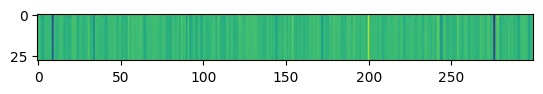

Train Epoch: 73 [1000/2360 (42%)]	 KLD Loss: 0.000143 	 NLL Loss: 8646.345703


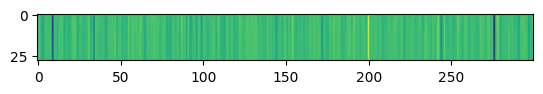

Train Epoch: 73 [1200/2360 (51%)]	 KLD Loss: 0.000295 	 NLL Loss: 8639.103516


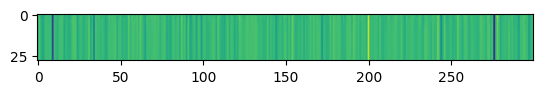

Train Epoch: 73 [1400/2360 (59%)]	 KLD Loss: 0.000426 	 NLL Loss: 8644.113281


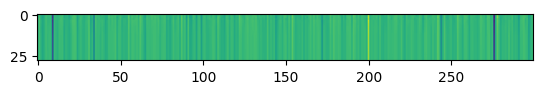

Train Epoch: 73 [1600/2360 (68%)]	 KLD Loss: 0.001293 	 NLL Loss: 8651.308594


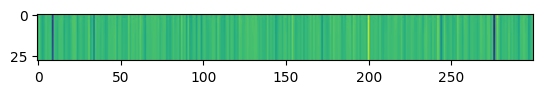

Train Epoch: 73 [1800/2360 (76%)]	 KLD Loss: 0.000471 	 NLL Loss: 8644.264648


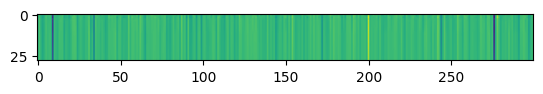

Train Epoch: 73 [2000/2360 (85%)]	 KLD Loss: 0.000391 	 NLL Loss: 8644.340820


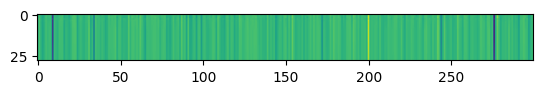

Train Epoch: 73 [2200/2360 (93%)]	 KLD Loss: 0.000120 	 NLL Loss: 8639.770508


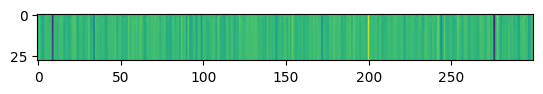

====> Epoch: 73 Average loss: 9243.1745
====> Test set loss: KLD Loss = 0.0003, NLL Loss = 8602.2010 
Train Epoch: 74 [0/2360 (0%)]	 KLD Loss: 0.000338 	 NLL Loss: 8644.647461


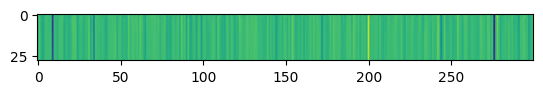

Train Epoch: 74 [200/2360 (8%)]	 KLD Loss: 0.000343 	 NLL Loss: 8646.419922


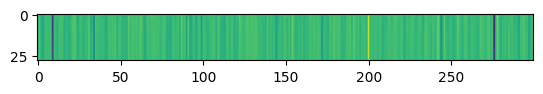

Train Epoch: 74 [400/2360 (17%)]	 KLD Loss: 0.000063 	 NLL Loss: 8646.234375


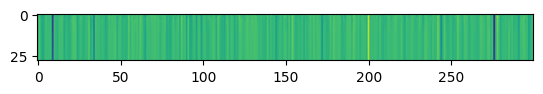

Train Epoch: 74 [600/2360 (25%)]	 KLD Loss: 0.000158 	 NLL Loss: 8595.875977


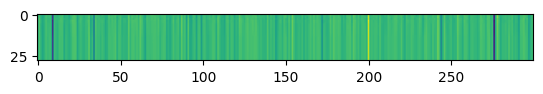

Train Epoch: 74 [800/2360 (34%)]	 KLD Loss: 0.000145 	 NLL Loss: 8643.250977


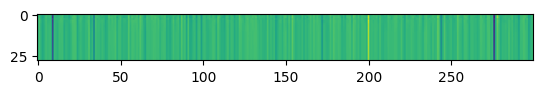

Train Epoch: 74 [1000/2360 (42%)]	 KLD Loss: 0.000075 	 NLL Loss: 8646.297852


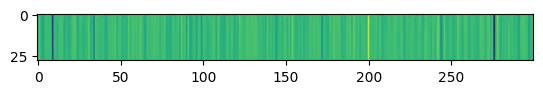

Train Epoch: 74 [1200/2360 (51%)]	 KLD Loss: 0.000566 	 NLL Loss: 8639.072266


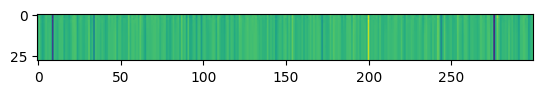

Train Epoch: 74 [1400/2360 (59%)]	 KLD Loss: 0.000698 	 NLL Loss: 8644.162109


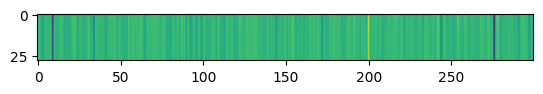

Train Epoch: 74 [1600/2360 (68%)]	 KLD Loss: 0.000185 	 NLL Loss: 8651.304688


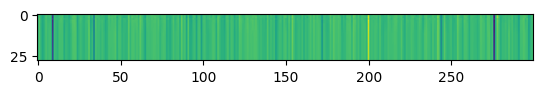

Train Epoch: 74 [1800/2360 (76%)]	 KLD Loss: 0.000168 	 NLL Loss: 8644.258789


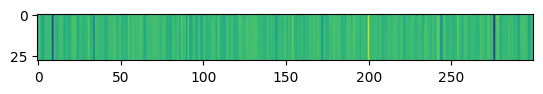

Train Epoch: 74 [2000/2360 (85%)]	 KLD Loss: 0.000140 	 NLL Loss: 8644.220703


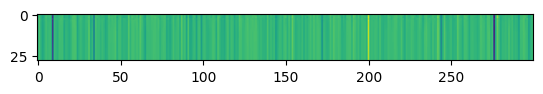

Train Epoch: 74 [2200/2360 (93%)]	 KLD Loss: 0.000085 	 NLL Loss: 8639.756836


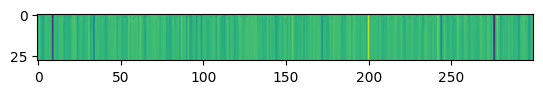

====> Epoch: 74 Average loss: 9243.1729
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2160 
Train Epoch: 75 [0/2360 (0%)]	 KLD Loss: 0.000132 	 NLL Loss: 8644.675781


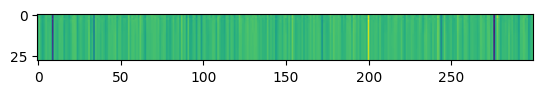

Train Epoch: 75 [200/2360 (8%)]	 KLD Loss: 0.000115 	 NLL Loss: 8646.564453


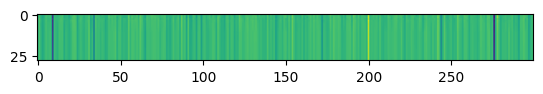

Train Epoch: 75 [400/2360 (17%)]	 KLD Loss: 0.000098 	 NLL Loss: 8646.293945


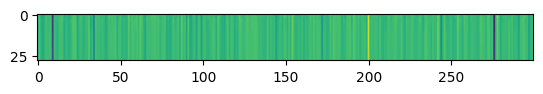

Train Epoch: 75 [600/2360 (25%)]	 KLD Loss: 0.000140 	 NLL Loss: 8595.912109


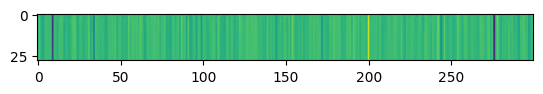

Train Epoch: 75 [800/2360 (34%)]	 KLD Loss: 0.000100 	 NLL Loss: 8643.235352


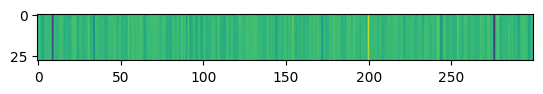

Train Epoch: 75 [1000/2360 (42%)]	 KLD Loss: 0.000068 	 NLL Loss: 8646.241211


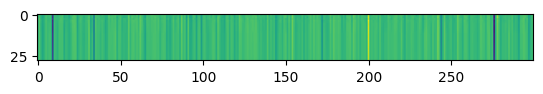

Train Epoch: 75 [1200/2360 (51%)]	 KLD Loss: 0.000233 	 NLL Loss: 8639.091797


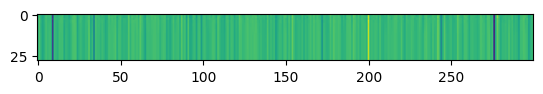

Train Epoch: 75 [1400/2360 (59%)]	 KLD Loss: 0.000173 	 NLL Loss: 8644.178711


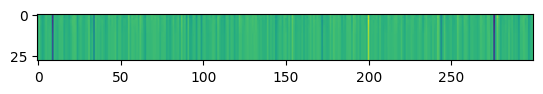

Train Epoch: 75 [1600/2360 (68%)]	 KLD Loss: 0.000213 	 NLL Loss: 8651.348633


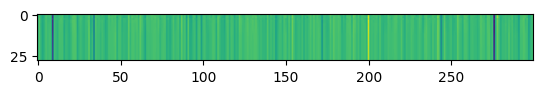

Train Epoch: 75 [1800/2360 (76%)]	 KLD Loss: 0.000163 	 NLL Loss: 8644.299805


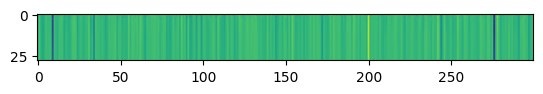

Train Epoch: 75 [2000/2360 (85%)]	 KLD Loss: 0.000230 	 NLL Loss: 8644.250000


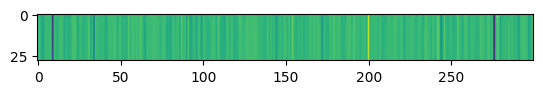

Train Epoch: 75 [2200/2360 (93%)]	 KLD Loss: 0.000120 	 NLL Loss: 8639.692383


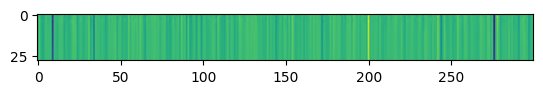

====> Epoch: 75 Average loss: 9243.1825
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2183 
Train Epoch: 76 [0/2360 (0%)]	 KLD Loss: 0.000220 	 NLL Loss: 8644.712891


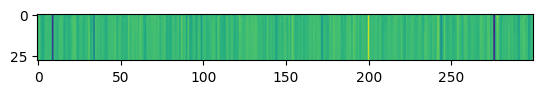

Train Epoch: 76 [200/2360 (8%)]	 KLD Loss: 0.000155 	 NLL Loss: 8646.527344


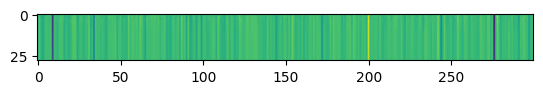

Train Epoch: 76 [400/2360 (17%)]	 KLD Loss: 0.000093 	 NLL Loss: 8646.244141


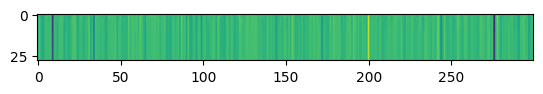

Train Epoch: 76 [600/2360 (25%)]	 KLD Loss: 0.000195 	 NLL Loss: 8595.861328


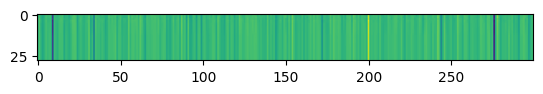

Train Epoch: 76 [800/2360 (34%)]	 KLD Loss: 0.000193 	 NLL Loss: 8643.234375


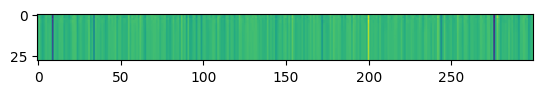

Train Epoch: 76 [1000/2360 (42%)]	 KLD Loss: 0.000195 	 NLL Loss: 8646.275391


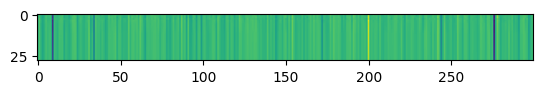

Train Epoch: 76 [1200/2360 (51%)]	 KLD Loss: 0.000426 	 NLL Loss: 8639.086914


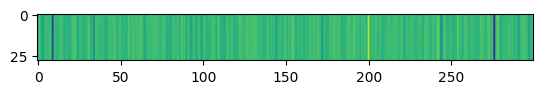

Train Epoch: 76 [1400/2360 (59%)]	 KLD Loss: 0.000588 	 NLL Loss: 8644.098633


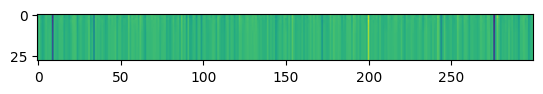

Train Epoch: 76 [1600/2360 (68%)]	 KLD Loss: 0.000601 	 NLL Loss: 8651.323242


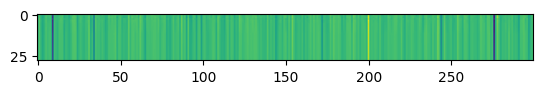

Train Epoch: 76 [1800/2360 (76%)]	 KLD Loss: 0.000388 	 NLL Loss: 8644.298828


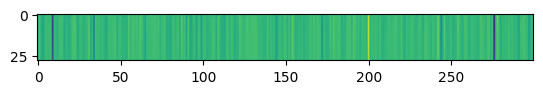

Train Epoch: 76 [2000/2360 (85%)]	 KLD Loss: 0.000396 	 NLL Loss: 8644.279297


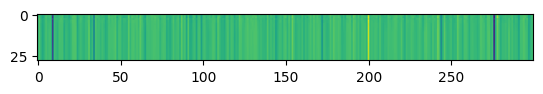

Train Epoch: 76 [2200/2360 (93%)]	 KLD Loss: 0.000130 	 NLL Loss: 8639.680664


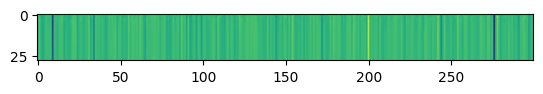

====> Epoch: 76 Average loss: 9243.1759
====> Test set loss: KLD Loss = 0.0005, NLL Loss = 8602.2229 
Train Epoch: 77 [0/2360 (0%)]	 KLD Loss: 0.000503 	 NLL Loss: 8644.706055


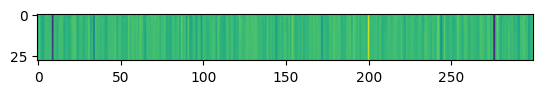

Train Epoch: 77 [200/2360 (8%)]	 KLD Loss: 0.000306 	 NLL Loss: 8646.490234


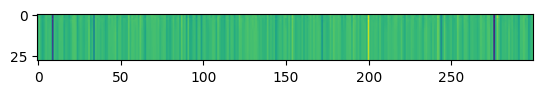

Train Epoch: 77 [400/2360 (17%)]	 KLD Loss: 0.000409 	 NLL Loss: 8646.236328


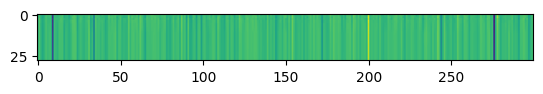

Train Epoch: 77 [600/2360 (25%)]	 KLD Loss: 0.000443 	 NLL Loss: 8595.912109


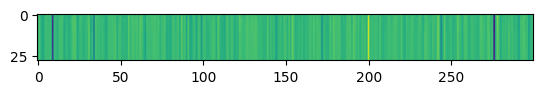

Train Epoch: 77 [800/2360 (34%)]	 KLD Loss: 0.000230 	 NLL Loss: 8643.240234


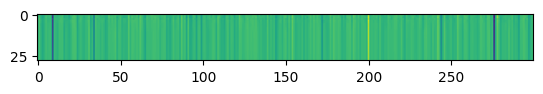

Train Epoch: 77 [1000/2360 (42%)]	 KLD Loss: 0.000138 	 NLL Loss: 8646.302734


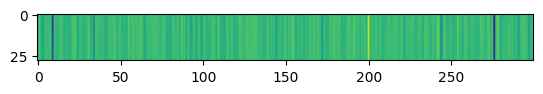

Train Epoch: 77 [1200/2360 (51%)]	 KLD Loss: 0.000150 	 NLL Loss: 8639.082031


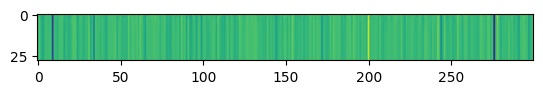

Train Epoch: 77 [1400/2360 (59%)]	 KLD Loss: 0.000355 	 NLL Loss: 8644.066406


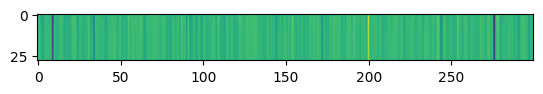

Train Epoch: 77 [1600/2360 (68%)]	 KLD Loss: 0.000163 	 NLL Loss: 8651.267578


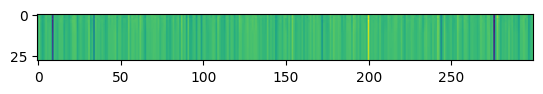

Train Epoch: 77 [1800/2360 (76%)]	 KLD Loss: 0.000073 	 NLL Loss: 8644.291992


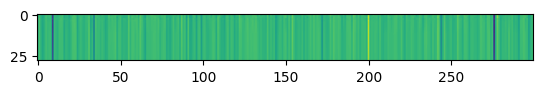

Train Epoch: 77 [2000/2360 (85%)]	 KLD Loss: 0.000118 	 NLL Loss: 8644.288086


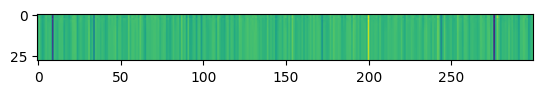

Train Epoch: 77 [2200/2360 (93%)]	 KLD Loss: 0.000103 	 NLL Loss: 8639.720703


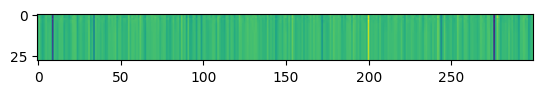

====> Epoch: 77 Average loss: 9243.1741
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2064 
Train Epoch: 78 [0/2360 (0%)]	 KLD Loss: 0.000091 	 NLL Loss: 8644.640625


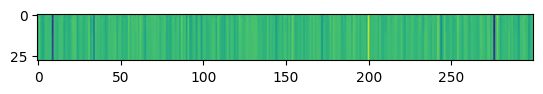

Train Epoch: 78 [200/2360 (8%)]	 KLD Loss: 0.000300 	 NLL Loss: 8646.463867


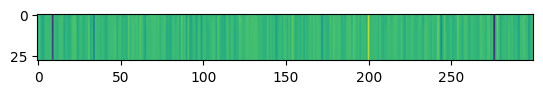

Train Epoch: 78 [400/2360 (17%)]	 KLD Loss: 0.000070 	 NLL Loss: 8646.224609


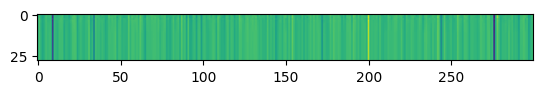

Train Epoch: 78 [600/2360 (25%)]	 KLD Loss: 0.000127 	 NLL Loss: 8595.912109


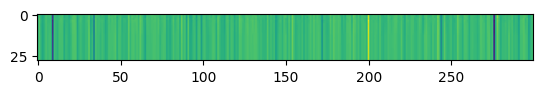

Train Epoch: 78 [800/2360 (34%)]	 KLD Loss: 0.000058 	 NLL Loss: 8643.223633


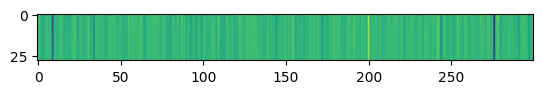

Train Epoch: 78 [1000/2360 (42%)]	 KLD Loss: 0.000113 	 NLL Loss: 8646.282227


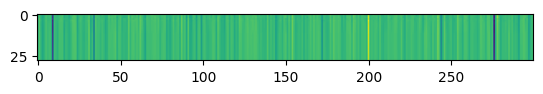

Train Epoch: 78 [1200/2360 (51%)]	 KLD Loss: 0.000123 	 NLL Loss: 8639.095703


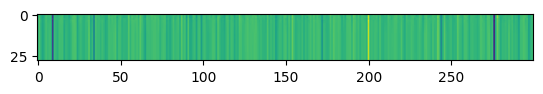

Train Epoch: 78 [1400/2360 (59%)]	 KLD Loss: 0.000273 	 NLL Loss: 8644.083984


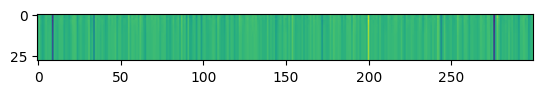

Train Epoch: 78 [1600/2360 (68%)]	 KLD Loss: 0.000173 	 NLL Loss: 8651.282227


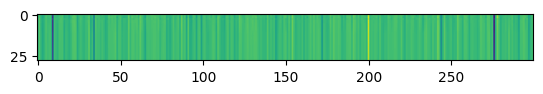

Train Epoch: 78 [1800/2360 (76%)]	 KLD Loss: 0.000123 	 NLL Loss: 8644.299805


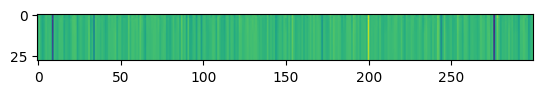

Train Epoch: 78 [2000/2360 (85%)]	 KLD Loss: 0.000185 	 NLL Loss: 8644.244141


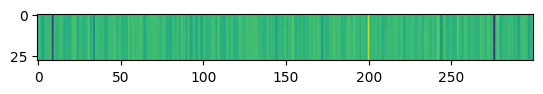

Train Epoch: 78 [2200/2360 (93%)]	 KLD Loss: 0.000090 	 NLL Loss: 8639.674805


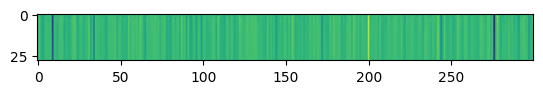

====> Epoch: 78 Average loss: 9243.1704
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.1990 
Train Epoch: 79 [0/2360 (0%)]	 KLD Loss: 0.000183 	 NLL Loss: 8644.686523


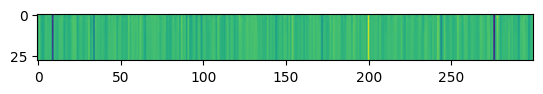

Train Epoch: 79 [200/2360 (8%)]	 KLD Loss: 0.000203 	 NLL Loss: 8646.478516


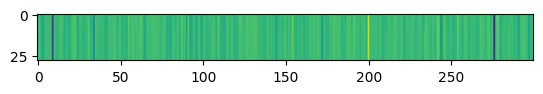

Train Epoch: 79 [400/2360 (17%)]	 KLD Loss: 0.000130 	 NLL Loss: 8646.187500


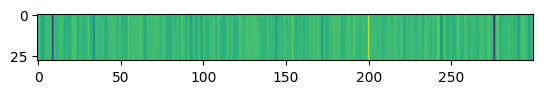

Train Epoch: 79 [600/2360 (25%)]	 KLD Loss: 0.000135 	 NLL Loss: 8595.916016


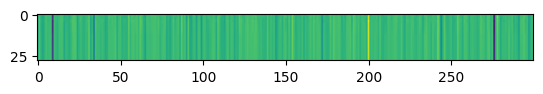

Train Epoch: 79 [800/2360 (34%)]	 KLD Loss: 0.000113 	 NLL Loss: 8643.280273


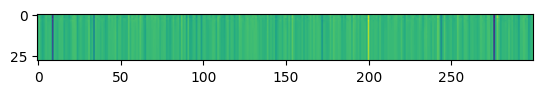

Train Epoch: 79 [1000/2360 (42%)]	 KLD Loss: 0.000300 	 NLL Loss: 8646.275391


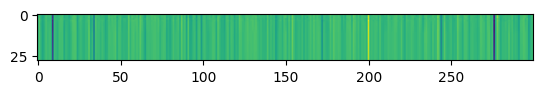

Train Epoch: 79 [1200/2360 (51%)]	 KLD Loss: 0.000155 	 NLL Loss: 8639.105469


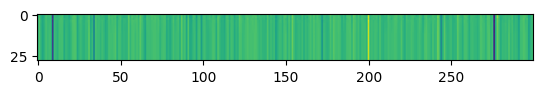

Train Epoch: 79 [1400/2360 (59%)]	 KLD Loss: 0.000278 	 NLL Loss: 8644.110352


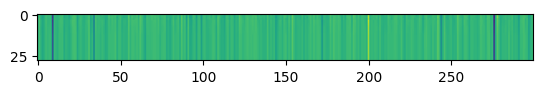

Train Epoch: 79 [1600/2360 (68%)]	 KLD Loss: 0.000203 	 NLL Loss: 8651.223633


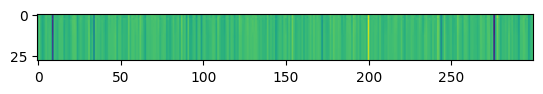

Train Epoch: 79 [1800/2360 (76%)]	 KLD Loss: 0.000213 	 NLL Loss: 8644.279297


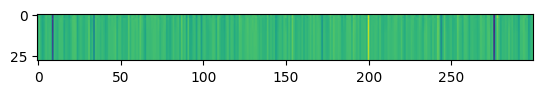

Train Epoch: 79 [2000/2360 (85%)]	 KLD Loss: 0.000355 	 NLL Loss: 8644.272461


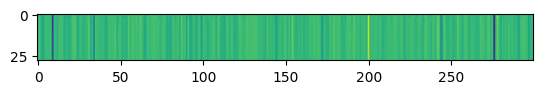

Train Epoch: 79 [2200/2360 (93%)]	 KLD Loss: 0.000179 	 NLL Loss: 8639.724609


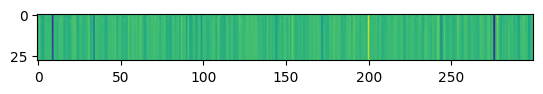

====> Epoch: 79 Average loss: 9243.1637
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2157 
Train Epoch: 80 [0/2360 (0%)]	 KLD Loss: 0.000195 	 NLL Loss: 8644.712891


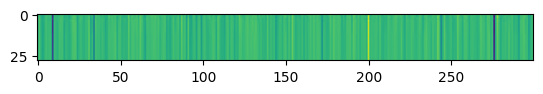

Train Epoch: 80 [200/2360 (8%)]	 KLD Loss: 0.000376 	 NLL Loss: 8646.514648


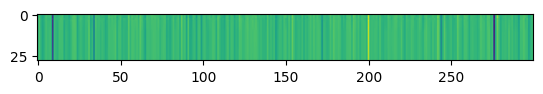

Train Epoch: 80 [400/2360 (17%)]	 KLD Loss: 0.000153 	 NLL Loss: 8646.287109


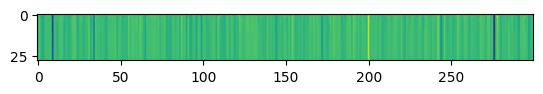

Train Epoch: 80 [600/2360 (25%)]	 KLD Loss: 0.000133 	 NLL Loss: 8595.854492


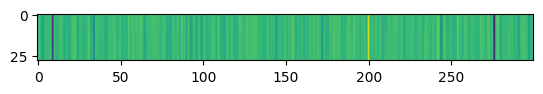

Train Epoch: 80 [800/2360 (34%)]	 KLD Loss: 0.000343 	 NLL Loss: 8643.275391


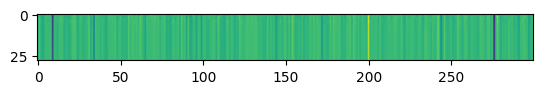

Train Epoch: 80 [1000/2360 (42%)]	 KLD Loss: 0.000130 	 NLL Loss: 8646.326172


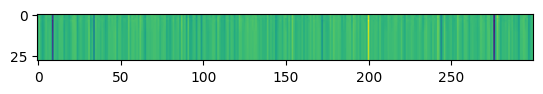

Train Epoch: 80 [1200/2360 (51%)]	 KLD Loss: 0.000156 	 NLL Loss: 8639.109375


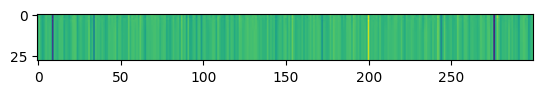

Train Epoch: 80 [1400/2360 (59%)]	 KLD Loss: 0.000093 	 NLL Loss: 8644.026367


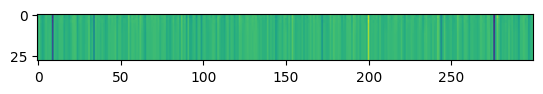

Train Epoch: 80 [1600/2360 (68%)]	 KLD Loss: 0.000143 	 NLL Loss: 8651.230469


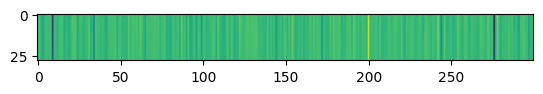

Train Epoch: 80 [1800/2360 (76%)]	 KLD Loss: 0.000095 	 NLL Loss: 8644.329102


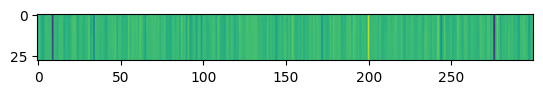

Train Epoch: 80 [2000/2360 (85%)]	 KLD Loss: 0.000175 	 NLL Loss: 8644.342773


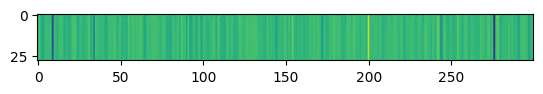

Train Epoch: 80 [2200/2360 (93%)]	 KLD Loss: 0.000130 	 NLL Loss: 8639.715820


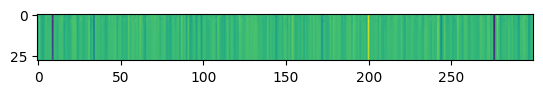

====> Epoch: 80 Average loss: 9243.1575
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2066 
Train Epoch: 81 [0/2360 (0%)]	 KLD Loss: 0.000113 	 NLL Loss: 8644.639648


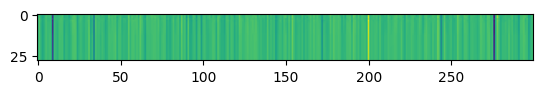

Train Epoch: 81 [200/2360 (8%)]	 KLD Loss: 0.000328 	 NLL Loss: 8646.477539


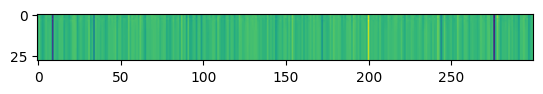

Train Epoch: 81 [400/2360 (17%)]	 KLD Loss: 0.000198 	 NLL Loss: 8646.220703


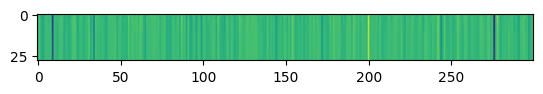

Train Epoch: 81 [600/2360 (25%)]	 KLD Loss: 0.000496 	 NLL Loss: 8595.986328


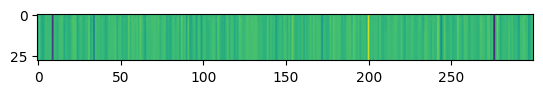

Train Epoch: 81 [800/2360 (34%)]	 KLD Loss: 0.000373 	 NLL Loss: 8643.213867


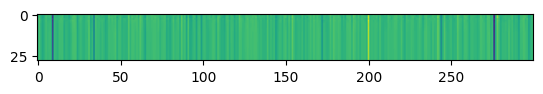

Train Epoch: 81 [1000/2360 (42%)]	 KLD Loss: 0.000168 	 NLL Loss: 8646.313477


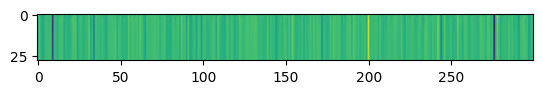

Train Epoch: 81 [1200/2360 (51%)]	 KLD Loss: 0.000643 	 NLL Loss: 8639.119141


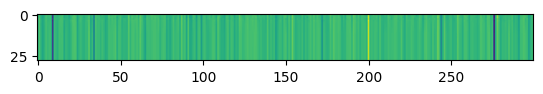

Train Epoch: 81 [1400/2360 (59%)]	 KLD Loss: 0.000295 	 NLL Loss: 8644.053711


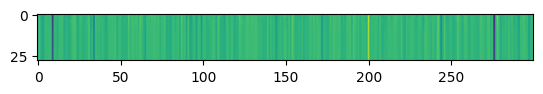

Train Epoch: 81 [1600/2360 (68%)]	 KLD Loss: 0.000188 	 NLL Loss: 8651.258789


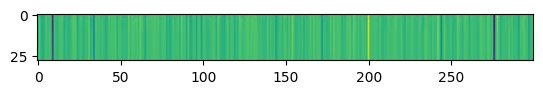

Train Epoch: 81 [1800/2360 (76%)]	 KLD Loss: 0.000235 	 NLL Loss: 8644.318359


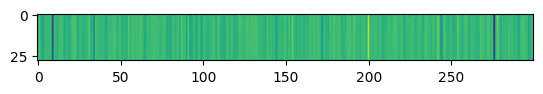

Train Epoch: 81 [2000/2360 (85%)]	 KLD Loss: 0.000147 	 NLL Loss: 8644.291016


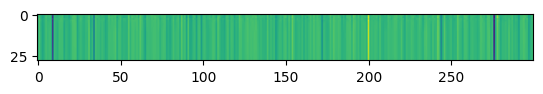

Train Epoch: 81 [2200/2360 (93%)]	 KLD Loss: 0.000083 	 NLL Loss: 8639.693359


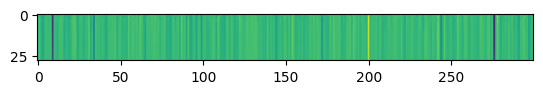

====> Epoch: 81 Average loss: 9243.1581
====> Test set loss: KLD Loss = 0.0006, NLL Loss = 8602.2066 
Train Epoch: 82 [0/2360 (0%)]	 KLD Loss: 0.000553 	 NLL Loss: 8644.703125


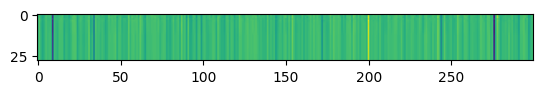

Train Epoch: 82 [200/2360 (8%)]	 KLD Loss: 0.000473 	 NLL Loss: 8646.427734


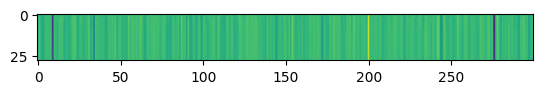

Train Epoch: 82 [400/2360 (17%)]	 KLD Loss: 0.000411 	 NLL Loss: 8646.417969


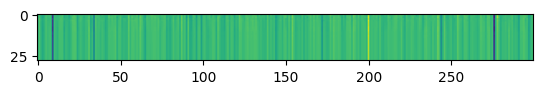

Train Epoch: 82 [600/2360 (25%)]	 KLD Loss: 0.000379 	 NLL Loss: 8595.893555


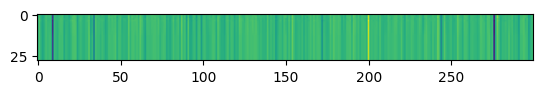

Train Epoch: 82 [800/2360 (34%)]	 KLD Loss: 0.000423 	 NLL Loss: 8643.224609


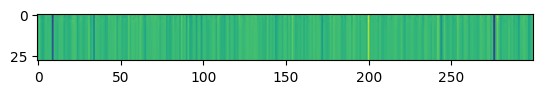

Train Epoch: 82 [1000/2360 (42%)]	 KLD Loss: 0.000153 	 NLL Loss: 8646.347656


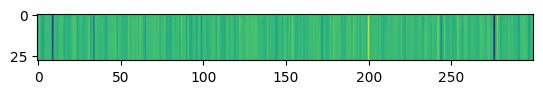

Train Epoch: 82 [1200/2360 (51%)]	 KLD Loss: 0.000095 	 NLL Loss: 8639.120117


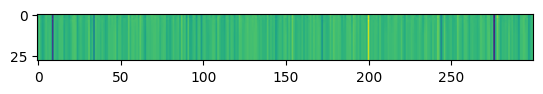

Train Epoch: 82 [1400/2360 (59%)]	 KLD Loss: 0.001252 	 NLL Loss: 8644.023438


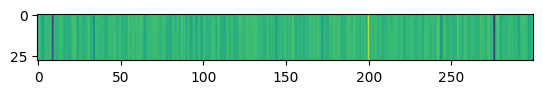

Train Epoch: 82 [1600/2360 (68%)]	 KLD Loss: 0.000869 	 NLL Loss: 8651.259766


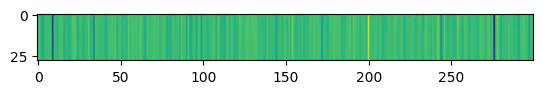

Train Epoch: 82 [1800/2360 (76%)]	 KLD Loss: 0.000181 	 NLL Loss: 8644.286133


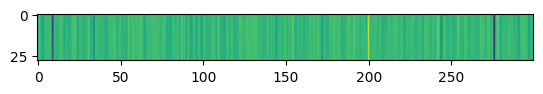

Train Epoch: 82 [2000/2360 (85%)]	 KLD Loss: 0.000158 	 NLL Loss: 8644.271484


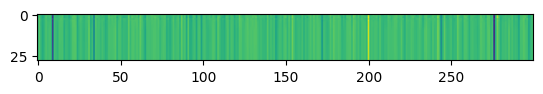

Train Epoch: 82 [2200/2360 (93%)]	 KLD Loss: 0.000328 	 NLL Loss: 8639.669922


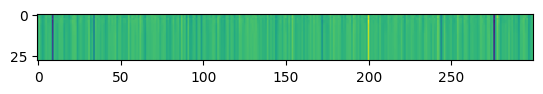

====> Epoch: 82 Average loss: 9243.1638
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2026 
Train Epoch: 83 [0/2360 (0%)]	 KLD Loss: 0.000148 	 NLL Loss: 8644.653320


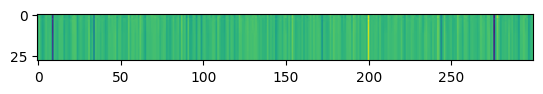

Train Epoch: 83 [200/2360 (8%)]	 KLD Loss: 0.000223 	 NLL Loss: 8646.412109


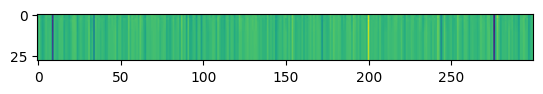

Train Epoch: 83 [400/2360 (17%)]	 KLD Loss: 0.000175 	 NLL Loss: 8646.173828


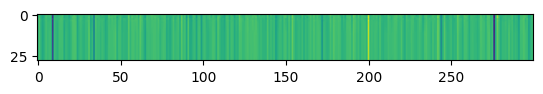

Train Epoch: 83 [600/2360 (25%)]	 KLD Loss: 0.000273 	 NLL Loss: 8595.948242


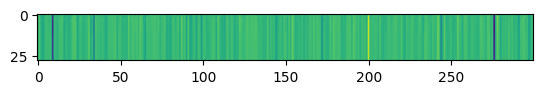

Train Epoch: 83 [800/2360 (34%)]	 KLD Loss: 0.000193 	 NLL Loss: 8643.271484


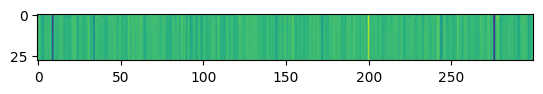

Train Epoch: 83 [1000/2360 (42%)]	 KLD Loss: 0.000148 	 NLL Loss: 8646.267578


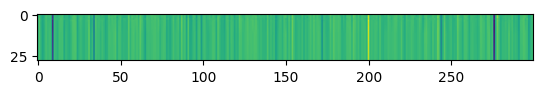

Train Epoch: 83 [1200/2360 (51%)]	 KLD Loss: 0.000357 	 NLL Loss: 8639.136719


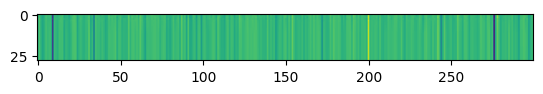

Train Epoch: 83 [1400/2360 (59%)]	 KLD Loss: 0.000248 	 NLL Loss: 8644.064453


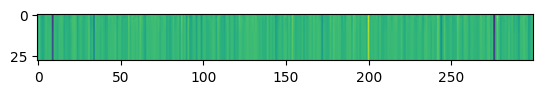

Train Epoch: 83 [1600/2360 (68%)]	 KLD Loss: 0.000125 	 NLL Loss: 8651.265625


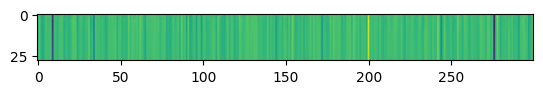

Train Epoch: 83 [1800/2360 (76%)]	 KLD Loss: 0.000105 	 NLL Loss: 8644.290039


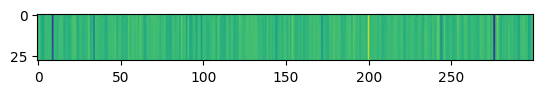

Train Epoch: 83 [2000/2360 (85%)]	 KLD Loss: 0.000140 	 NLL Loss: 8644.253906


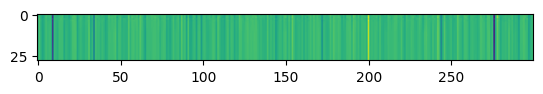

Train Epoch: 83 [2200/2360 (93%)]	 KLD Loss: 0.000143 	 NLL Loss: 8639.717773


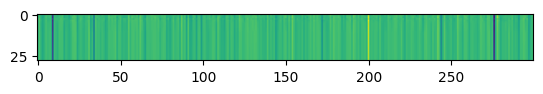

====> Epoch: 83 Average loss: 9243.1588
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2112 
Train Epoch: 84 [0/2360 (0%)]	 KLD Loss: 0.000193 	 NLL Loss: 8644.684570


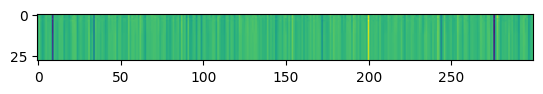

Train Epoch: 84 [200/2360 (8%)]	 KLD Loss: 0.000169 	 NLL Loss: 8646.489258


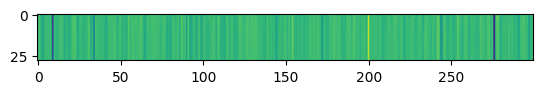

Train Epoch: 84 [400/2360 (17%)]	 KLD Loss: 0.000068 	 NLL Loss: 8646.240234


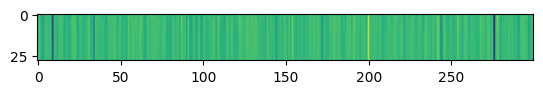

Train Epoch: 84 [600/2360 (25%)]	 KLD Loss: 0.000082 	 NLL Loss: 8595.895508


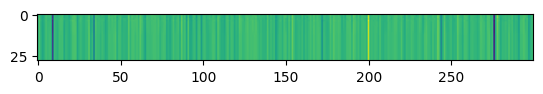

Train Epoch: 84 [800/2360 (34%)]	 KLD Loss: 0.000230 	 NLL Loss: 8643.226562


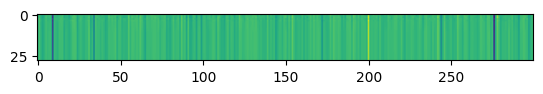

Train Epoch: 84 [1000/2360 (42%)]	 KLD Loss: 0.000413 	 NLL Loss: 8646.280273


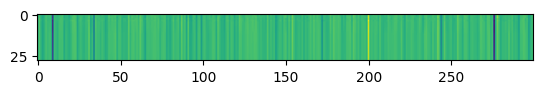

Train Epoch: 84 [1200/2360 (51%)]	 KLD Loss: 0.000243 	 NLL Loss: 8639.108398


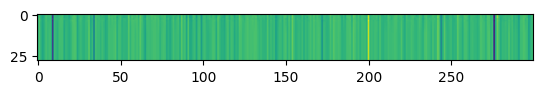

Train Epoch: 84 [1400/2360 (59%)]	 KLD Loss: 0.000195 	 NLL Loss: 8644.070312


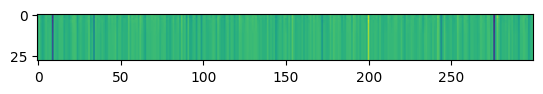

Train Epoch: 84 [1600/2360 (68%)]	 KLD Loss: 0.000143 	 NLL Loss: 8651.293945


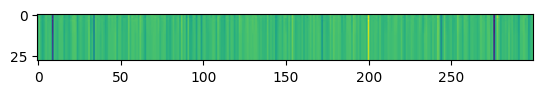

Train Epoch: 84 [1800/2360 (76%)]	 KLD Loss: 0.000057 	 NLL Loss: 8644.313477


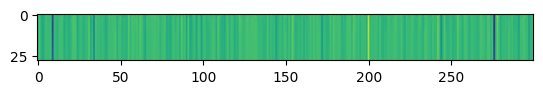

Train Epoch: 84 [2000/2360 (85%)]	 KLD Loss: 0.000103 	 NLL Loss: 8644.261719


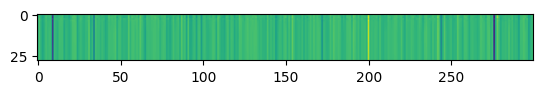

Train Epoch: 84 [2200/2360 (93%)]	 KLD Loss: 0.000082 	 NLL Loss: 8639.672852


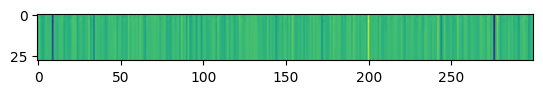

====> Epoch: 84 Average loss: 9243.1655
====> Test set loss: KLD Loss = 0.0004, NLL Loss = 8602.2005 
Train Epoch: 85 [0/2360 (0%)]	 KLD Loss: 0.000396 	 NLL Loss: 8644.700195


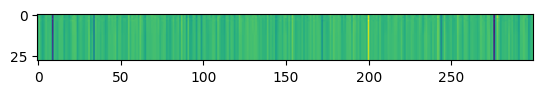

Train Epoch: 85 [200/2360 (8%)]	 KLD Loss: 0.000215 	 NLL Loss: 8646.481445


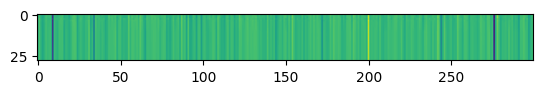

Train Epoch: 85 [400/2360 (17%)]	 KLD Loss: 0.000296 	 NLL Loss: 8646.211914


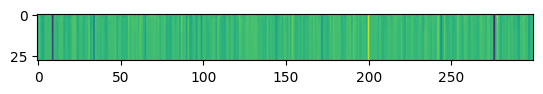

Train Epoch: 85 [600/2360 (25%)]	 KLD Loss: 0.000258 	 NLL Loss: 8595.964844


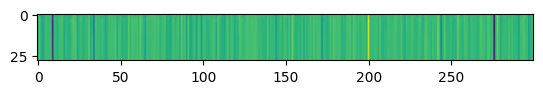

Train Epoch: 85 [800/2360 (34%)]	 KLD Loss: 0.000075 	 NLL Loss: 8643.250000


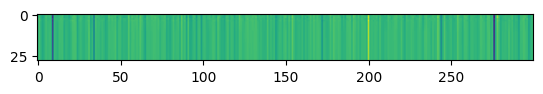

Train Epoch: 85 [1000/2360 (42%)]	 KLD Loss: 0.000341 	 NLL Loss: 8646.277344


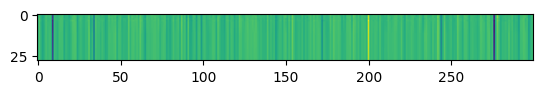

Train Epoch: 85 [1200/2360 (51%)]	 KLD Loss: 0.000149 	 NLL Loss: 8639.103516


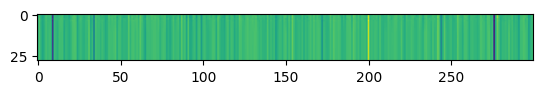

Train Epoch: 85 [1400/2360 (59%)]	 KLD Loss: 0.000170 	 NLL Loss: 8644.104492


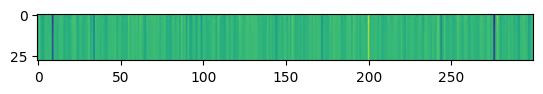

Train Epoch: 85 [1600/2360 (68%)]	 KLD Loss: 0.000466 	 NLL Loss: 8651.251953


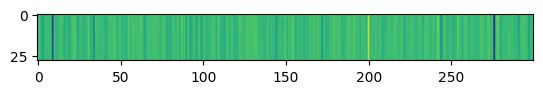

Train Epoch: 85 [1800/2360 (76%)]	 KLD Loss: 0.000338 	 NLL Loss: 8644.323242


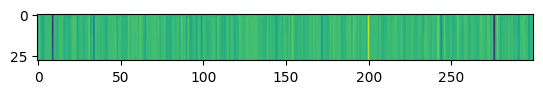

Train Epoch: 85 [2000/2360 (85%)]	 KLD Loss: 0.000168 	 NLL Loss: 8644.304688


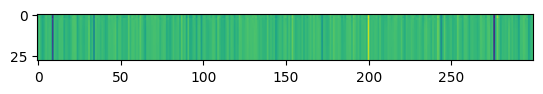

Train Epoch: 85 [2200/2360 (93%)]	 KLD Loss: 0.000108 	 NLL Loss: 8639.702148


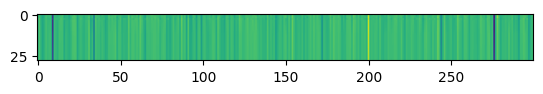

====> Epoch: 85 Average loss: 9243.1745
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2306 
Train Epoch: 86 [0/2360 (0%)]	 KLD Loss: 0.000235 	 NLL Loss: 8644.697266


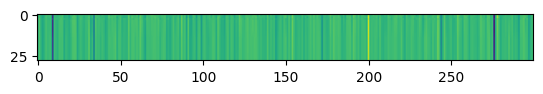

Train Epoch: 86 [200/2360 (8%)]	 KLD Loss: 0.000159 	 NLL Loss: 8646.453125


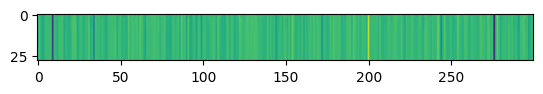

Train Epoch: 86 [400/2360 (17%)]	 KLD Loss: 0.000183 	 NLL Loss: 8646.235352


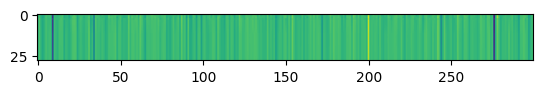

Train Epoch: 86 [600/2360 (25%)]	 KLD Loss: 0.000198 	 NLL Loss: 8595.915039


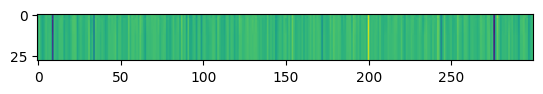

Train Epoch: 86 [800/2360 (34%)]	 KLD Loss: 0.000136 	 NLL Loss: 8643.254883


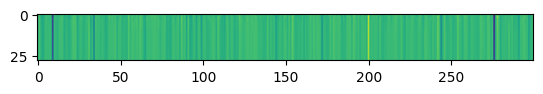

Train Epoch: 86 [1000/2360 (42%)]	 KLD Loss: 0.000206 	 NLL Loss: 8646.225586


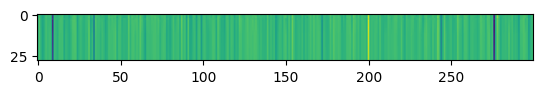

Train Epoch: 86 [1200/2360 (51%)]	 KLD Loss: 0.000170 	 NLL Loss: 8639.093750


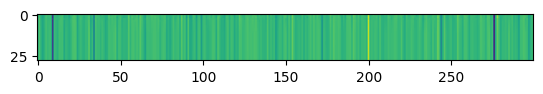

Train Epoch: 86 [1400/2360 (59%)]	 KLD Loss: 0.000190 	 NLL Loss: 8644.094727


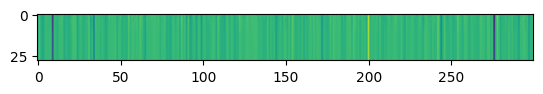

Train Epoch: 86 [1600/2360 (68%)]	 KLD Loss: 0.000087 	 NLL Loss: 8651.291016


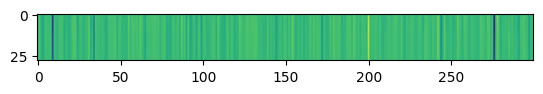

Train Epoch: 86 [1800/2360 (76%)]	 KLD Loss: 0.000310 	 NLL Loss: 8644.328125


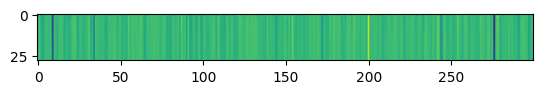

Train Epoch: 86 [2000/2360 (85%)]	 KLD Loss: 0.000373 	 NLL Loss: 8644.306641


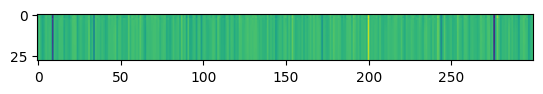

Train Epoch: 86 [2200/2360 (93%)]	 KLD Loss: 0.000113 	 NLL Loss: 8639.685547


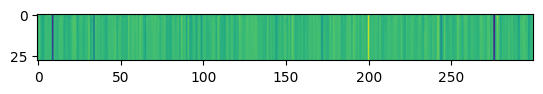

====> Epoch: 86 Average loss: 9243.1738
====> Test set loss: KLD Loss = 0.0003, NLL Loss = 8602.2172 
Train Epoch: 87 [0/2360 (0%)]	 KLD Loss: 0.000338 	 NLL Loss: 8644.686523


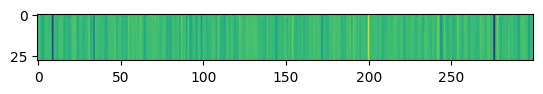

Train Epoch: 87 [200/2360 (8%)]	 KLD Loss: 0.000533 	 NLL Loss: 8646.470703


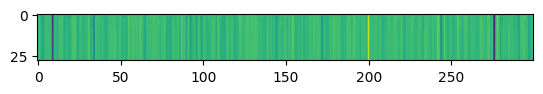

Train Epoch: 87 [400/2360 (17%)]	 KLD Loss: 0.000413 	 NLL Loss: 8646.221680


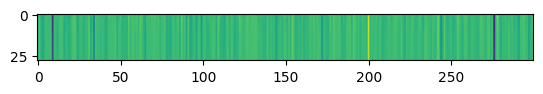

Train Epoch: 87 [600/2360 (25%)]	 KLD Loss: 0.000258 	 NLL Loss: 8595.919922


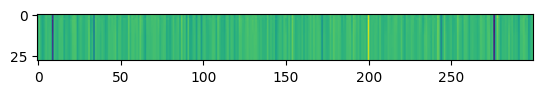

Train Epoch: 87 [800/2360 (34%)]	 KLD Loss: 0.000103 	 NLL Loss: 8643.240234


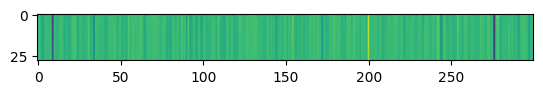

Train Epoch: 87 [1000/2360 (42%)]	 KLD Loss: 0.000258 	 NLL Loss: 8646.224609


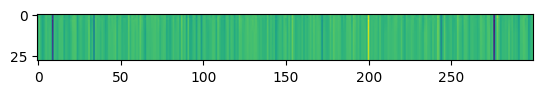

Train Epoch: 87 [1200/2360 (51%)]	 KLD Loss: 0.000208 	 NLL Loss: 8639.098633


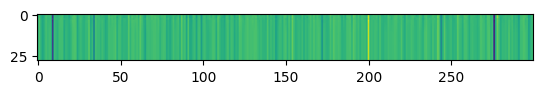

Train Epoch: 87 [1400/2360 (59%)]	 KLD Loss: 0.000120 	 NLL Loss: 8644.119141


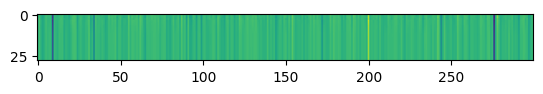

Train Epoch: 87 [1600/2360 (68%)]	 KLD Loss: 0.000180 	 NLL Loss: 8651.265625


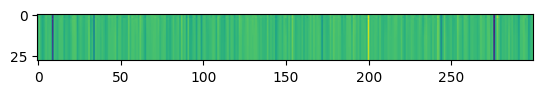

Train Epoch: 87 [1800/2360 (76%)]	 KLD Loss: 0.000113 	 NLL Loss: 8644.340820


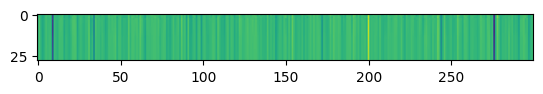

Train Epoch: 87 [2000/2360 (85%)]	 KLD Loss: 0.000253 	 NLL Loss: 8644.303711


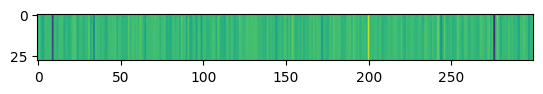

Train Epoch: 87 [2200/2360 (93%)]	 KLD Loss: 0.000090 	 NLL Loss: 8639.733398


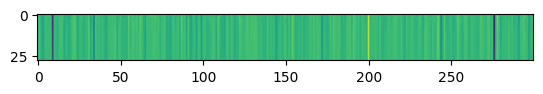

====> Epoch: 87 Average loss: 9243.1727
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2164 
Train Epoch: 88 [0/2360 (0%)]	 KLD Loss: 0.000140 	 NLL Loss: 8644.713867


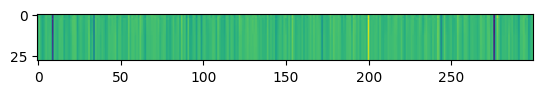

Train Epoch: 88 [200/2360 (8%)]	 KLD Loss: 0.000548 	 NLL Loss: 8646.455078


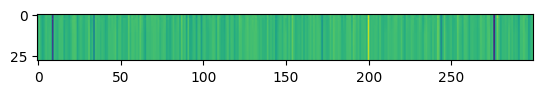

Train Epoch: 88 [400/2360 (17%)]	 KLD Loss: 0.000420 	 NLL Loss: 8646.220703


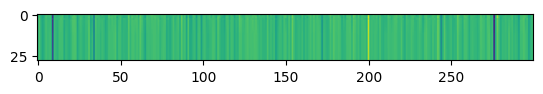

Train Epoch: 88 [600/2360 (25%)]	 KLD Loss: 0.000390 	 NLL Loss: 8595.946289


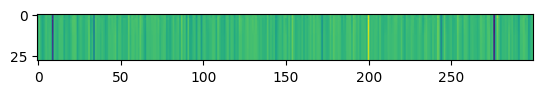

Train Epoch: 88 [800/2360 (34%)]	 KLD Loss: 0.000165 	 NLL Loss: 8643.264648


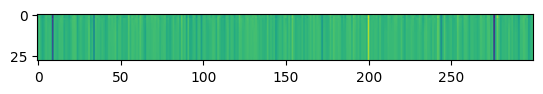

Train Epoch: 88 [1000/2360 (42%)]	 KLD Loss: 0.000180 	 NLL Loss: 8646.224609


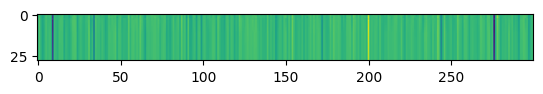

Train Epoch: 88 [1200/2360 (51%)]	 KLD Loss: 0.000128 	 NLL Loss: 8639.105469


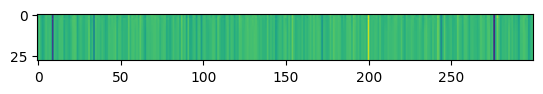

Train Epoch: 88 [1400/2360 (59%)]	 KLD Loss: 0.000308 	 NLL Loss: 8644.114258


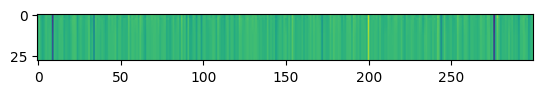

Train Epoch: 88 [1600/2360 (68%)]	 KLD Loss: 0.000208 	 NLL Loss: 8651.228516


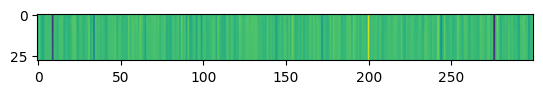

Train Epoch: 88 [1800/2360 (76%)]	 KLD Loss: 0.000218 	 NLL Loss: 8644.294922


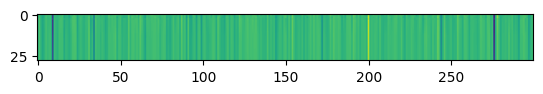

Train Epoch: 88 [2000/2360 (85%)]	 KLD Loss: 0.000118 	 NLL Loss: 8644.235352


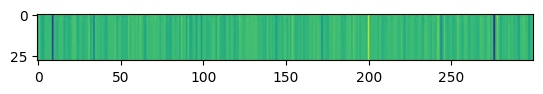

Train Epoch: 88 [2200/2360 (93%)]	 KLD Loss: 0.000158 	 NLL Loss: 8639.697266


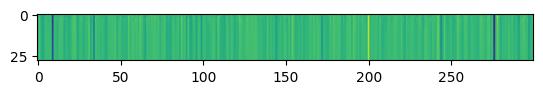

====> Epoch: 88 Average loss: 9243.1605
====> Test set loss: KLD Loss = 0.0004, NLL Loss = 8602.2359 
Train Epoch: 89 [0/2360 (0%)]	 KLD Loss: 0.000401 	 NLL Loss: 8644.681641


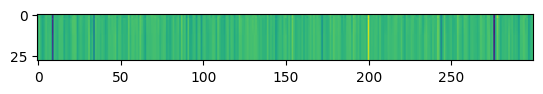

Train Epoch: 89 [200/2360 (8%)]	 KLD Loss: 0.000736 	 NLL Loss: 8646.457031


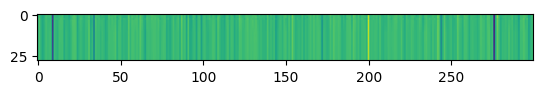

Train Epoch: 89 [400/2360 (17%)]	 KLD Loss: 0.000461 	 NLL Loss: 8646.220703


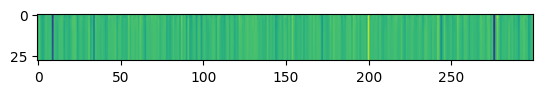

Train Epoch: 89 [600/2360 (25%)]	 KLD Loss: 0.000313 	 NLL Loss: 8595.958984


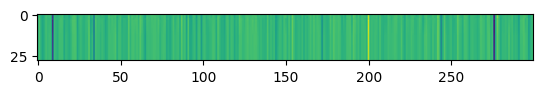

Train Epoch: 89 [800/2360 (34%)]	 KLD Loss: 0.000328 	 NLL Loss: 8643.271484


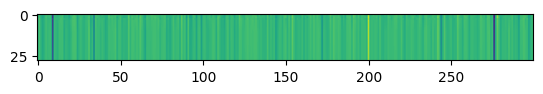

Train Epoch: 89 [1000/2360 (42%)]	 KLD Loss: 0.000366 	 NLL Loss: 8646.261719


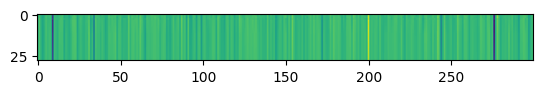

Train Epoch: 89 [1200/2360 (51%)]	 KLD Loss: 0.000155 	 NLL Loss: 8639.137695


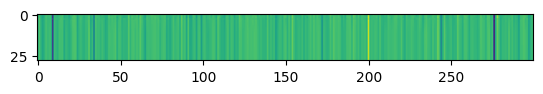

Train Epoch: 89 [1400/2360 (59%)]	 KLD Loss: 0.000084 	 NLL Loss: 8644.062500


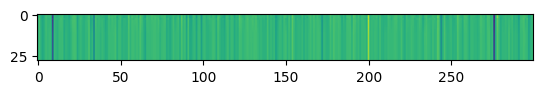

Train Epoch: 89 [1600/2360 (68%)]	 KLD Loss: 0.000203 	 NLL Loss: 8651.226562


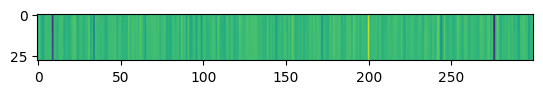

Train Epoch: 89 [1800/2360 (76%)]	 KLD Loss: 0.000153 	 NLL Loss: 8644.330078


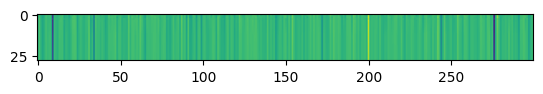

Train Epoch: 89 [2000/2360 (85%)]	 KLD Loss: 0.000225 	 NLL Loss: 8644.279297


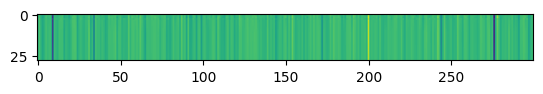

Train Epoch: 89 [2200/2360 (93%)]	 KLD Loss: 0.000440 	 NLL Loss: 8639.698242


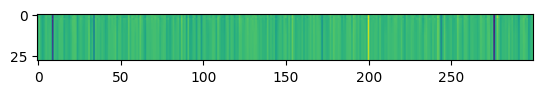

====> Epoch: 89 Average loss: 9243.1648
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2303 
Train Epoch: 90 [0/2360 (0%)]	 KLD Loss: 0.000210 	 NLL Loss: 8644.709961


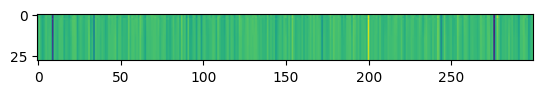

Train Epoch: 90 [200/2360 (8%)]	 KLD Loss: 0.000381 	 NLL Loss: 8646.474609


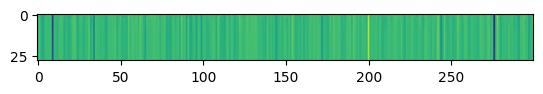

Train Epoch: 90 [400/2360 (17%)]	 KLD Loss: 0.000087 	 NLL Loss: 8646.213867


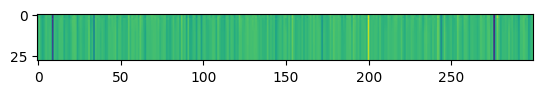

Train Epoch: 90 [600/2360 (25%)]	 KLD Loss: 0.000208 	 NLL Loss: 8595.923828


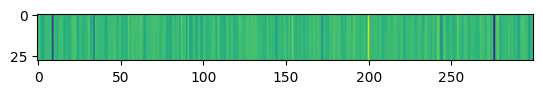

Train Epoch: 90 [800/2360 (34%)]	 KLD Loss: 0.000161 	 NLL Loss: 8643.250977


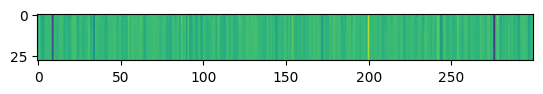

Train Epoch: 90 [1000/2360 (42%)]	 KLD Loss: 0.000578 	 NLL Loss: 8646.212891


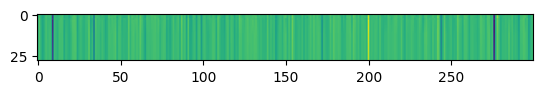

Train Epoch: 90 [1200/2360 (51%)]	 KLD Loss: 0.000198 	 NLL Loss: 8639.126953


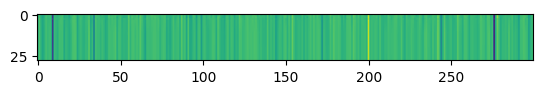

Train Epoch: 90 [1400/2360 (59%)]	 KLD Loss: 0.000428 	 NLL Loss: 8644.080078


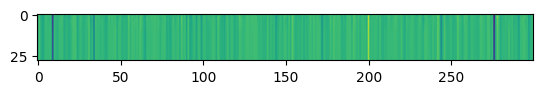

Train Epoch: 90 [1600/2360 (68%)]	 KLD Loss: 0.000315 	 NLL Loss: 8651.275391


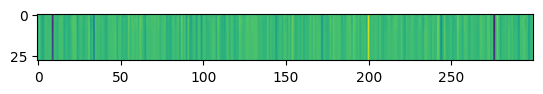

Train Epoch: 90 [1800/2360 (76%)]	 KLD Loss: 0.000073 	 NLL Loss: 8644.278320


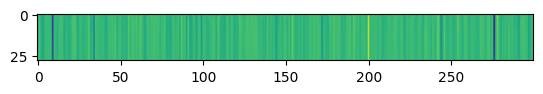

Train Epoch: 90 [2000/2360 (85%)]	 KLD Loss: 0.000145 	 NLL Loss: 8644.259766


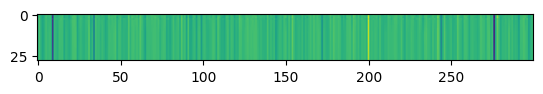

Train Epoch: 90 [2200/2360 (93%)]	 KLD Loss: 0.000103 	 NLL Loss: 8639.723633


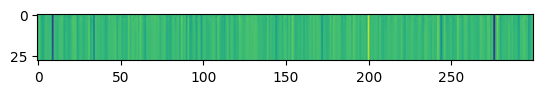

====> Epoch: 90 Average loss: 9243.1630
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2094 
Train Epoch: 91 [0/2360 (0%)]	 KLD Loss: 0.000070 	 NLL Loss: 8644.666016


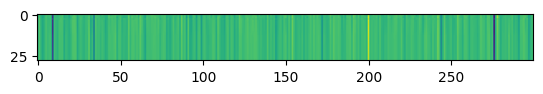

Train Epoch: 91 [200/2360 (8%)]	 KLD Loss: 0.000238 	 NLL Loss: 8646.466797


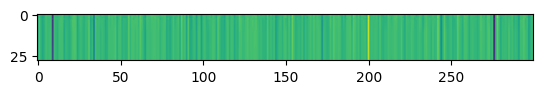

Train Epoch: 91 [400/2360 (17%)]	 KLD Loss: 0.000073 	 NLL Loss: 8646.217773


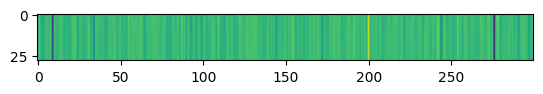

Train Epoch: 91 [600/2360 (25%)]	 KLD Loss: 0.000195 	 NLL Loss: 8595.934570


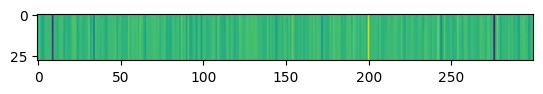

Train Epoch: 91 [800/2360 (34%)]	 KLD Loss: 0.000058 	 NLL Loss: 8643.255859


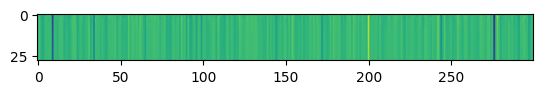

Train Epoch: 91 [1000/2360 (42%)]	 KLD Loss: 0.000130 	 NLL Loss: 8646.262695


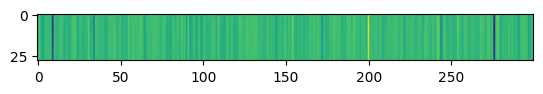

Train Epoch: 91 [1200/2360 (51%)]	 KLD Loss: 0.000130 	 NLL Loss: 8639.123047


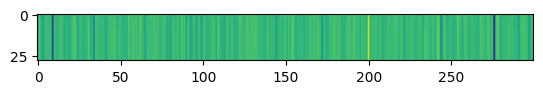

Train Epoch: 91 [1400/2360 (59%)]	 KLD Loss: 0.000621 	 NLL Loss: 8644.083008


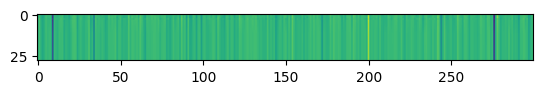

Train Epoch: 91 [1600/2360 (68%)]	 KLD Loss: 0.000448 	 NLL Loss: 8651.252930


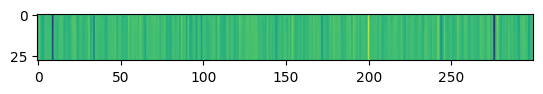

Train Epoch: 91 [1800/2360 (76%)]	 KLD Loss: 0.000598 	 NLL Loss: 8644.314453


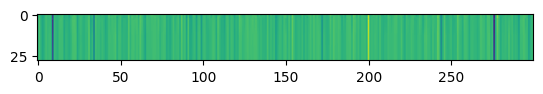

Train Epoch: 91 [2000/2360 (85%)]	 KLD Loss: 0.000323 	 NLL Loss: 8644.291016


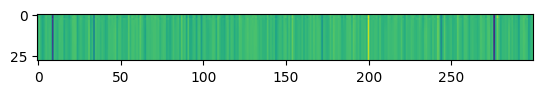

Train Epoch: 91 [2200/2360 (93%)]	 KLD Loss: 0.000253 	 NLL Loss: 8639.701172


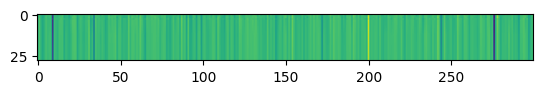

====> Epoch: 91 Average loss: 9243.1720
====> Test set loss: KLD Loss = 0.0005, NLL Loss = 8602.2287 
Train Epoch: 92 [0/2360 (0%)]	 KLD Loss: 0.000531 	 NLL Loss: 8644.701172


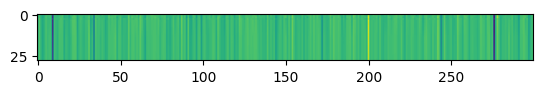

Train Epoch: 92 [200/2360 (8%)]	 KLD Loss: 0.000471 	 NLL Loss: 8646.461914


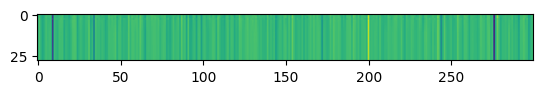

Train Epoch: 92 [400/2360 (17%)]	 KLD Loss: 0.000293 	 NLL Loss: 8646.194336


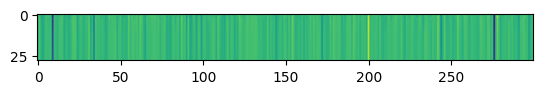

Train Epoch: 92 [600/2360 (25%)]	 KLD Loss: 0.000783 	 NLL Loss: 8595.931641


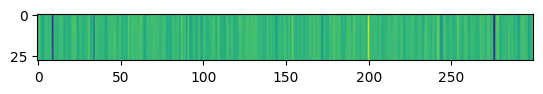

Train Epoch: 92 [800/2360 (34%)]	 KLD Loss: 0.005189 	 NLL Loss: 8643.431641


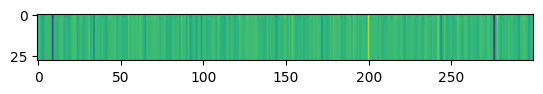

Train Epoch: 92 [1000/2360 (42%)]	 KLD Loss: 0.002140 	 NLL Loss: 8646.233398


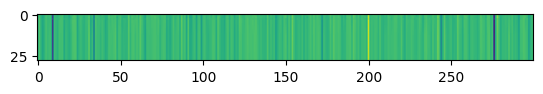

Train Epoch: 92 [1200/2360 (51%)]	 KLD Loss: 0.001592 	 NLL Loss: 8639.112305


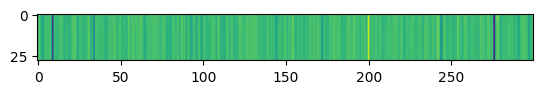

Train Epoch: 92 [1400/2360 (59%)]	 KLD Loss: 0.000683 	 NLL Loss: 8644.197266


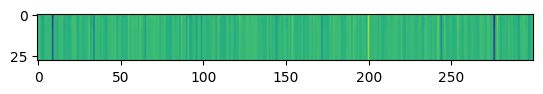

Train Epoch: 92 [1600/2360 (68%)]	 KLD Loss: 0.000222 	 NLL Loss: 8651.328125


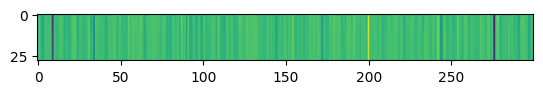

Train Epoch: 92 [1800/2360 (76%)]	 KLD Loss: 0.000203 	 NLL Loss: 8644.307617


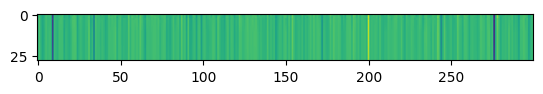

Train Epoch: 92 [2000/2360 (85%)]	 KLD Loss: 0.000386 	 NLL Loss: 8644.240234


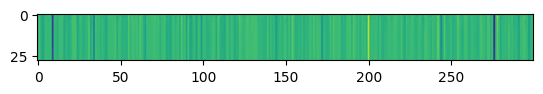

Train Epoch: 92 [2200/2360 (93%)]	 KLD Loss: 0.000148 	 NLL Loss: 8639.724609


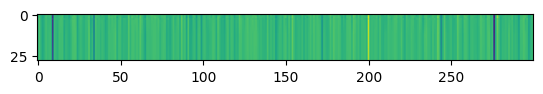

====> Epoch: 92 Average loss: 9243.1887
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2474 
Train Epoch: 93 [0/2360 (0%)]	 KLD Loss: 0.000123 	 NLL Loss: 8644.695312


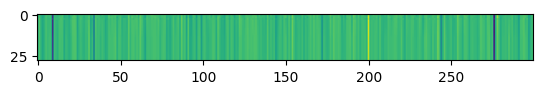

Train Epoch: 93 [200/2360 (8%)]	 KLD Loss: 0.000155 	 NLL Loss: 8646.517578


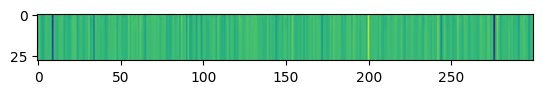

Train Epoch: 93 [400/2360 (17%)]	 KLD Loss: 0.000061 	 NLL Loss: 8646.291016


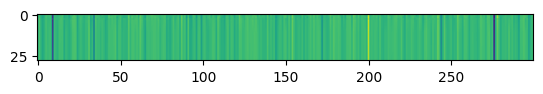

Train Epoch: 93 [600/2360 (25%)]	 KLD Loss: 0.000123 	 NLL Loss: 8595.901367


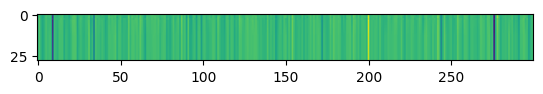

Train Epoch: 93 [800/2360 (34%)]	 KLD Loss: 0.000100 	 NLL Loss: 8643.250977


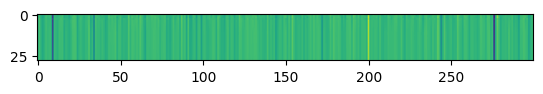

Train Epoch: 93 [1000/2360 (42%)]	 KLD Loss: 0.000085 	 NLL Loss: 8646.227539


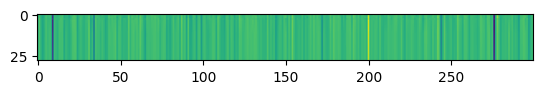

Train Epoch: 93 [1200/2360 (51%)]	 KLD Loss: 0.000135 	 NLL Loss: 8639.163086


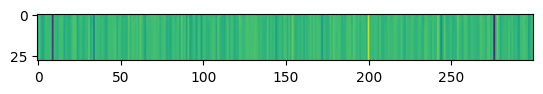

Train Epoch: 93 [1400/2360 (59%)]	 KLD Loss: 0.000260 	 NLL Loss: 8644.125000


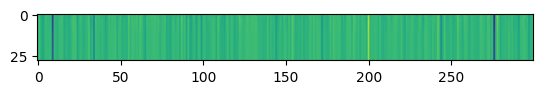

Train Epoch: 93 [1600/2360 (68%)]	 KLD Loss: 0.000083 	 NLL Loss: 8651.232422


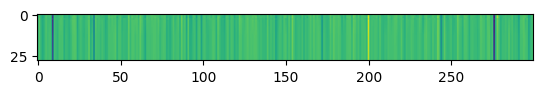

Train Epoch: 93 [1800/2360 (76%)]	 KLD Loss: 0.000105 	 NLL Loss: 8644.325195


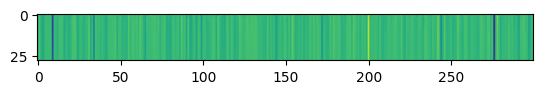

Train Epoch: 93 [2000/2360 (85%)]	 KLD Loss: 0.000135 	 NLL Loss: 8644.247070


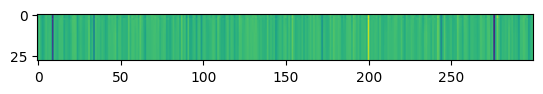

Train Epoch: 93 [2200/2360 (93%)]	 KLD Loss: 0.000054 	 NLL Loss: 8639.699219


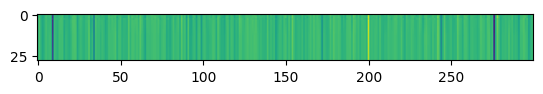

====> Epoch: 93 Average loss: 9243.1631
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2325 
Train Epoch: 94 [0/2360 (0%)]	 KLD Loss: 0.000103 	 NLL Loss: 8644.706055


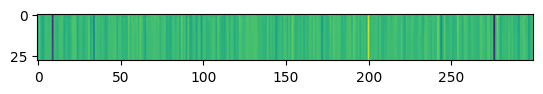

Train Epoch: 94 [200/2360 (8%)]	 KLD Loss: 0.000128 	 NLL Loss: 8646.480469


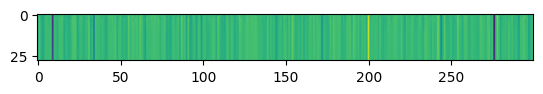

Train Epoch: 94 [400/2360 (17%)]	 KLD Loss: 0.000070 	 NLL Loss: 8646.236328


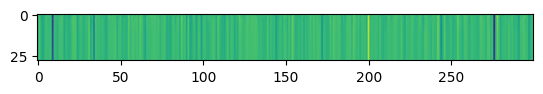

Train Epoch: 94 [600/2360 (25%)]	 KLD Loss: 0.000140 	 NLL Loss: 8595.912109


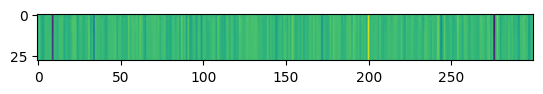

Train Epoch: 94 [800/2360 (34%)]	 KLD Loss: 0.000125 	 NLL Loss: 8643.261719


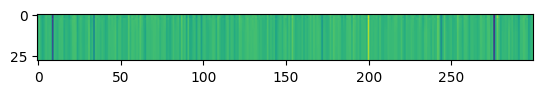

Train Epoch: 94 [1000/2360 (42%)]	 KLD Loss: 0.000077 	 NLL Loss: 8646.223633


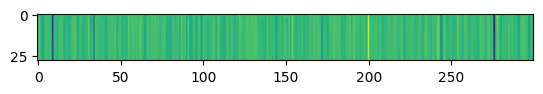

Train Epoch: 94 [1200/2360 (51%)]	 KLD Loss: 0.000080 	 NLL Loss: 8639.125977


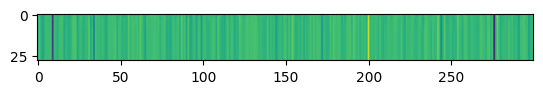

Train Epoch: 94 [1400/2360 (59%)]	 KLD Loss: 0.000047 	 NLL Loss: 8644.117188


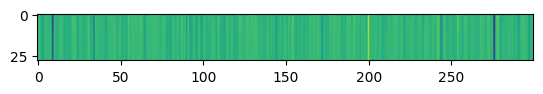

Train Epoch: 94 [1600/2360 (68%)]	 KLD Loss: 0.000068 	 NLL Loss: 8651.260742


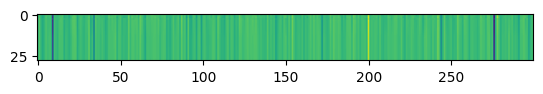

Train Epoch: 94 [1800/2360 (76%)]	 KLD Loss: 0.000088 	 NLL Loss: 8644.345703


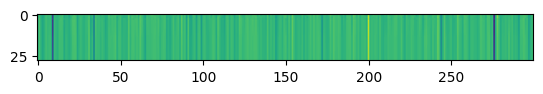

Train Epoch: 94 [2000/2360 (85%)]	 KLD Loss: 0.000118 	 NLL Loss: 8644.280273


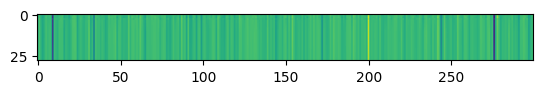

Train Epoch: 94 [2200/2360 (93%)]	 KLD Loss: 0.000046 	 NLL Loss: 8639.694336


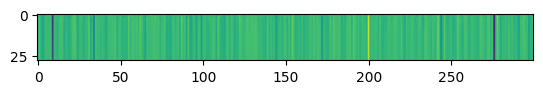

====> Epoch: 94 Average loss: 9243.1644
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2305 
Train Epoch: 95 [0/2360 (0%)]	 KLD Loss: 0.000233 	 NLL Loss: 8644.705078


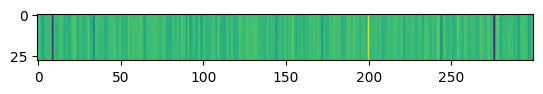

Train Epoch: 95 [200/2360 (8%)]	 KLD Loss: 0.000220 	 NLL Loss: 8646.458008


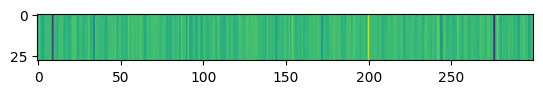

Train Epoch: 95 [400/2360 (17%)]	 KLD Loss: 0.000127 	 NLL Loss: 8646.196289


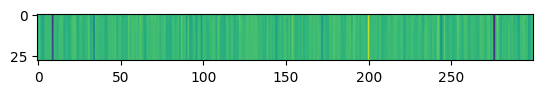

Train Epoch: 95 [600/2360 (25%)]	 KLD Loss: 0.000135 	 NLL Loss: 8595.883789


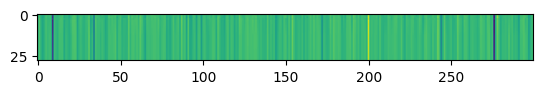

Train Epoch: 95 [800/2360 (34%)]	 KLD Loss: 0.000282 	 NLL Loss: 8643.237305


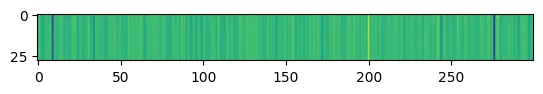

Train Epoch: 95 [1000/2360 (42%)]	 KLD Loss: 0.000333 	 NLL Loss: 8646.193359


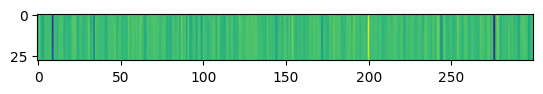

Train Epoch: 95 [1200/2360 (51%)]	 KLD Loss: 0.000108 	 NLL Loss: 8639.114258


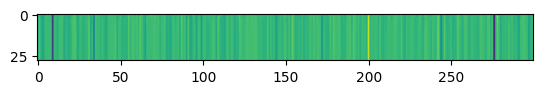

Train Epoch: 95 [1400/2360 (59%)]	 KLD Loss: 0.000236 	 NLL Loss: 8644.073242


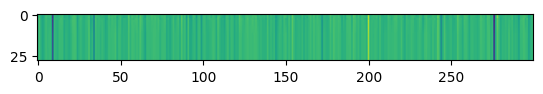

Train Epoch: 95 [1600/2360 (68%)]	 KLD Loss: 0.000130 	 NLL Loss: 8651.283203


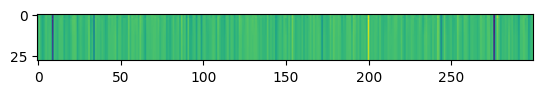

Train Epoch: 95 [1800/2360 (76%)]	 KLD Loss: 0.000115 	 NLL Loss: 8644.333984


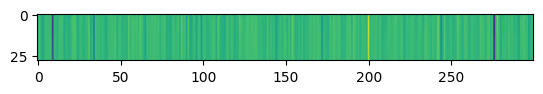

Train Epoch: 95 [2000/2360 (85%)]	 KLD Loss: 0.000260 	 NLL Loss: 8644.317383


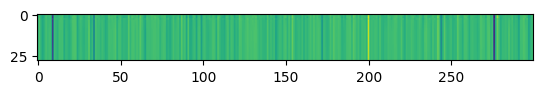

Train Epoch: 95 [2200/2360 (93%)]	 KLD Loss: 0.000089 	 NLL Loss: 8639.689453


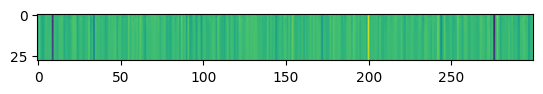

====> Epoch: 95 Average loss: 9243.1603
====> Test set loss: KLD Loss = 0.0005, NLL Loss = 8602.2063 
Train Epoch: 96 [0/2360 (0%)]	 KLD Loss: 0.000460 	 NLL Loss: 8644.680664


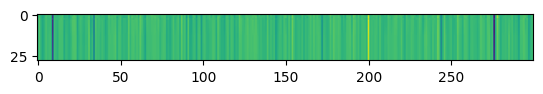

Train Epoch: 96 [200/2360 (8%)]	 KLD Loss: 0.001006 	 NLL Loss: 8646.458008


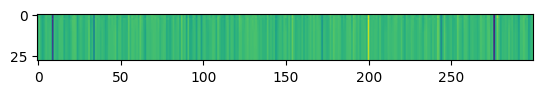

Train Epoch: 96 [400/2360 (17%)]	 KLD Loss: 0.000158 	 NLL Loss: 8646.180664


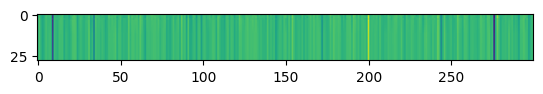

Train Epoch: 96 [600/2360 (25%)]	 KLD Loss: 0.000371 	 NLL Loss: 8595.949219


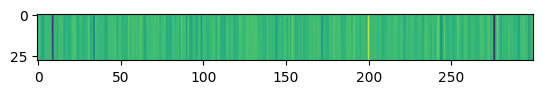

Train Epoch: 96 [800/2360 (34%)]	 KLD Loss: 0.000138 	 NLL Loss: 8643.275391


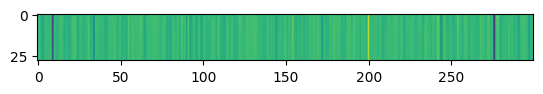

Train Epoch: 96 [1000/2360 (42%)]	 KLD Loss: 0.000125 	 NLL Loss: 8646.210938


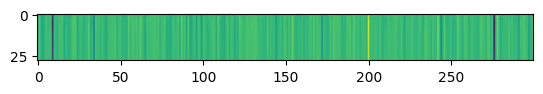

Train Epoch: 96 [1200/2360 (51%)]	 KLD Loss: 0.000128 	 NLL Loss: 8639.129883


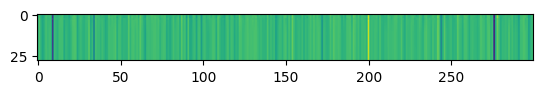

Train Epoch: 96 [1400/2360 (59%)]	 KLD Loss: 0.000260 	 NLL Loss: 8644.057617


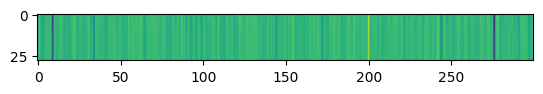

Train Epoch: 96 [1600/2360 (68%)]	 KLD Loss: 0.000155 	 NLL Loss: 8651.255859


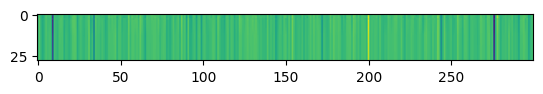

Train Epoch: 96 [1800/2360 (76%)]	 KLD Loss: 0.000163 	 NLL Loss: 8644.330078


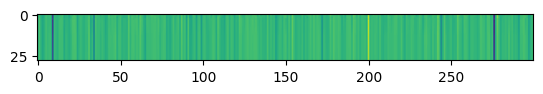

Train Epoch: 96 [2000/2360 (85%)]	 KLD Loss: 0.000325 	 NLL Loss: 8644.306641


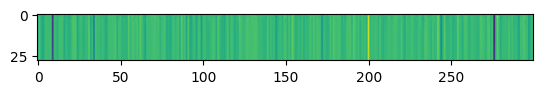

Train Epoch: 96 [2200/2360 (93%)]	 KLD Loss: 0.000150 	 NLL Loss: 8639.710938


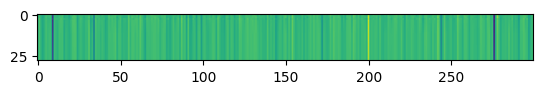

====> Epoch: 96 Average loss: 9243.1576
====> Test set loss: KLD Loss = 0.0003, NLL Loss = 8602.2085 
Train Epoch: 97 [0/2360 (0%)]	 KLD Loss: 0.000343 	 NLL Loss: 8644.681641


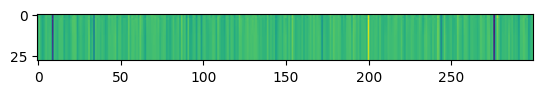

Train Epoch: 97 [200/2360 (8%)]	 KLD Loss: 0.000413 	 NLL Loss: 8646.471680


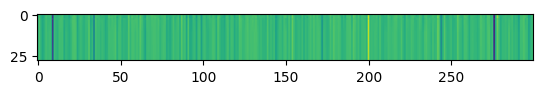

Train Epoch: 97 [400/2360 (17%)]	 KLD Loss: 0.000155 	 NLL Loss: 8646.197266


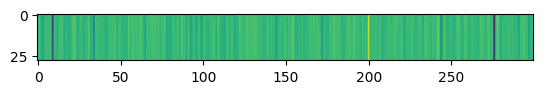

Train Epoch: 97 [600/2360 (25%)]	 KLD Loss: 0.000178 	 NLL Loss: 8595.916992


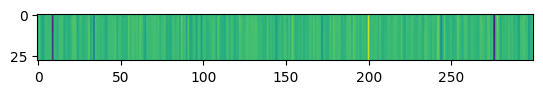

Train Epoch: 97 [800/2360 (34%)]	 KLD Loss: 0.000330 	 NLL Loss: 8643.252930


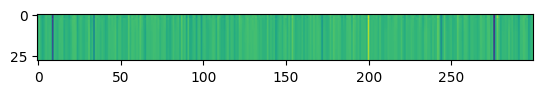

Train Epoch: 97 [1000/2360 (42%)]	 KLD Loss: 0.000203 	 NLL Loss: 8646.241211


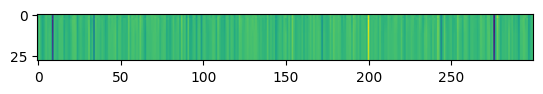

Train Epoch: 97 [1200/2360 (51%)]	 KLD Loss: 0.000193 	 NLL Loss: 8639.138672


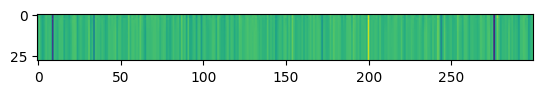

Train Epoch: 97 [1400/2360 (59%)]	 KLD Loss: 0.000218 	 NLL Loss: 8644.047852


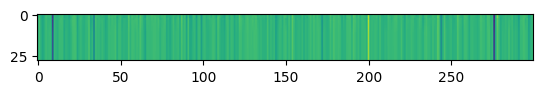

Train Epoch: 97 [1600/2360 (68%)]	 KLD Loss: 0.000451 	 NLL Loss: 8651.306641


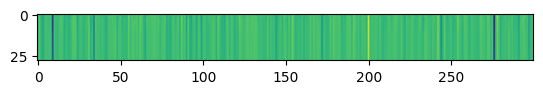

Train Epoch: 97 [1800/2360 (76%)]	 KLD Loss: 0.000586 	 NLL Loss: 8644.351562


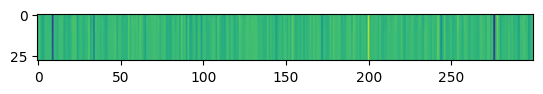

Train Epoch: 97 [2000/2360 (85%)]	 KLD Loss: 0.000373 	 NLL Loss: 8644.334961


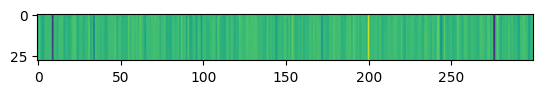

Train Epoch: 97 [2200/2360 (93%)]	 KLD Loss: 0.000107 	 NLL Loss: 8639.680664


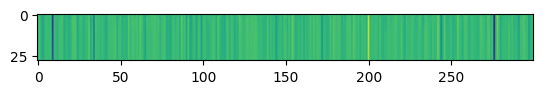

====> Epoch: 97 Average loss: 9243.1641
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2320 
Train Epoch: 98 [0/2360 (0%)]	 KLD Loss: 0.000215 	 NLL Loss: 8644.683594


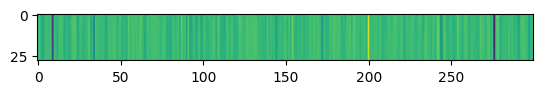

Train Epoch: 98 [200/2360 (8%)]	 KLD Loss: 0.000478 	 NLL Loss: 8646.458984


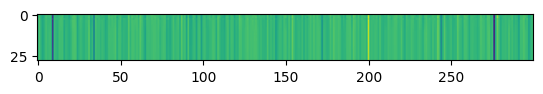

Train Epoch: 98 [400/2360 (17%)]	 KLD Loss: 0.000223 	 NLL Loss: 8646.208008


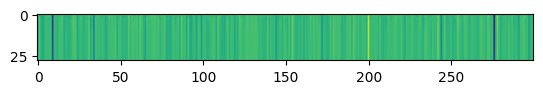

Train Epoch: 98 [600/2360 (25%)]	 KLD Loss: 0.000333 	 NLL Loss: 8595.896484


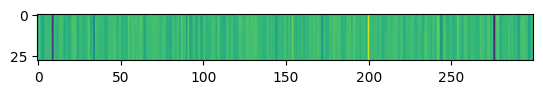

Train Epoch: 98 [800/2360 (34%)]	 KLD Loss: 0.000281 	 NLL Loss: 8643.239258


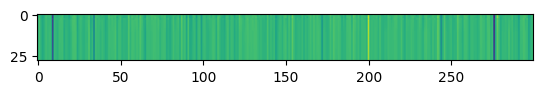

Train Epoch: 98 [1000/2360 (42%)]	 KLD Loss: 0.000175 	 NLL Loss: 8646.193359


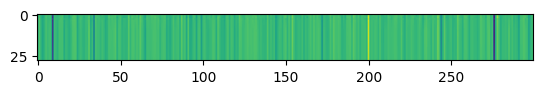

Train Epoch: 98 [1200/2360 (51%)]	 KLD Loss: 0.000120 	 NLL Loss: 8639.117188


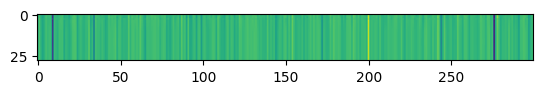

Train Epoch: 98 [1400/2360 (59%)]	 KLD Loss: 0.000155 	 NLL Loss: 8644.011719


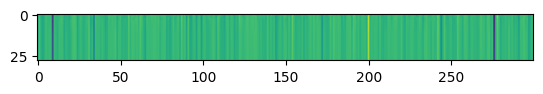

Train Epoch: 98 [1600/2360 (68%)]	 KLD Loss: 0.000127 	 NLL Loss: 8651.199219


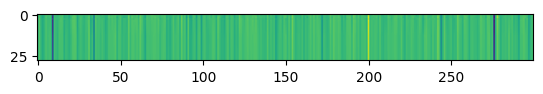

Train Epoch: 98 [1800/2360 (76%)]	 KLD Loss: 0.000150 	 NLL Loss: 8644.330078


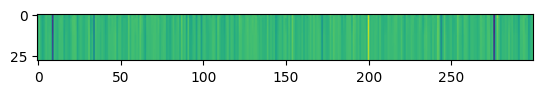

Train Epoch: 98 [2000/2360 (85%)]	 KLD Loss: 0.000528 	 NLL Loss: 8644.320312


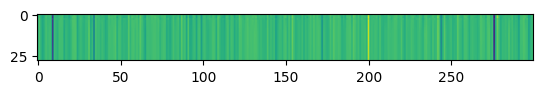

Train Epoch: 98 [2200/2360 (93%)]	 KLD Loss: 0.000138 	 NLL Loss: 8639.720703


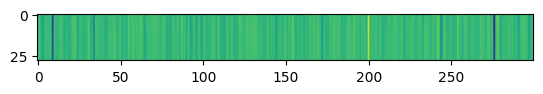

====> Epoch: 98 Average loss: 9243.1670
====> Test set loss: KLD Loss = 0.0001, NLL Loss = 8602.2219 
Train Epoch: 99 [0/2360 (0%)]	 KLD Loss: 0.000135 	 NLL Loss: 8644.675781


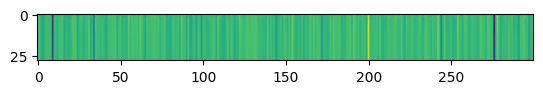

Train Epoch: 99 [200/2360 (8%)]	 KLD Loss: 0.000453 	 NLL Loss: 8646.466797


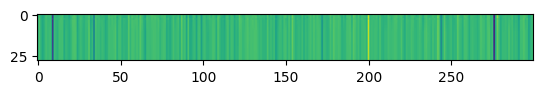

Train Epoch: 99 [400/2360 (17%)]	 KLD Loss: 0.000143 	 NLL Loss: 8646.197266


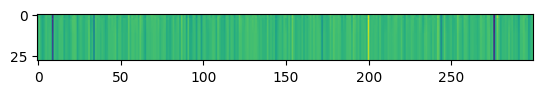

Train Epoch: 99 [600/2360 (25%)]	 KLD Loss: 0.000140 	 NLL Loss: 8595.911133


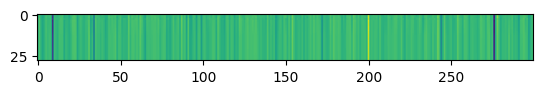

Train Epoch: 99 [800/2360 (34%)]	 KLD Loss: 0.000183 	 NLL Loss: 8643.227539


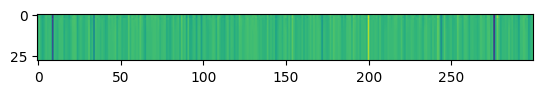

Train Epoch: 99 [1000/2360 (42%)]	 KLD Loss: 0.000213 	 NLL Loss: 8646.228516


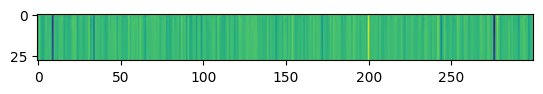

Train Epoch: 99 [1200/2360 (51%)]	 KLD Loss: 0.000050 	 NLL Loss: 8639.142578


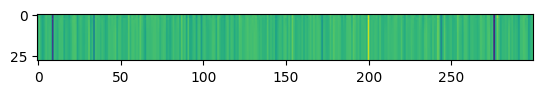

Train Epoch: 99 [1400/2360 (59%)]	 KLD Loss: 0.000250 	 NLL Loss: 8644.012695


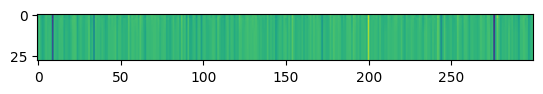

Train Epoch: 99 [1600/2360 (68%)]	 KLD Loss: 0.000149 	 NLL Loss: 8651.272461


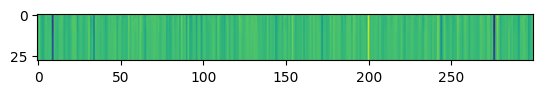

Train Epoch: 99 [1800/2360 (76%)]	 KLD Loss: 0.000273 	 NLL Loss: 8644.349609


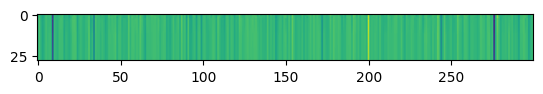

Train Epoch: 99 [2000/2360 (85%)]	 KLD Loss: 0.000285 	 NLL Loss: 8644.333984


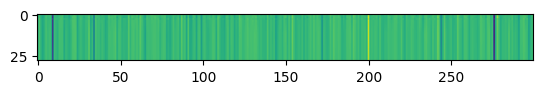

Train Epoch: 99 [2200/2360 (93%)]	 KLD Loss: 0.000130 	 NLL Loss: 8639.700195


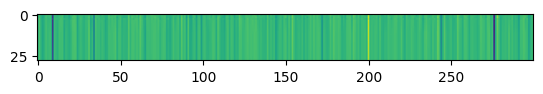

====> Epoch: 99 Average loss: 9243.1582
====> Test set loss: KLD Loss = 0.0003, NLL Loss = 8602.2233 
Train Epoch: 100 [0/2360 (0%)]	 KLD Loss: 0.000251 	 NLL Loss: 8644.693359


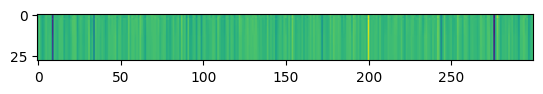

Train Epoch: 100 [200/2360 (8%)]	 KLD Loss: 0.000250 	 NLL Loss: 8646.466797


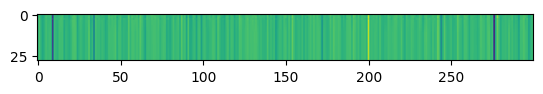

Train Epoch: 100 [400/2360 (17%)]	 KLD Loss: 0.000218 	 NLL Loss: 8646.200195


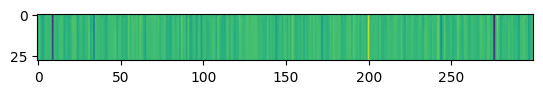

Train Epoch: 100 [600/2360 (25%)]	 KLD Loss: 0.000128 	 NLL Loss: 8595.893555


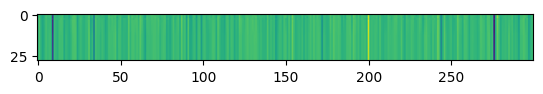

Train Epoch: 100 [800/2360 (34%)]	 KLD Loss: 0.000168 	 NLL Loss: 8643.217773


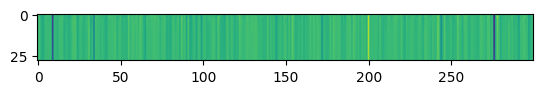

Train Epoch: 100 [1000/2360 (42%)]	 KLD Loss: 0.000223 	 NLL Loss: 8646.214844


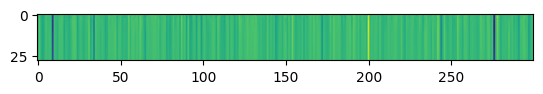

Train Epoch: 100 [1200/2360 (51%)]	 KLD Loss: 0.000115 	 NLL Loss: 8639.115234


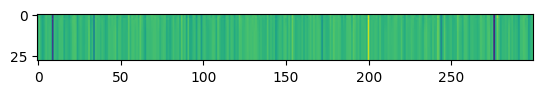

Train Epoch: 100 [1400/2360 (59%)]	 KLD Loss: 0.000304 	 NLL Loss: 8644.037109


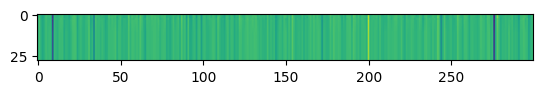

Train Epoch: 100 [1600/2360 (68%)]	 KLD Loss: 0.000278 	 NLL Loss: 8651.291016


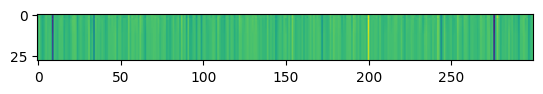

Train Epoch: 100 [1800/2360 (76%)]	 KLD Loss: 0.000140 	 NLL Loss: 8644.325195


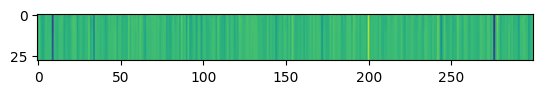

Train Epoch: 100 [2000/2360 (85%)]	 KLD Loss: 0.000210 	 NLL Loss: 8644.315430


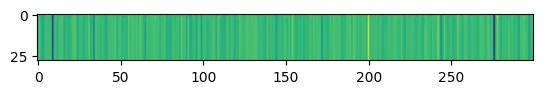

Train Epoch: 100 [2200/2360 (93%)]	 KLD Loss: 0.000090 	 NLL Loss: 8639.685547


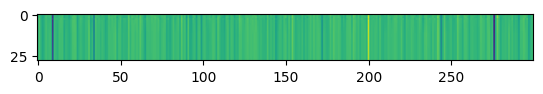

====> Epoch: 100 Average loss: 9243.1626
====> Test set loss: KLD Loss = 0.0002, NLL Loss = 8602.2118 


In [ ]:
x_dim = 300
h_dim = 2*50   # 2 Essays , each considered as one vector
z_dim = 10
n_layers = 1 
n_epochs = 100
clip = 10
learning_rate = 0.0081
seed = 128
print_every = 10 # batches
save_every = 1 # epochs
hidden =[]
losses = []
local_loss = np.load("/content/drive/MyDrive/Project/losses_save_final.npy")
local_loss = int(np.sum(local_loss))

def train(epoch):
    train_loss = 0
    for batch_idx,(data,target) in enumerate(train_loader):

        data = data.squeeze().transpose(0, 1)  # (seq, batch, elem)
        data = (data - data.min()) / (data.max() - data.min())

        # forward + backward + optimize
        optimizer.zero_grad()
        kld_loss, nll_loss,h, class_vector , domain_vector ,  diff_loss , _, _ = model(data)
        hidden = h
        sep_loss = kld_loss + nll_loss + diff_loss + local_loss
        loss = sep_loss + cls_dom_loss(target , class_vector , domain_vector) 
        loss.backward()
        optimizer.step()

        # grad norm clipping, only in pytorch version >= 1.10
        nn.utils.clip_grad_norm_(model.parameters(), clip)

        # printing
        if batch_idx % print_every == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\t KLD Loss: {:.6f} \t NLL Loss: {:.6f}'.format(
                epoch, batch_idx * batch_size, batch_size *
                (len(train_loader.dataset)//batch_size),
                100. * batch_idx / len(train_loader),
                kld_loss / batch_size,
                nll_loss / batch_size))

            sample = model.sample(torch.tensor(28, device=device))
            plt.imshow(sample.to(torch.device('cpu')).numpy())
            plt.pause(1e-6)

        train_loss += loss.item()
    losses.append(train_loss)
    print('====> Epoch: {} Average loss: {:.4f}'.format(
        epoch, train_loss / len(train_loader.dataset)))


def test(epoch):
    """uses test data to evaluate 
    likelihood of the model"""

    mean_kld_loss, mean_nll_loss = 0, 0
    with torch.no_grad():
        for i, test in enumerate(test_loader):

            data = test[0]
            class_labels = test[1][0]
            domain_labels = test[1][1]
            data = data.squeeze().transpose(0, 1)
            data = (data - data.min()) / (data.max() - data.min())

            kld_loss, nll_loss,h,class_vector,domain_vector, ka,_, _ = model(data)
            mean_kld_loss += kld_loss.item()
            mean_nll_loss += nll_loss.item()

    mean_kld_loss /= len(test_loader.dataset)
    mean_nll_loss /= len(test_loader.dataset)

    print('====> Test set loss: KLD Loss = {:.4f}, NLL Loss = {:.4f} '.format(
        mean_kld_loss, mean_nll_loss))

model = VRNN(x_dim, h_dim, z_dim ,n_layers, classes ,domains)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)


for epoch in range(1, n_epochs + 1):

    # training + testing
    train(epoch)
    test(epoch)

    # saving model
    # if epoch % save_every == 1:
    #     fn = 'saves/vrnn_state_dict_'+str(epoch)+'.pth'
    #     torch.save(model.state_dict(), fn)
    #     print('Saved model to '+fn)



In [ ]:
torch.save(model.state_dict(),"weights")

9243.5591 => total loss after 10 epochs for alpha = 0.008

9244.0948 => total loss after 10 epochs
for alpha = 0.006

9243.9320 => total loss after 10 epochs for alpha = 0.007

9243.9994 => total loss after 10 epochs for alpha = 0.009

